# Analysis of the 2D ERIC (2DE) and 2D ERIC model with excitability (2DE+ex)

## The locally coupled 2D ERIC model with biharmonic coupling:

The phase equation is given by:
$$ \frac{\mathrm{d}\theta_{i,j}}{\mathrm{d}t}  = \omega_{i,j} + K \Big( \sin(\theta_{i-1,j} -\theta_{i,j} ) + \sin(\theta_{i+1,j} -\theta_{i,j} ) + \sin(\theta_{i,j-1} -\theta_{i,j} ) + \sin(\theta_{i,j+1} -\theta_{i,j} )  + \Lambda \big ( \sin^2(\theta_{i-1,j} -\theta_{i,j} ) + \sin^2(\theta_{i+1,j} -\theta_{i,j} ) + \sin^2(\theta_{i,j-1} -\theta_{i,j} ) + \sin^2(\theta_{i,j+1} -\theta_{i,j} ) \big) \Big)  $$

We will randomly sample initial phases from a uniform distribution with varying widths. We will vary $K$ and $\Lambda$ to see how the phase maps change. The frequencies will also be randomly sampled from a uniform distribution with the width being chosen to be different to see the effects of heterogenity of frequencies on the phase maps.  

We will use open boundary conditions on the lattice.


In [1]:
import numpy as np
import matplotlib.pyplot as plt

from scipy.stats import truncnorm

## Uniform frequency distributions

# Random seed 1

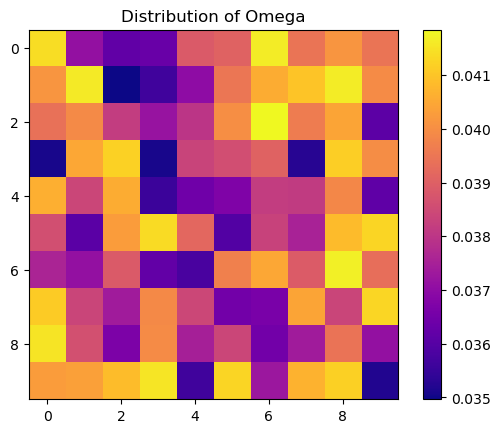

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Define the omega distribution

def omega_dist(w_min, w_max,N):
    omega = np.random.uniform(w_min, w_max, size=(N,N))
    return omega

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


# Plot the omega values as a heatmap
plt.imshow(omega_dist(w_min,w_max,10), cmap='plasma')
plt.colorbar()
plt.title('Distribution of Omega')
plt.show()

# Random seed 2

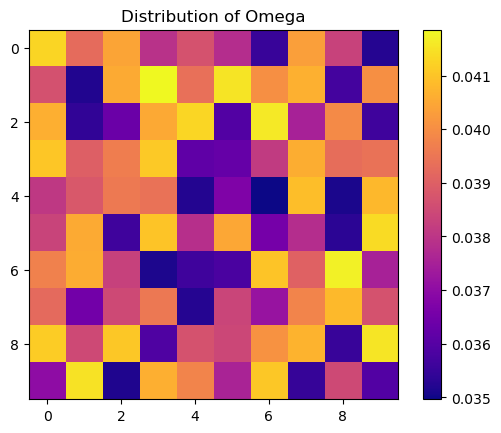

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(54321)

# Define the omega distribution

def omega_dist(w_min, w_max,N):
    omega = np.random.uniform(w_min, w_max, size=(N,N))
    return omega

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


# Plot the omega values as a heatmap
plt.imshow(omega_dist(w_min,w_max,10), cmap='plasma')
plt.colorbar()
plt.title('Distribution of Omega')
plt.show()

# Random seed 3

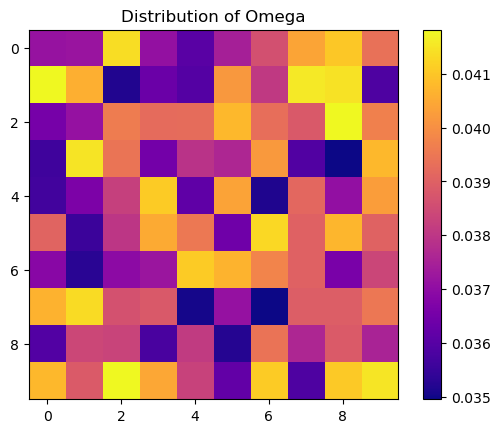

In [4]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(23456)

# Define the omega distribution

def omega_dist(w_min, w_max,N):
    omega = np.random.uniform(w_min, w_max, size=(N,N))
    return omega

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


# Plot the omega values as a heatmap
plt.imshow(omega_dist(w_min,w_max,10), cmap='plasma')
plt.colorbar()
plt.title('Distribution of Omega')
plt.show()

# Random seed 4

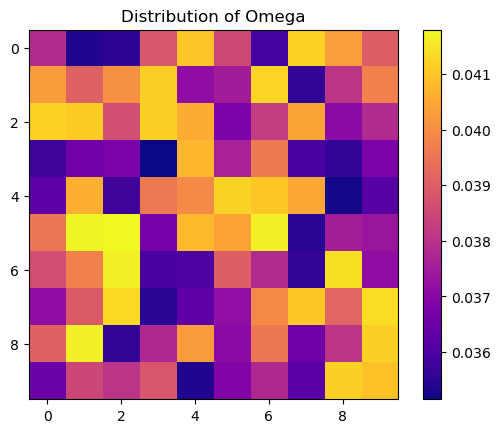

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(65432)

# Define the omega distribution

def omega_dist(w_min, w_max,N):
    omega = np.random.uniform(w_min, w_max, size=(N,N))
    return omega

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


# Plot the omega values as a heatmap
plt.imshow(omega_dist(w_min,w_max,10), cmap='plasma')
plt.colorbar()
plt.title('Distribution of Omega')
plt.show()

## Uniform initial phase distributions

# Random seed 1

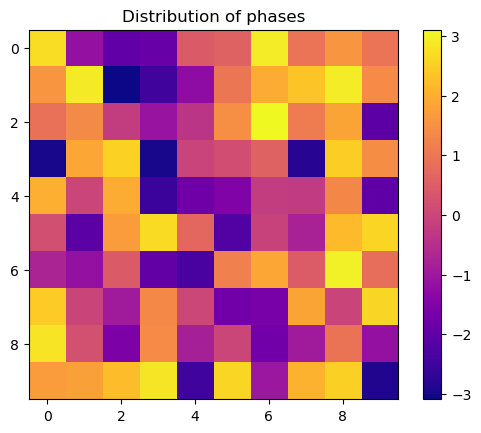

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Define the phase distribution

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, size=(N,N))
    return phase


# Plot the omega values as a heatmap
plt.imshow(phase_random(10), cmap='plasma')
plt.colorbar()
plt.title('Distribution of phases')
plt.show()

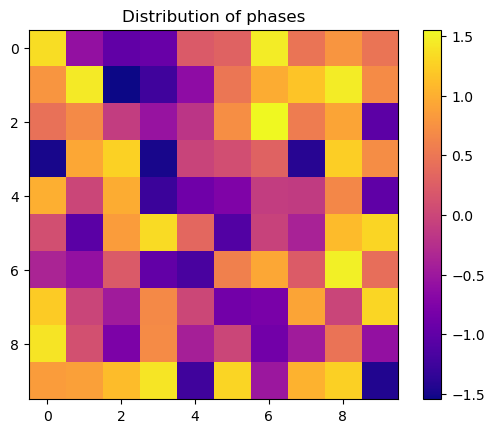

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Define the phase distribution

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, size=(N,N))
    return phase


# Plot the omega values as a heatmap
plt.imshow(phase_narrow(10), cmap='plasma')
plt.colorbar()
plt.title('Distribution of phases')
plt.show()

## Width of initial phase distribution will change

### Random seed 1

$K$ and $\Lambda$ are chosen from the $10 \times 10$ grids generated elsewhere. This can be changed by the user according to what phase dynamics they are interested in.

## Phase maps at different times

## Narrowp1: $\theta_{in} = [0,\pi/2]$

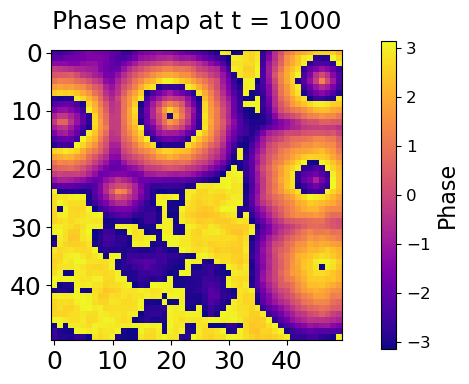

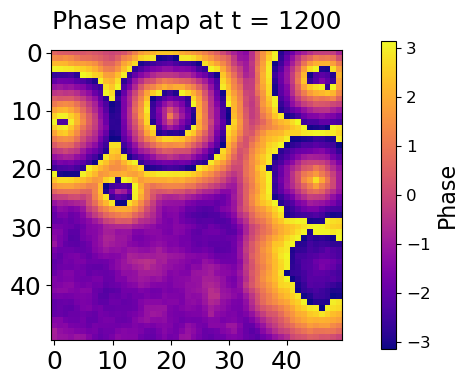

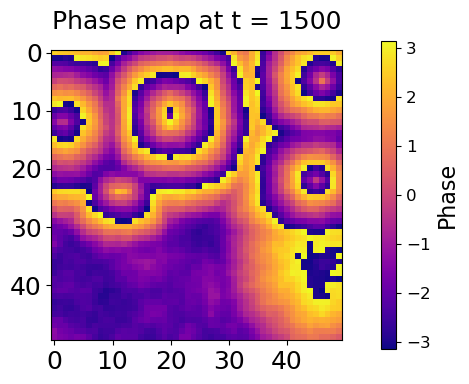

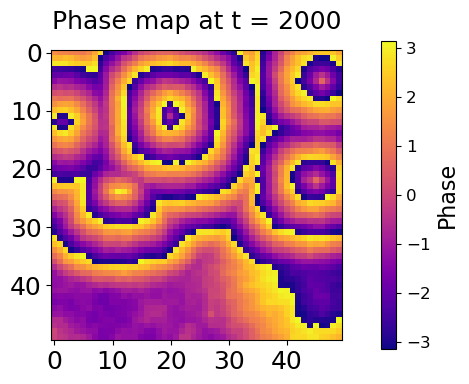

In [9]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(0, np.pi/2, (N,N))  # narrowp1
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# define the model

def ERIC_2d(phi,N, K, omega, L):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phasemap

def phase_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
# uncomment to save file
#    plt.savefig("Phase_map_at_t = " + str(T) + "narrowp1_expf_incond1.jpg", dpi = 300)
    plt.show()
    
# Chosen limits of frequency distribution  
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150

# homogenous initial phase
 
# angle = np.pi/4

# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the X value at the final step using a colormap

#T_list = [100, 500, 1000] #The user can also visualize the transient dynamics if they desire


T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial)


## Narrowp2: $\theta_{in}=[0,\pi]$

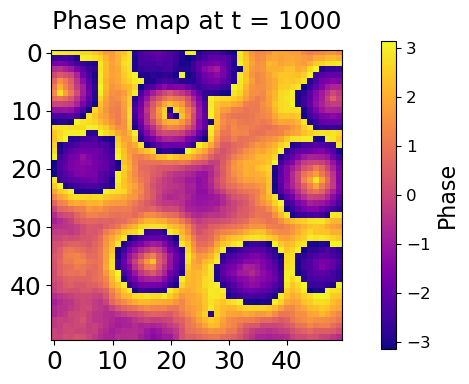

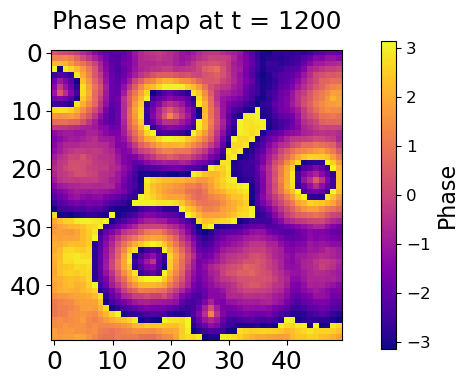

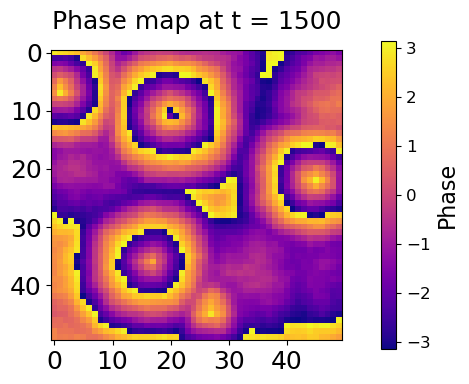

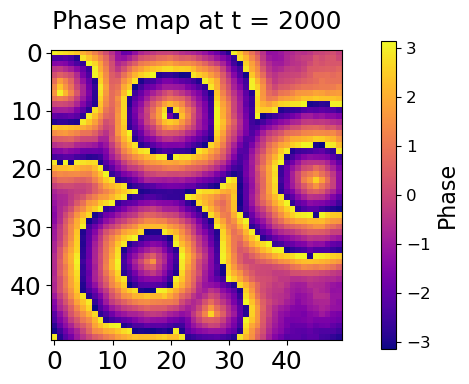

In [11]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(0, np.pi, (N,N))  # narrowp2
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# define the model

def ERIC_2d(phi,N, K, omega, L):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phasemap

def phase_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
# uncomment to save file
#    plt.savefig("Phase_map_at_t = " + str(T) + "narrowp2_expf_incond1.jpg", dpi = 300)
    plt.show()
    
# Chosen limits of frequency distribution  
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150

# homogenous initial phase
 
# angle = np.pi/4

# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the X value at the final step using a colormap

#T_list = [100, 500, 1000] #The user can also visualize the transient dynamics if they desire


T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial)


## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

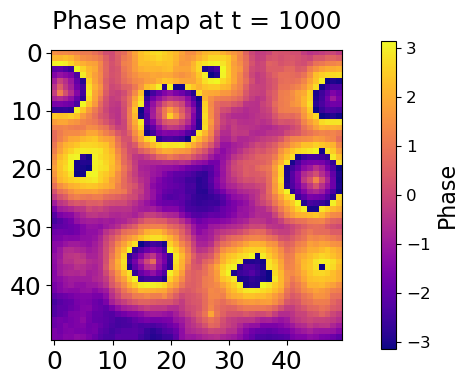

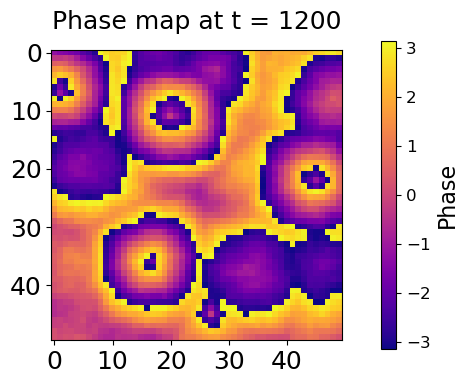

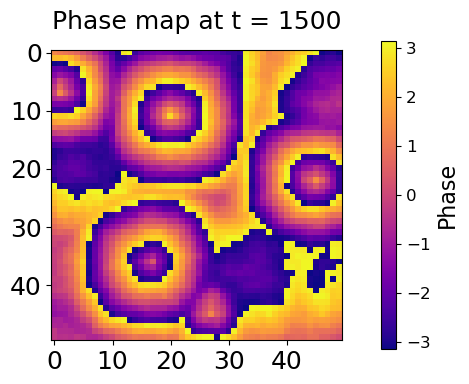

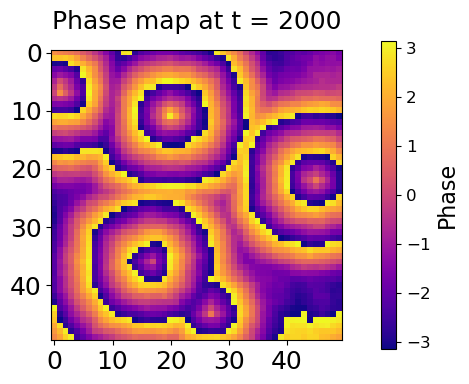

In [13]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# define the model

def ERIC_2d(phi,N, K, omega, L):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phasemap

def phase_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
# uncomment to save file
#    plt.savefig("Phase_map_at_t = " + str(T) + "narrowp3_expf_incond1.jpg", dpi = 300)
    plt.show()
    
# Chosen limits of frequency distribution  
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150

# homogenous initial phase
 
# angle = np.pi/4

# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the X value at the final step using a colormap

#T_list = [100, 500, 1000] #The user can also visualize the transient dynamics if they desire


T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial)


## Narrowp4: $\theta_{in} = [-\pi/4, \pi/4]$

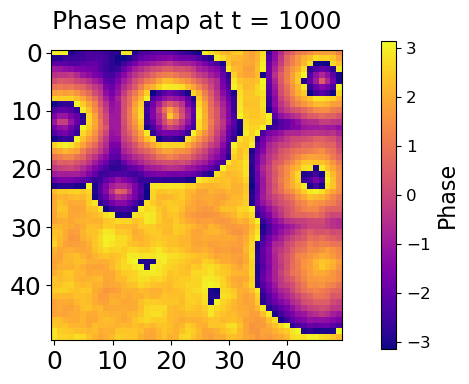

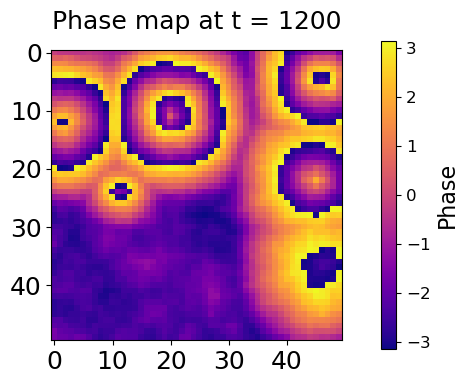

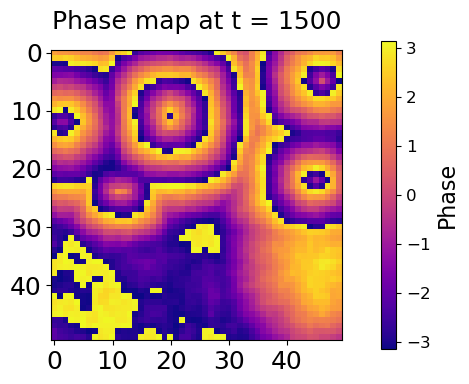

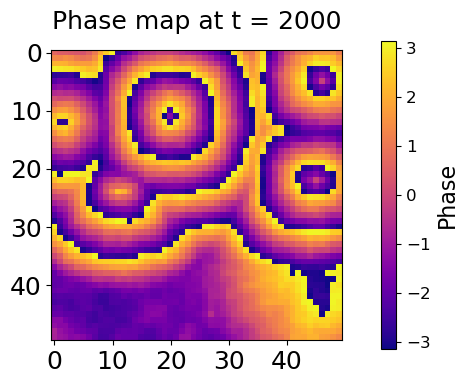

In [12]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/4, np.pi/4, (N,N))  # narrowp4
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# define the model

def ERIC_2d(phi,N, K, omega, L):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phasemap

def phase_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
# uncomment to save file
#    plt.savefig("Phase_map_at_t = " + str(T) + "narrowp4_expf_incond1.jpg", dpi = 300)
    plt.show()
    
# Chosen limits of frequency distribution  
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150

# homogenous initial phase
 
# angle = np.pi/4

# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the X value at the final step using a colormap

#T_list = [100, 500, 1000] #The user can also visualize the transient dynamics if they desire


T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial)


## Widerp1: $\theta_{in} = [-\pi/8, \pi]$

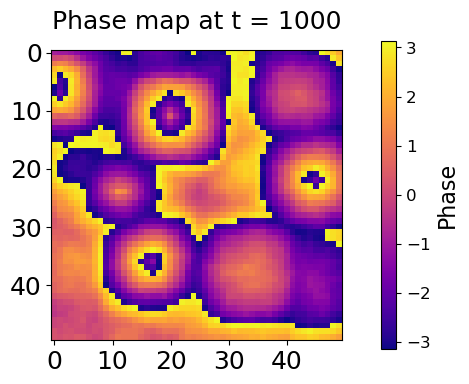

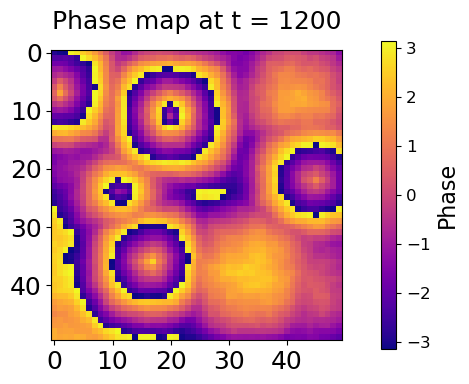

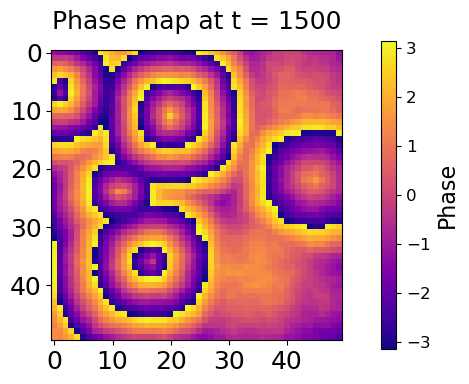

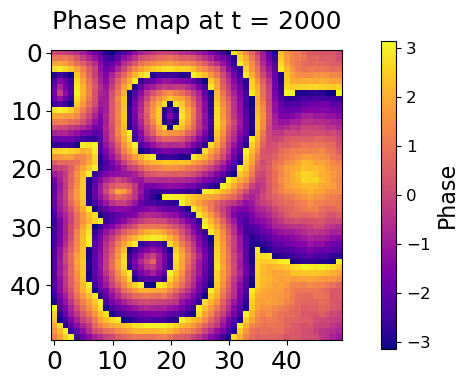

In [14]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/8, np.pi, (N,N))  # widerp1
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# define the model

def ERIC_2d(phi,N, K, omega, L):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phasemap

def phase_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
# uncomment to save file
#    plt.savefig("Phase_map_at_t = " + str(T) + "widerp1_expf_incond1.jpg", dpi = 300)
    plt.show()
    
# Chosen limits of frequency distribution  
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150

# homogenous initial phase
 
# angle = np.pi/4

# Define the model parameters
N = 50
dt = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the X value at the final step using a colormap

#T_list = [100, 500, 1000] #The user can also visualize the transient dynamics if they desire


T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial)


## Widerp2: $\theta_{in}=[-\pi/4, \pi]$

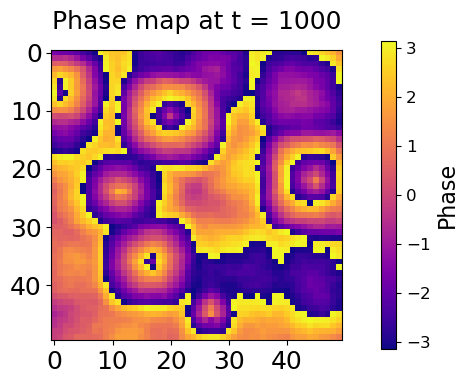

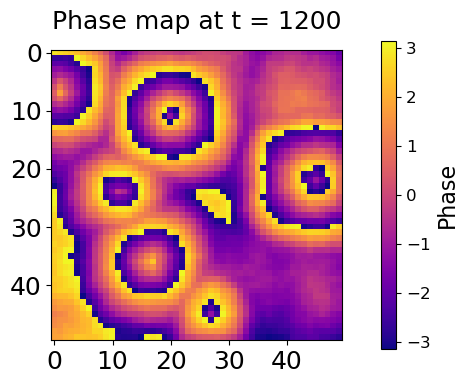

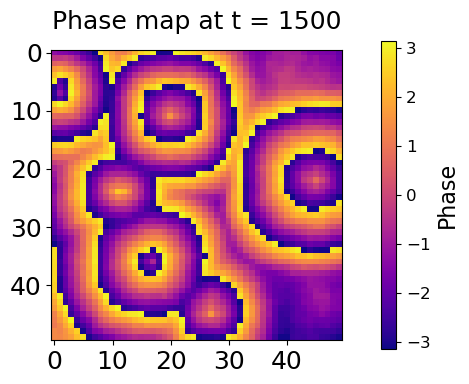

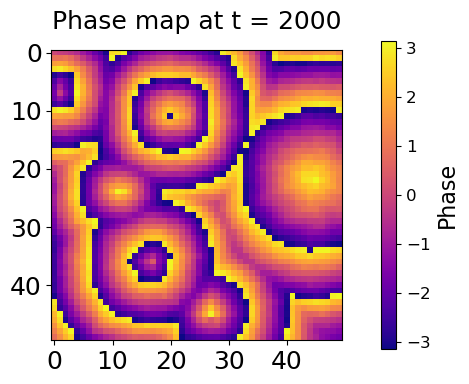

In [16]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/4, np.pi, (N,N))  # widerp2
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# define the model

def ERIC_2d(phi,N, K, omega, L):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phasemap

def phase_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
# uncomment to save file
#    plt.savefig("Phase_map_at_t = " + str(T) + "widerp2_expf_incond1.jpg", dpi = 300)
    plt.show()
    
# Chosen limits of frequency distribution  
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150

# homogenous initial phase
 
# angle = np.pi/4

# Define the model parameters
N = 50
dt = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the X value at the final step using a colormap

#T_list = [100, 500, 1000] #The user can also visualize the transient dynamics if they desire


T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial)


## Widerp3: $\theta_{in}=[-3\pi/8, \pi]$

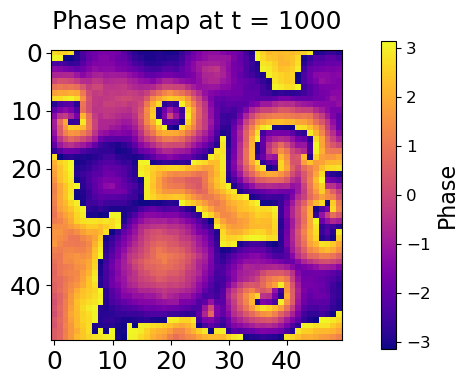

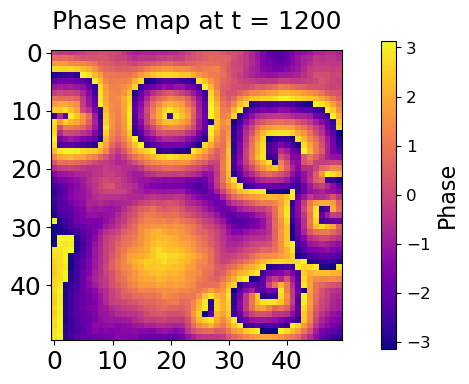

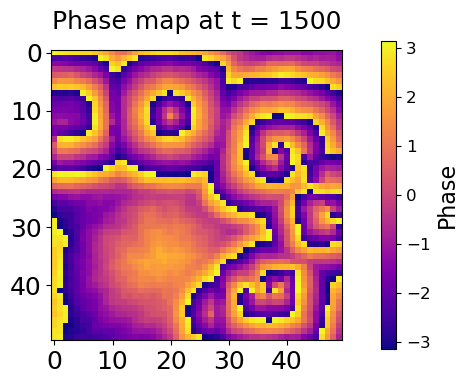

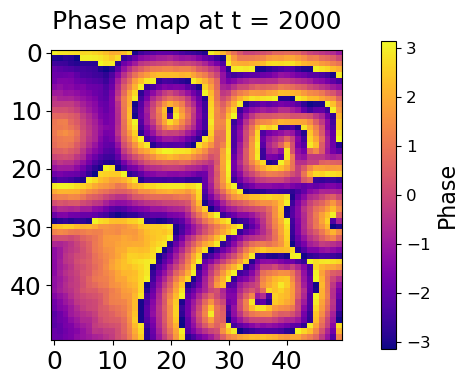

In [15]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-3*np.pi/8, np.pi, (N,N))  # widerp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# define the model

def ERIC_2d(phi,N, K, omega, L):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phasemap

def phase_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
# uncomment to save file
#    plt.savefig("Phase_map_at_t = " + str(T) + "widerp3_expf_incond1.jpg", dpi = 300)
    plt.show()
    
# Chosen limits of frequency distribution  
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150

# homogenous initial phase
 
# angle = np.pi/4

# Define the model parameters
N = 50
dt = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the X value at the final step using a colormap

#T_list = [100, 500, 1000] #The user can also visualize the transient dynamics if they desire


T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial)


## Widerp4: $\theta_{in} = [-\pi/2, \pi]$

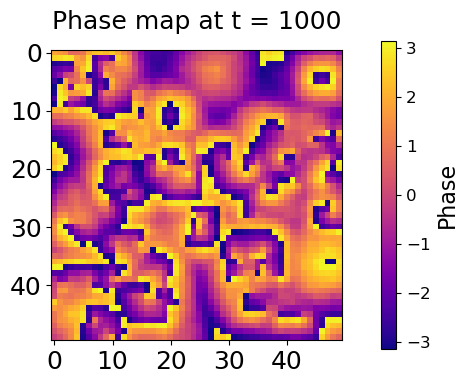

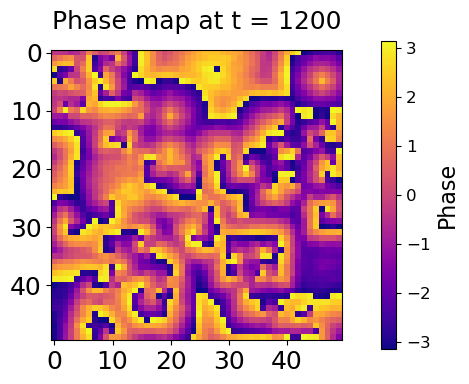

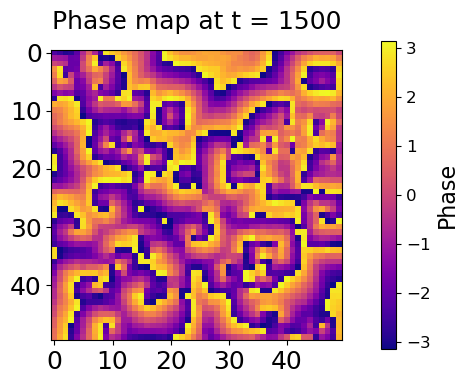

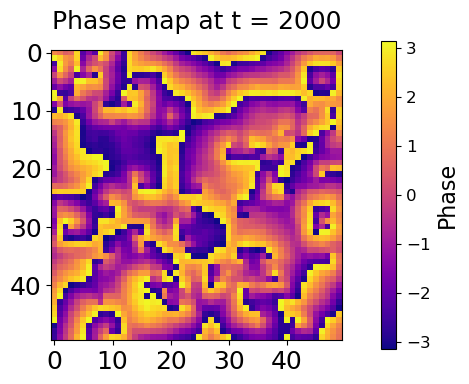

In [17]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi, (N,N))  # widerp4
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# define the model

def ERIC_2d(phi,N, K, omega, L):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phasemap

def phase_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
# uncomment to save file
#    plt.savefig("Phase_map_at_t = " + str(T) + "widerp4_expf_incond1.jpg", dpi = 300)
    plt.show()
    
# Chosen limits of frequency distribution  
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150

# homogenous initial phase
 
# angle = np.pi/4

# Define the model parameters
N = 50
dt = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the X value at the final step using a colormap

#T_list = [100, 500, 1000] #The user can also visualize the transient dynamics if they desire


T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial)


## Randomp: $\theta_{in}=[-\pi,\pi]$

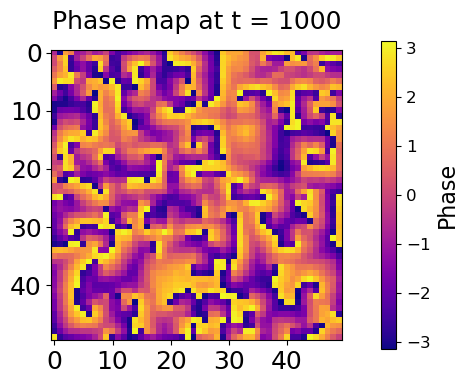

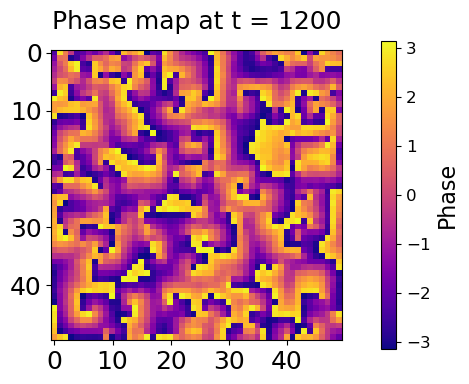

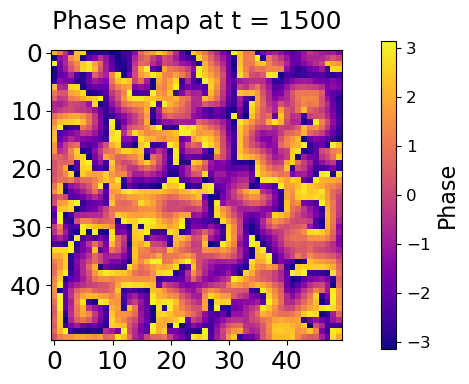

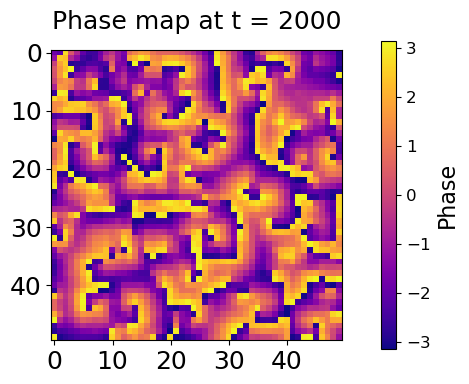

In [18]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi, (N,N))  # widerp4
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# define the model

def ERIC_2d(phi,N, K, omega, L):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phasemap

def phase_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
# uncomment to save file
#    plt.savefig("Phase_map_at_t = " + str(T) + "randomp_expf_incond1.jpg", dpi = 300)
    plt.show()
    
# Chosen limits of frequency distribution  
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150

# homogenous initial phase
 
# angle = np.pi/4

# Define the model parameters
N = 50
dt = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the X value at the final step using a colormap

#T_list = [100, 500, 1000] #The user can also visualize the transient dynamics if they desire


T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial)


## Testing for a different width of the frequency distribution

## We choose the natural frequencies from a uniform distribution between $[2\pi/150, 2\pi/120]$ min$^{-1}$. 

## Narrowp3: $\theta_{in} = [-\pi/2, \pi/2]$

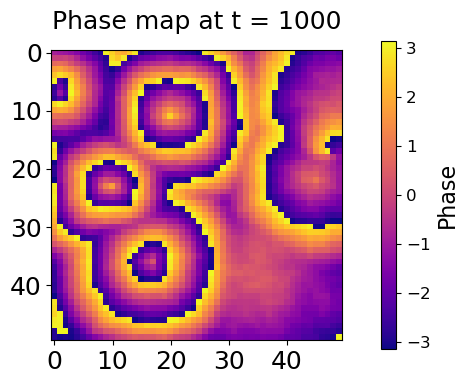

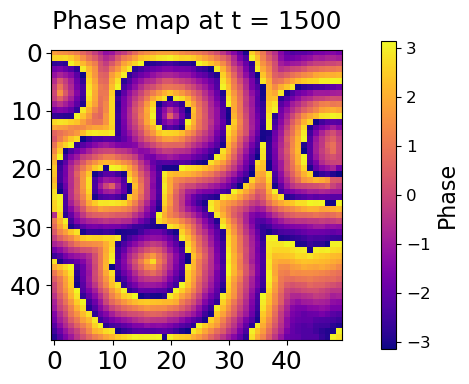

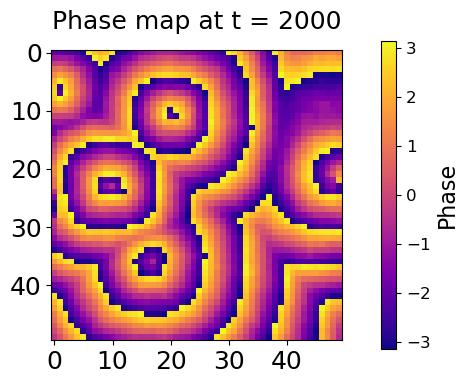

In [19]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # randomp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# define the model

def ERIC_2d(phi,N, K, omega, L):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phasemap

def phase_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
# uncomment to save file
#    plt.savefig("Phase_map_at_t = " + str(T) + "narrowp3_freq2_incond1.jpg", dpi = 300)
    plt.show()
    
# Chosen limits of frequency distribution  
    
w_min = 2 * np.pi / 150
w_max = 2 * np.pi / 120

# homogenous initial phase
 
# angle = np.pi/4

# Define the model parameters
N = 50
dt = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the X value at the final step using a colormap

#T_list = [100, 500, 1000] #The user can also visualize the transient dynamics if they desire


T_list = [1000, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial)


## Testing for a different randomization for the initial phase distribution: $\theta_{in}=[-\pi/2, \pi/2]$ and frequency distribution: $\omega_{in} = [2\pi/180, 2\pi/150]$ min$^{-1}$

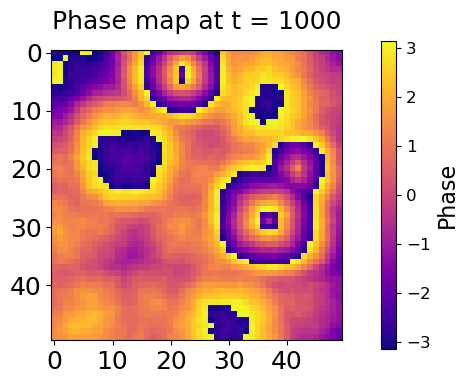

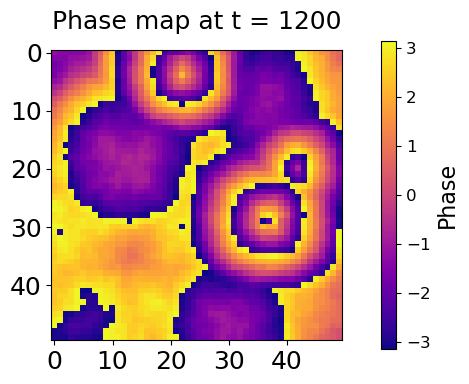

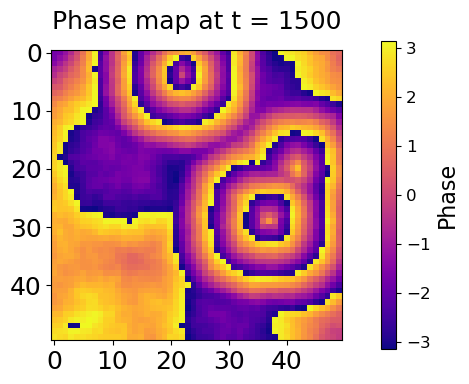

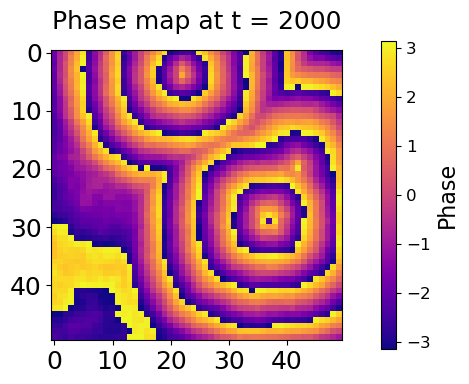

In [21]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# define the model

def ERIC_2d(phi,N, K, omega, L):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phasemap

def phase_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
# uncomment to save file
#    plt.savefig("Phase_map_at_t = " + str(T) + "narrowp3_expf_incond3.jpg", dpi = 300)
    plt.show()
    
# Chosen limits of frequency distribution  
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150

# homogenous initial phase
 
# angle = np.pi/4

# Define the model parameters
N = 50
dt = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8


# Legacy seed for reproducibility

np.random.seed(54321)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the X value at the final step using a colormap

#T_list = [100, 500, 1000] #The user can also visualize the transient dynamics if they desire


T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial)


## Local coherence maps:

These are the maps of the values of the instantaneous local order parameter defined by $$ \rho_{l:(i,j)}(t) = \frac{1}{4} \Big \vert  e^{i\theta_{i+1,j}(t)} + e^{i\theta_{i-1,j}(t)} + e^{i\theta_{i,j+1}(t)} + e^{i\theta_{i,j-1}(t)} \Big \vert $$

## Narrowp3: $\theta_{in}=[-\pi/2, \pi/2]$

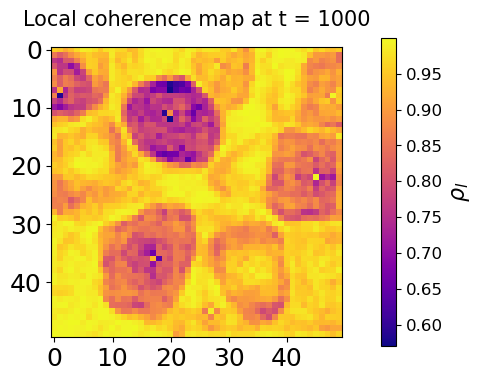

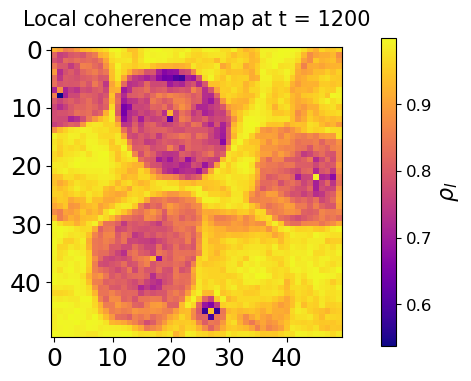

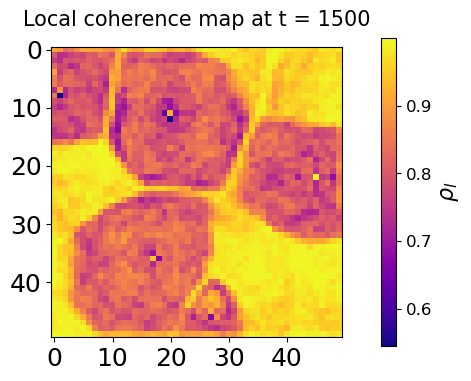

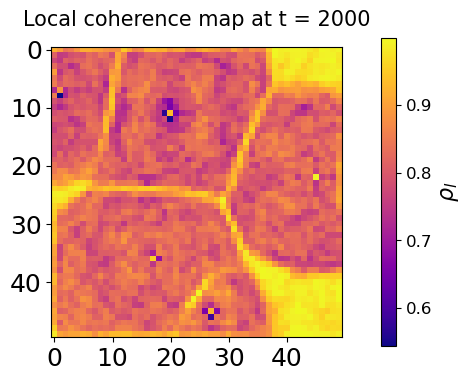

In [22]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to get the phases of nearest neighbors with open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model

def ERIC_2d(phi,N, K, omega, L):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt    
    return dphi_dt
        
# function to calculate the local coherence map

def local_coherence_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    
    num_steps = int(T/dt) + 1
    
    rho_local = np.zeros(( N, N))
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
    
         
    phi_sum = np.zeros((N, N))
    
    for t in range(num_steps): 
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
         
        
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    
    phi_sum =(1/4) *(np.exp(1j*phi_up) + np.exp(1j*phi_down) + np.exp(1j*phi_left) + np.exp(1j*phi_right) )
    
    rho_local = np.abs(phi_sum)

    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(rho_local, cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$\rho_{l}$', fontsize=16)
    plt.title('Local coherence map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Local_coherence_map_at_t = " + str(T) + "narrowp3_expf_incond1.jpg", dpi = 300)
    plt.show()

# Chosen limits of frequency distribution
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the rho_local value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    local_coherence_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial,) 

## Randomp: $\theta_{in}=[-\pi, \pi]$

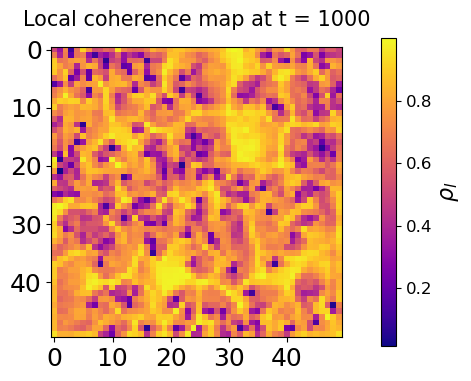

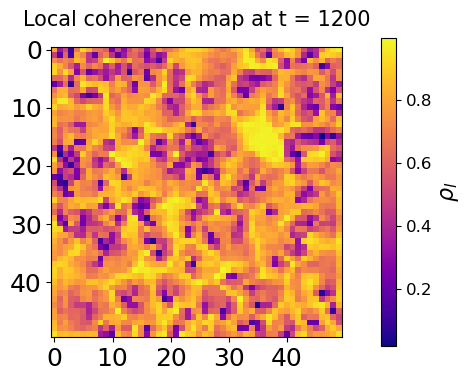

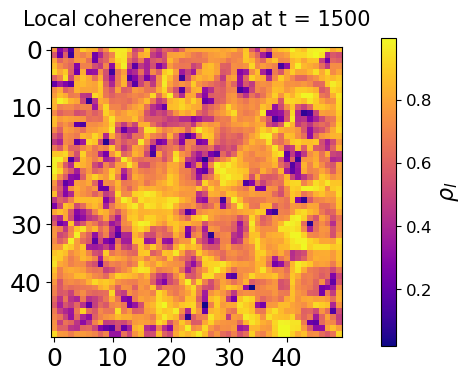

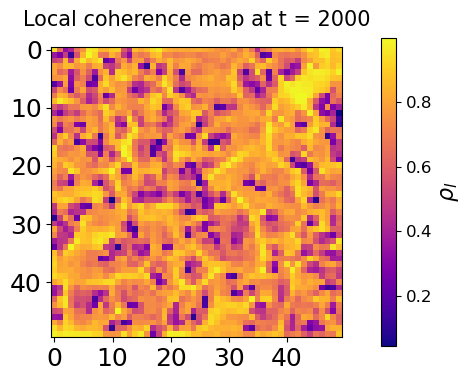

In [23]:
import numpy as np
import matplotlib.pyplot as plt


# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to get the phases of nearest neighbors with open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model

def ERIC_2d(phi,N, K, omega, L):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt    
    return dphi_dt
        
# function to calculate the local coherence map

def local_coherence_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    
    num_steps = int(T/dt) + 1
    
    rho_local = np.zeros(( N, N))
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
    
         
    phi_sum = np.zeros((N, N))
    
    for t in range(num_steps): 
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
         
        
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    
    phi_sum =(1/4) *(np.exp(1j*phi_up) + np.exp(1j*phi_down) + np.exp(1j*phi_left) + np.exp(1j*phi_right) )
    
    rho_local = np.abs(phi_sum)

    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(rho_local, cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$\rho_{l}$', fontsize=16)
    plt.title('Local coherence map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Local_coherence_map_at_t = " + str(T) + "randomp_expf_incond1.jpg", dpi = 300)
    plt.show()
    
# Chosen limits of frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the rho_local value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    local_coherence_ERIC_2d(N, T_list[i], dt,K, L, phi_initial, omega_initial,) 

# Global coherence

This is defined by the instantaneous global order parameter: $$ \rho_{g}(t) = \frac{1}{N^{2}} \Big \vert \sum_{i=1}^{N} \sum_{j=1}^{N} e^{i \theta_{i,j}(t)} \Big \vert $$

## Narrowp3: $\theta_{in} = [-\pi/2,\pi/2]$

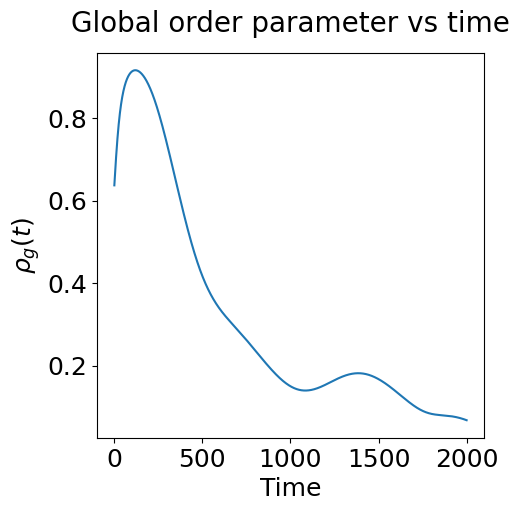

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to get the phases of the nearest neighbors while applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model

def ERIC_2d(phi, N, K, omega, L):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt    
    return dphi_dt

# function to compute the global coherence vs time

def global_coherence_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    
    num_steps = int(T/dt) + 1
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    rho =  np.zeros(num_steps)
    for t in range(num_steps): 
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
    
        r =  np.abs(np.mean( np.exp(1j* phi)  ))
        rho [t] = r
    # plot the order parameter modulus as a function of time
    t = np.linspace(0, T, num_steps)
    plt.figure(figsize=(5, 5))
    plt.plot(t, rho)
    plt.title('Global order parameter vs time', fontsize = 20, pad = 15)
    plt.xlabel('Time', fontsize = 18)
    plt.ylabel(r'$\rho_{g}(t)$', fontsize = 18)
    plt.xticks(fontsize = 18)
    plt.yticks(fontsize = 18)
    ax = plt.gca()
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=5)) 
#    plt.savefig("Global_order_parameter_vs_time_narrowp3_expf_incond1.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
T = 2000        # total computation time
dt = 0.01        # integration time step


K = 0.8 * (w_max - w_min)
L = 1.7

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the global coherence vs time 

global_coherence_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial)

## Randomp: $\theta_{in}= [-\pi, \pi]$

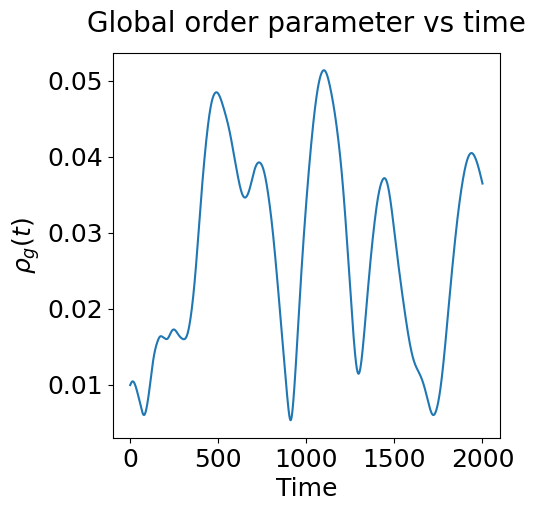

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# phase distribution of width less than 2 * np.pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to get the phases of the nearest neighbors while applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model

def ERIC_2d(phi, N, K, omega, L):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt    
    return dphi_dt

# function to compute the global coherence vs time

def global_coherence_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    
    num_steps = int(T/dt) + 1
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    rho =  np.zeros(num_steps)
    for t in range(num_steps): 
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
    
        r =  np.abs(np.mean( np.exp(1j* phi)  ))
        rho [t] = r
    # plot the order parameter modulus as a function of time
    t = np.linspace(0, T, num_steps)
    plt.figure(figsize=(5, 5))
    plt.plot(t, rho)
    plt.title('Global order parameter vs time', fontsize = 20, pad = 15)
    plt.xlabel('Time', fontsize = 18)
    plt.ylabel(r'$\rho_{g}(t)$', fontsize = 18)
    plt.xticks(fontsize = 18)
    plt.yticks(fontsize = 18)
    ax = plt.gca()
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=5)) 
#    plt.savefig("Global_order_parameter_vs_time_randomp_expf_incond1.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
T = 2000        # total computation time
dt = 0.01        # integration time step


K = 0.9 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the global coherence vs time 

global_coherence_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial)

## Phase field: Shows the phases as vectors

## Narrowp3: $\theta_{in}=[-\pi/2, \pi/2]$

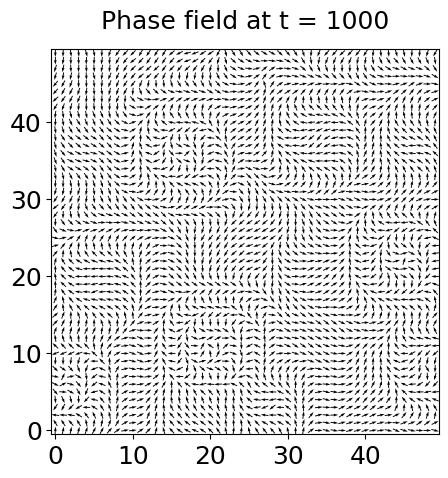

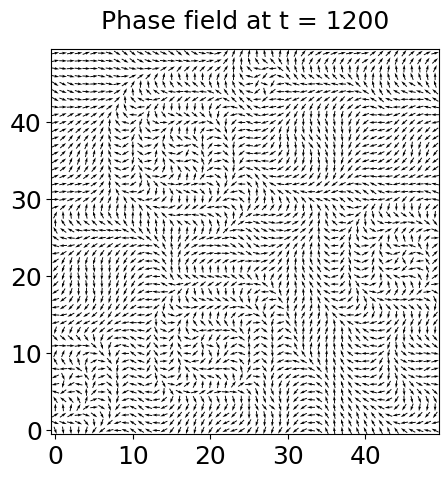

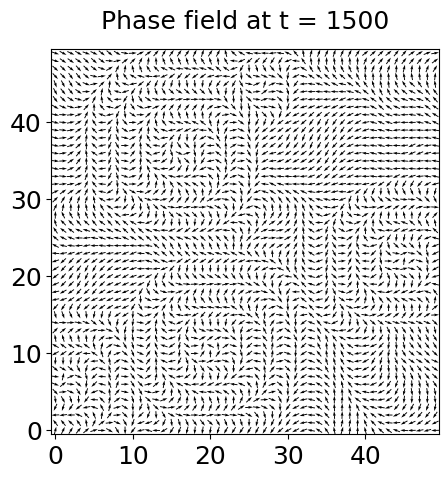

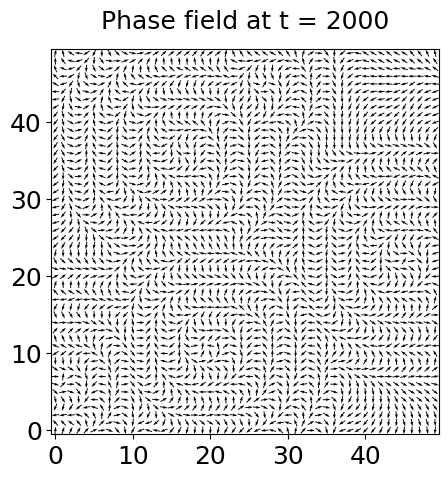

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.figure import figaspect

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to obtain the phases of the nearest neighbors while applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model

def ERIC_2d(phi, N, K, omega, L):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt    
    return dphi_dt

# function to plot the phase field

def phase_field_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial,):
    
    num_steps = int(T/dt) + 1
    # Initialize the natural frequencies
    omega = omega_initial.copy() 
    # Initialize the phases of the oscillators
    phi = phi_initial.copy()
    
    for t in range(num_steps): 
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))
    
    
    # Generate a grid of x and y coordinates
    x, y = np.meshgrid(np.arange(N), np.arange(N))    
    u = np.cos(phi)
    v = np.sin(phi)
    w, h = figaspect(1)
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.quiver(x, y, u, v, angles='xy', scale_units='xy', scale=1, pivot='mid')
    ax.set_xlim(-0.5, N-0.5)
    ax.set_ylim(-0.5, N-0.5)
    plt.title('Phase field at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_field_at_t = " + str(T) + "narrowp3_expf_incond1.jpg", dpi = 300)
    plt.show()

# Set the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle= np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

# Legacy seed for reproducibility 

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the phase field at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_field_ERIC_2d(N, T_list[i], dt, K, L, phi_initial, omega_initial)

## Randomp: $\theta_{in} = [-\pi, \pi]$

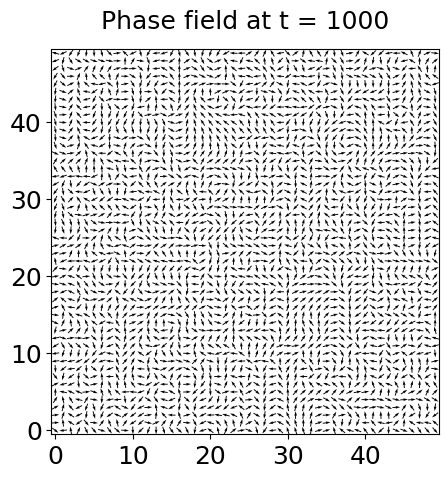

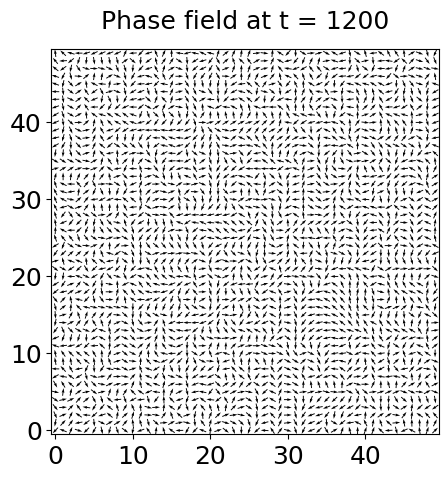

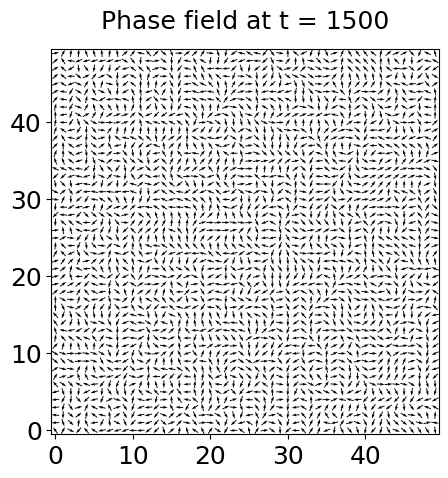

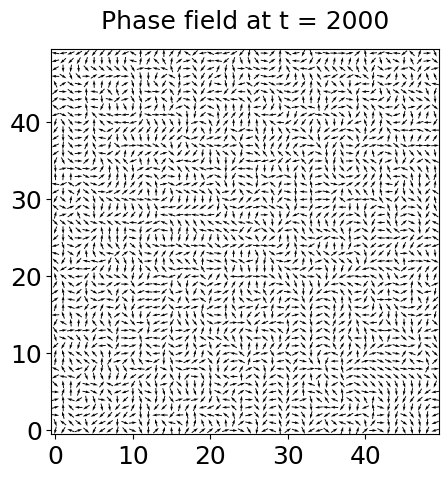

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.figure import figaspect

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to obtain the phases of the nearest neighbors while applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model

def ERIC_2d(phi, N, K, omega, L):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt    
    return dphi_dt

# function to plot the phase field

def phase_field_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial,):
    
    num_steps = int(T/dt) + 1
    # Initialize the natural frequencies
    omega = omega_initial.copy() 
    # Initialize the phases of the oscillators
    phi = phi_initial.copy()
    
    for t in range(num_steps): 
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))
    
    
    # Generate a grid of x and y coordinates
    x, y = np.meshgrid(np.arange(N), np.arange(N))    
    u = np.cos(phi)
    v = np.sin(phi)
    w, h = figaspect(1)
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.quiver(x, y, u, v, angles='xy', scale_units='xy', scale=1, pivot='mid')
    ax.set_xlim(-0.5, N-0.5)
    ax.set_ylim(-0.5, N-0.5)
    plt.title('Phase field at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_field_at_t = " + str(T) + "randomp_expf_incond1.jpg", dpi = 300)
    plt.show()

# Set the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle= np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility 

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the phase field at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_field_ERIC_2d(N, T_list[i], dt, K, L, phi_initial, omega_initial)

## Instantaneous frequency maps: Maps of $d\theta_{i,j}(t)/dt$

## Narrowp3: $\theta_{in}=[-\pi/2, \pi/2]$

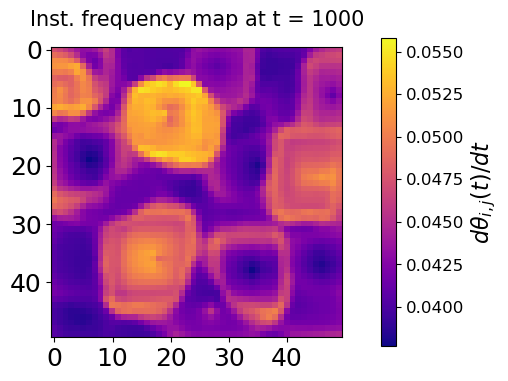

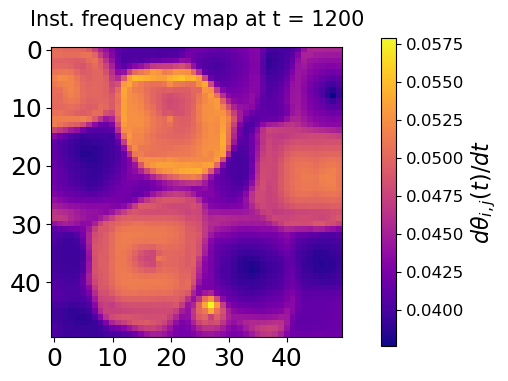

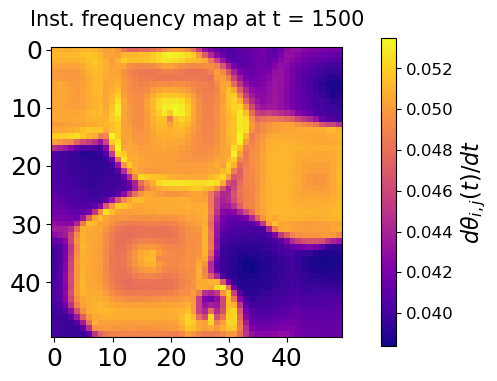

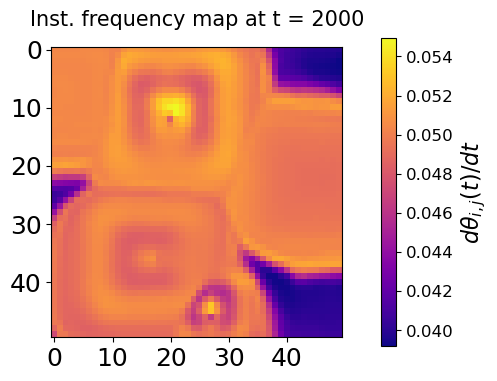

In [30]:
import numpy as np
import matplotlib.pyplot as plt

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# initial phase distribution of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to obtain the phases of the nearest neighbors applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model

def ERIC_2d(phi,N, K, omega, L):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt    
    return dphi_dt
   
# Function to compute and plot the instantaneous frequencies

def instantaneous_frequency_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    
    num_steps = int(T/dt) + 1 

    Y = np.zeros((num_steps, N, N)) # storing the instantaneous frequencies at different timesteps
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
         
    dphi_dt  = np.zeros((N, N))
    
    
    for t in range(num_steps): 
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        
        dphi_dt = ERIC_2d(phi, N, K, omega, L)
        
        Y[t,:,:] = dphi_dt
        
        
    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(Y[-1,:,:], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$d\theta_{i,j}(t)/ dt$', fontsize=16)
    plt.title('Inst. frequency map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Instantaneous_frequency_map_at_t = " + str(T) + "narrowp3_expf_incond1.jpg", dpi = 300)
    plt.show()
    
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the Y value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    instantaneous_frequency_map_ERIC_2d(N, T_list[i], dt, K, L, phi_initial, omega_initial) 

## Randomp: $\theta_{in}=[-\pi,\pi]$

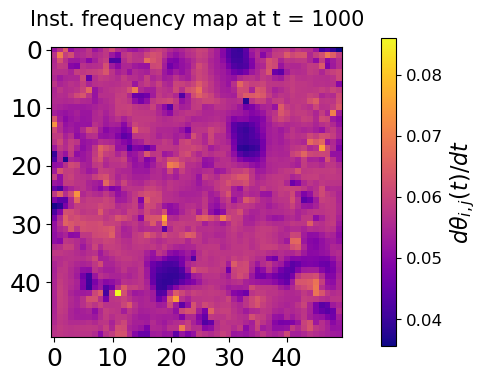

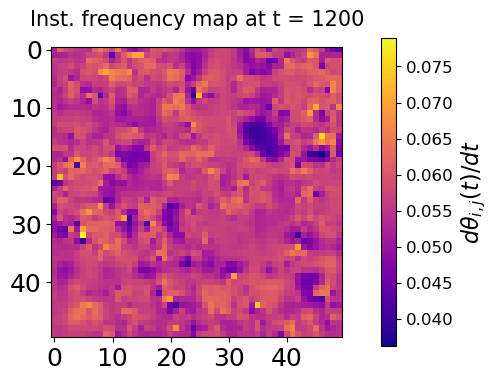

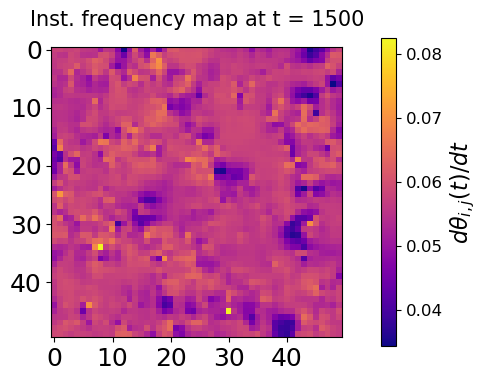

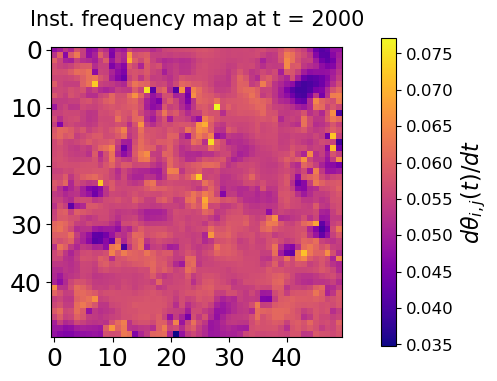

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# initial phase distribution of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to obtain the phases of the nearest neighbors applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model

def ERIC_2d(phi,N, K, omega, L):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt    
    return dphi_dt
   
# Function to compute and plot the instantaneous frequencies

def instantaneous_frequency_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    
    num_steps = int(T/dt) + 1 

    Y = np.zeros((num_steps, N, N)) # storing the instantaneous frequencies at different timesteps
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
         
    dphi_dt  = np.zeros((N, N))
    
    
    for t in range(num_steps): 
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        
        dphi_dt = ERIC_2d(phi, N, K, omega, L)
        
        Y[t,:,:] = dphi_dt
        
        
    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(Y[-1,:,:], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$d\theta_{i,j}(t)/ dt$', fontsize=16)
    plt.title('Inst. frequency map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Instantaneous_frequency_map_at_t = " + str(T) + "randomp_expf_incond1.jpg", dpi = 300)
    plt.show()
    
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)


# Plot the Y value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    instantaneous_frequency_map_ERIC_2d(N, T_list[i], dt, K, L, phi_initial, omega_initial) 

## Average period map: The average period is defined as: $\bar{T}_{i,j}=2\pi/\bar{\omega_{i,j}}$.

The average frequency is defined by the following relation: $$\bar{\omega_{i,j}} = \lim_{T \rightarrow \infty} \frac{ \theta_{i,j}(t_{0}+T) - \theta_{i,j}(t_{0}) }{T}$$

where $t_{0}$ is the transient time and $T$ is the averaging time. We will choose $t_{0}=1000$ min and $T=1000$ min. 

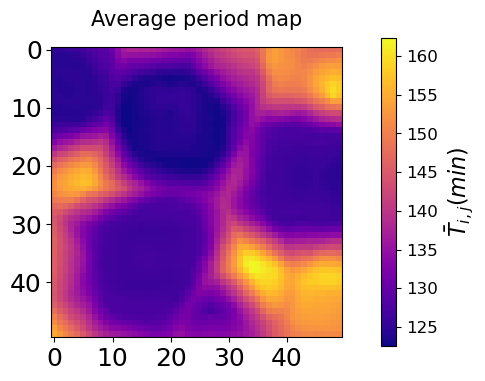

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility 

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to obtain the neighboring phases after applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model

def ERIC_2d(phi,N, K, omega, L):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt    
    return dphi_dt
   
# function to compute and plot the instantaneous frequencies as a heatmap

def average_period_map_ERIC_2d(N, T, t0, dt, K, L, omega_initial, phi_initial):
    
    num_steps = int((T+t0)/dt) + 1

    Y = np.zeros((num_steps, N, N))  # storing the phase values 
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
    
         
    dphi_dt  = np.zeros((N, N))
    
    
    for t in range(num_steps): 
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        
        
        Y[t,:,:] = phi
        
        
    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow( 2*np.pi / ( (Y[int((t0+T)/dt),:,:] - Y[int(t0/dt),:,:]) / T ), cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$\bar{T}_{i,j}(min) $', fontsize=16)
    plt.title('Average period map', fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Average_period_map_narrowp_2dERIC.jpg", dpi = 300, bbox_inches = 'tight')
    plt.show()
    
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


t0 = 1000
T = 1000

K = 0.8 * (w_max - w_min)
L = 1.7

# Choice of initial frequency and phase distributions

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the average period map using a colormap

average_period_map_ERIC_2d(N, T, t0, dt,K, L, omega_initial, phi_initial) 

## Ratio of instantaneous frequency at a site versus average of instantaneous frequencies of neighbors

# $r^{\omega,l}_{i,j}(t) = \frac{d \theta_{i,j}(t)}{dt} / \frac{\overline{d \theta_{i,j}(t)} }{dt} \vert_{nn}$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

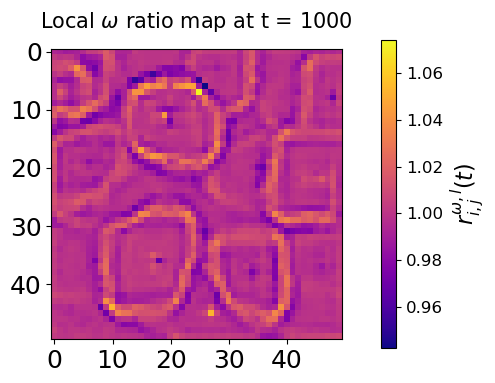

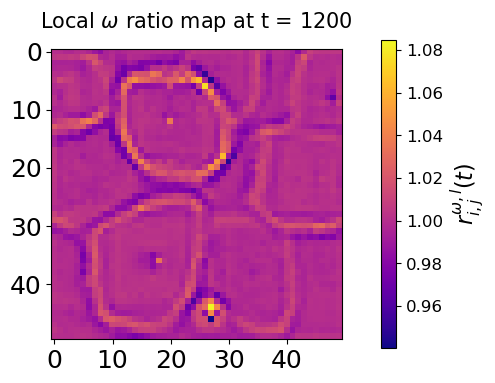

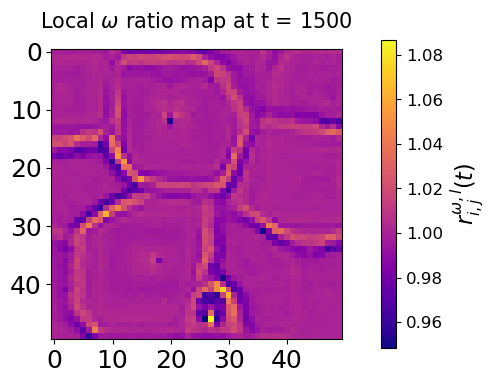

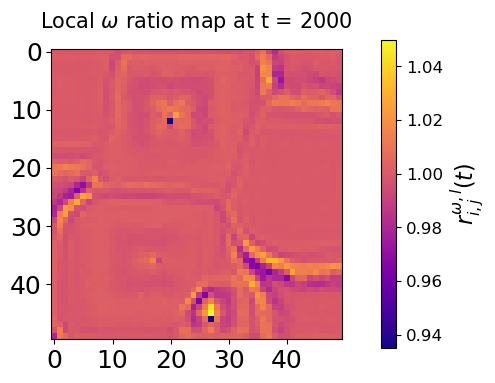

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp1
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to obtain the neighboring phases while applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model

def ERIC_2d(phi,N, K, omega, L):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt    
    return dphi_dt
   
# function to compute the local frequency ratio maps

def local_frequency_ratio_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    
    num_steps = int(T/dt) + 1
    
    Y = np.zeros((num_steps, N, N)) # ratio of dphi_dt and average of dphi_dt at some t
    
    omega = omega_initial.copy()     
    phi = phi_initial.copy()
    
         
    dphi_dt  = np.zeros((N, N))
    dphi_dt_local  = np.zeros((N, N))
    
    for t in range(num_steps): 
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        
        dphi_dt = ERIC_2d(phi, N, K, omega, L)
        
        dphi_dt_up = np.roll(dphi_dt, -1, axis=0)
        dphi_dt_up [-1, :]= dphi_dt[-1, :]
        dphi_dt_down = np.roll(dphi_dt, 1, axis=0)
        dphi_dt_down[0, :] = dphi_dt[0, :]
        dphi_dt_left = np.roll(dphi_dt, -1, axis=1)
        dphi_dt_left[:, -1] = dphi_dt[:, -1]
        dphi_dt_right = np.roll(dphi_dt, 1, axis=1)
        dphi_dt_right[:, 0] = dphi_dt[:, 0]
        
        
        dphi_dt_local = 1/4 * (dphi_dt_up + dphi_dt_down + dphi_dt_left + dphi_dt_right)
        
        Y[t,:,:] = dphi_dt / dphi_dt_local
        
        
    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(Y[-1,:,:], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$r^{\omega,l}_{i,j}(t)$', fontsize=16)
    plt.title(r'Local $\omega$ ratio map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Local_frequency_ratio_map_at_t = " + str(T) + "narrowp3_expf_incond1.jpg", dpi = 300)
    plt.show()
    
# Define limits of the uniform frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the Y value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    local_frequency_ratio_map_ERIC_2d(N, T_list[i], dt, K, L, phi_initial, omega_initial) 

## Randomp: $\theta_{in}=[-\pi,\pi]$

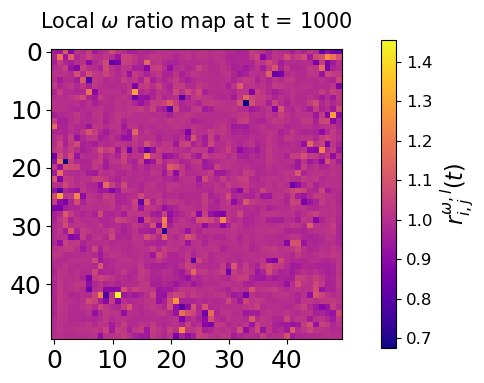

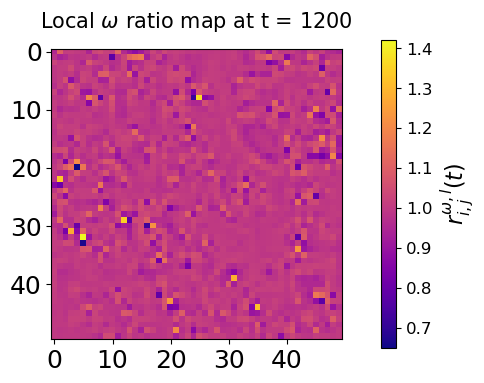

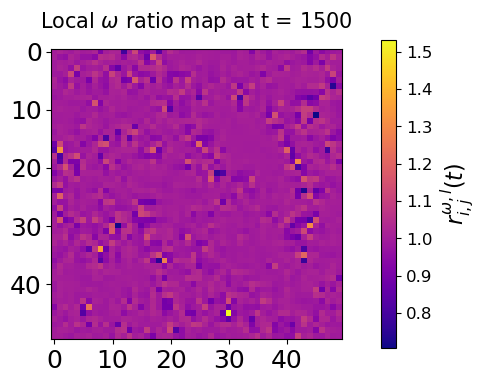

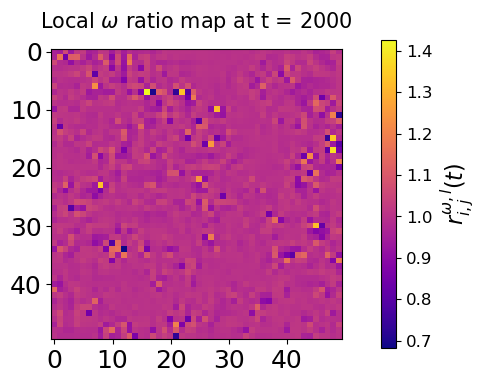

In [35]:
import numpy as np
import matplotlib.pyplot as plt

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp1
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to obtain the neighboring phases while applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model

def ERIC_2d(phi,N, K, omega, L):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt    
    return dphi_dt
   
# function to compute the local frequency ratio maps

def local_frequency_ratio_map_ERIC_2d(N, T, dt, K, L, phi_initial, omega_initial):
    
    num_steps = int(T/dt) + 1
    
    Y = np.zeros((num_steps, N, N)) # ratio of dphi_dt and average of dphi_dt at some t
    
    omega = omega_initial.copy()     
    phi = phi_initial.copy()
    
         
    dphi_dt  = np.zeros((N, N))
    dphi_dt_local  = np.zeros((N, N))
    
    for t in range(num_steps): 
        k1 = ERIC_2d(phi, N, K, omega, L)
        k2 = ERIC_2d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_2d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_2d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        
        dphi_dt = ERIC_2d(phi, N, K, omega, L)
        
        dphi_dt_up = np.roll(dphi_dt, -1, axis=0)
        dphi_dt_up [-1, :]= dphi_dt[-1, :]
        dphi_dt_down = np.roll(dphi_dt, 1, axis=0)
        dphi_dt_down[0, :] = dphi_dt[0, :]
        dphi_dt_left = np.roll(dphi_dt, -1, axis=1)
        dphi_dt_left[:, -1] = dphi_dt[:, -1]
        dphi_dt_right = np.roll(dphi_dt, 1, axis=1)
        dphi_dt_right[:, 0] = dphi_dt[:, 0]
        
        
        dphi_dt_local = 1/4 * (dphi_dt_up + dphi_dt_down + dphi_dt_left + dphi_dt_right)
        
        Y[t,:,:] = dphi_dt / dphi_dt_local
        
        
    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(Y[-1,:,:], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$r^{\omega,l}_{i,j}(t)$', fontsize=16)
    plt.title(r'Local $\omega$ ratio map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Local_frequency_ratio_map_at_t = " + str(T) + "randomp_expf_incond1.jpg", dpi = 300)
    plt.show()
    
# Define limits of the uniform frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

# Legacy seed for reproducibility

np.random.seed(12345)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)


# Plot the Y value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    local_frequency_ratio_map_ERIC_2d(N, T_list[i], dt, K, L, phi_initial, omega_initial) 

## 1D ERIC model 

The phase equations are given by: 

$$ \frac{\mathrm{d}\theta_{i}(t)}{\mathrm{d}t} \Big \lvert_{1DE} = \omega_{i}  + K\, \Big [ \sin(\theta_{i+1}(t) -\theta_{i}(t))
   + \Lambda \, \sin^{2} (\theta_{i+1}(t) -\theta_{i}(t))  +  \sin(\theta_{i-1} (t) -\theta_{i} (t)) 
   + \Lambda \, \sin^{2} (\theta_{i-1}(t) -\theta_{i}(t)) \Big] $$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

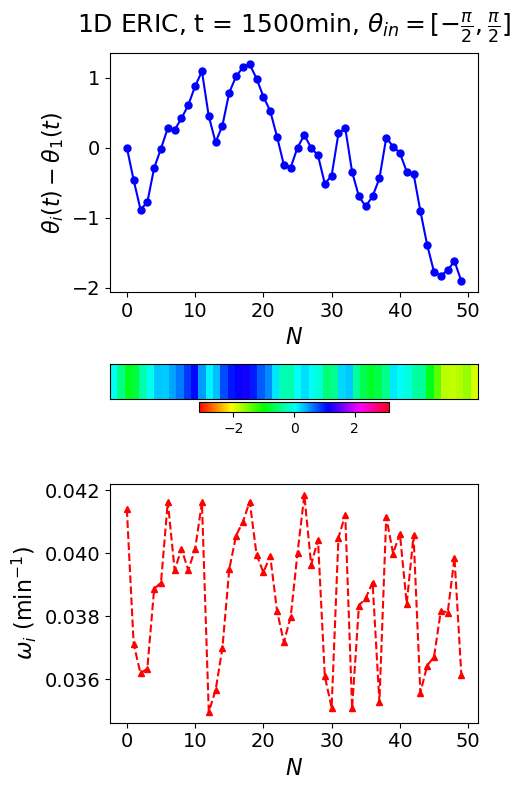

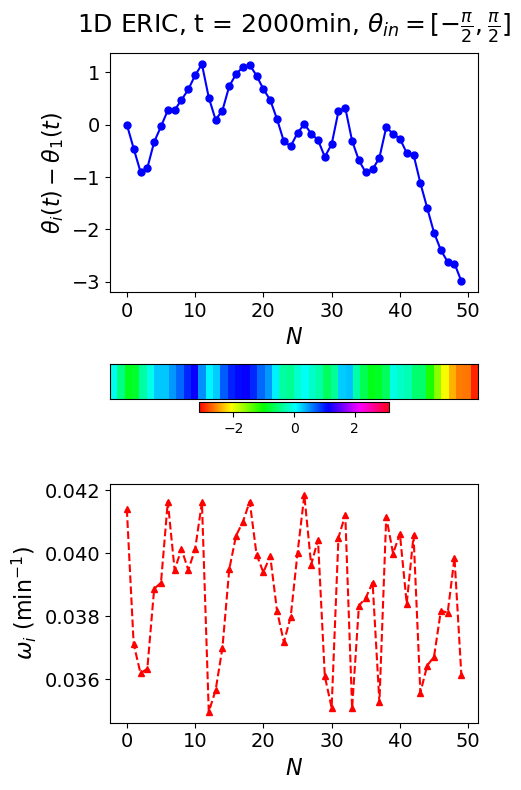

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import truncnorm
import matplotlib.gridspec as gridspec

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=N)
    return omega

# Truncated normal distribution

def omega_trunc_normal(w_min, w_max, mean, scale, N):    

    # Define the parameters of the truncated normal distribution
    a = (w_min - mean) / scale  # Lower bound
    b = (w_max - mean) / scale  # Upper bound


    # Generate random samples from the truncated original distribution
    omega = truncnorm.rvs(a, b , loc = mean , scale = scale , size = N)
    
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones(N)*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, N)  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, N) # randomp
    return phase

# 1D ERIC model

def ERIC_1d(phi, N, K, omega, L):        
    phi_left = np.roll(phi, -1)
    phi_left[-1] = phi[-1]
    phi_right = np.roll(phi, 1)
    phi_right[0] = phi[0] 

    dphi_dt = np.zeros(N) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase lag

def phase_lag_ERIC_1d(N, T, dt, K, L, omega_initial, phi_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N))  # Storing the phases
    
    X_diff = np.zeros((num_steps, N))
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_1d(phi,N, K, omega, L)
        k2 = ERIC_1d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_1d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_1d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)

        X[t, :] = phi
        
        X_diff[t,:] = X[t,:] - X[t,0]    # Phase lag 
        
        X_diff[t,:] = np.angle(np.exp(1j * X_diff[t,:]))
    X_diff_last = X_diff[-1, :]          # Phase lag at the last timestep
    X_diff_2D = X_diff_last.reshape(1, N)
    
    cmap = plt.get_cmap('hsv') 
    norm = plt.Normalize(vmin=-np.pi, vmax=np.pi)  # Normalizing from -pi to pi
    
    # Define the grid
    fig = plt.figure(figsize=(5, 8))
    gs = gridspec.GridSpec(3, 1, height_ratios=[1, 0.2, 1])  # Adjust the middle plot height ratio as needed

    # Plot X_diff[-1, :] vs N
    ax1 = fig.add_subplot(gs[0])
    ax1.plot(range(N), X_diff[-1, :], marker='o', linestyle='-', markersize=5, color='b')
    ax1.set_xlabel(r'$N$', fontsize=16)
    ax1.set_ylabel(r'$\theta_{i}(t)-\theta_{1}(t)$', fontsize=16)
    ax1.set_title('1D ERIC, t = ' + str(T) + r'min, $ \theta_{in}=[-\frac{\pi}{2},\frac{\pi}{2}]$', fontsize=18, pad = 15)
    ax1.tick_params(axis='both', labelsize=14)

    # Plot the phase map
    ax2 = fig.add_subplot(gs[1])
    img = ax2.imshow(X_diff_2D, aspect='auto', cmap=cmap, norm=norm)
    ax2.set_yticks([])
    ax2.set_xticks([])

    # Add a colorbar
    cbar = fig.colorbar(img, ax=ax2, orientation='horizontal', fraction=0.2, pad=0.08)
#    cbar.set_label('Phase Difference (rad)', fontsize=16)

    # Plot omega vs N
    ax3 = fig.add_subplot(gs[2])
    ax3.plot(range(N), omega, marker='^', linestyle='--', markersize=5, color='r')
    ax3.set_xlabel(r'$N$', fontsize=16)
    ax3.set_ylabel(r'$\omega_{i}$ (min$^{-1})$', fontsize=16)
    ax3.tick_params(axis='both', labelsize=14)

    # Adjust layout
    plt.tight_layout()
#    plt.savefig("Phase_lag_at_t = " + str(T) + "_1DERIC_narrowp_uniformf_noexc.jpg", dpi=300, bbox_inches = 'tight')
    plt.show()

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

# for use with truncated normal distributions
#mean = 2*np.pi/165
#scale = 2*np.pi*(1/160 - 1/165)

#omega_initial = omega_trunc_normal(w_min, w_max, mean, scale, N)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the phase lag

T_list = [1500, 2000]
for i in range(len(T_list)):
    phase_lag_ERIC_1d(N, T_list[i], dt, K, L, omega_initial, phi_initial)  

## Randomp: $\theta_{in}=[-\pi,\pi]$

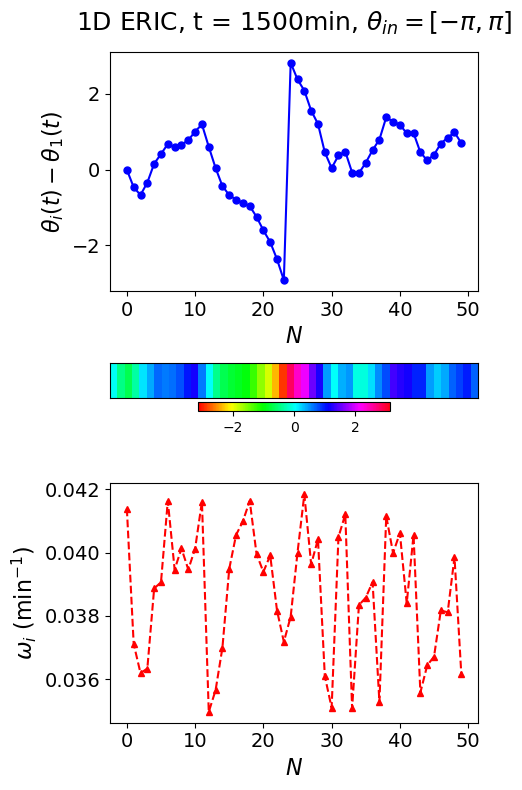

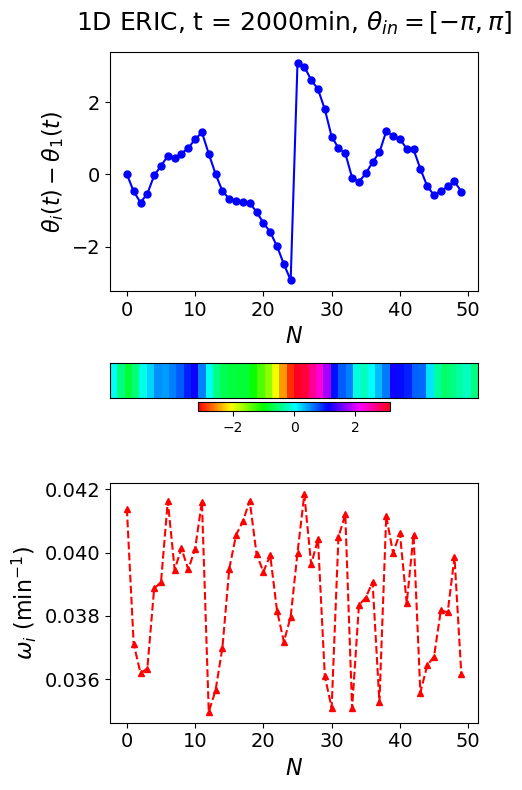

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import truncnorm
import matplotlib.gridspec as gridspec

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=N)
    return omega

# Truncated normal distribution

def omega_trunc_normal(w_min, w_max, mean, scale, N):    

    # Define the parameters of the truncated normal distribution
    a = (w_min - mean) / scale  # Lower bound
    b = (w_max - mean) / scale  # Upper bound


    # Generate random samples from the truncated original distribution
    omega = truncnorm.rvs(a, b , loc = mean , scale = scale , size = N)
    
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones(N)*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, N)  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, N) # randomp
    return phase

# 1D ERIC model

def ERIC_1d(phi, N, K, omega, L):        
    phi_left = np.roll(phi, -1)
    phi_left[-1] = phi[-1]
    phi_right = np.roll(phi, 1)
    phi_right[0] = phi[0] 

    dphi_dt = np.zeros(N) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase lag

def phase_lag_ERIC_1d(N, T, dt, K, L, omega_initial, phi_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N))  # Storing the phases
    
    X_diff = np.zeros((num_steps, N))
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_1d(phi,N, K, omega, L)
        k2 = ERIC_1d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_1d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_1d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)

        X[t, :] = phi
        
        X_diff[t,:] = X[t,:] - X[t,0]    # Phase lag 
        
        X_diff[t,:] = np.angle(np.exp(1j * X_diff[t,:]))
    X_diff_last = X_diff[-1, :]          # Phase lag at the last timestep
    X_diff_2D = X_diff_last.reshape(1, N)
    
    cmap = plt.get_cmap('hsv') 
    norm = plt.Normalize(vmin=-np.pi, vmax=np.pi)  # Normalizing from -pi to pi
    
    # Define the grid
    fig = plt.figure(figsize=(5, 8))
    gs = gridspec.GridSpec(3, 1, height_ratios=[1, 0.2, 1])  # Adjust the middle plot height ratio as needed

    # Plot X_diff[-1, :] vs N
    ax1 = fig.add_subplot(gs[0])
    ax1.plot(range(N), X_diff[-1, :], marker='o', linestyle='-', markersize=5, color='b')
    ax1.set_xlabel(r'$N$', fontsize=16)
    ax1.set_ylabel(r'$\theta_{i}(t)-\theta_{1}(t)$', fontsize=16)
    ax1.set_title('1D ERIC, t = ' + str(T) + r'min, $ \theta_{in}=[-\pi,\pi]$', fontsize=18, pad = 15)
    ax1.tick_params(axis='both', labelsize=14)

    # Plot the phase map
    ax2 = fig.add_subplot(gs[1])
    img = ax2.imshow(X_diff_2D, aspect='auto', cmap=cmap, norm=norm)
    ax2.set_yticks([])
    ax2.set_xticks([])

    # Add a colorbar
    cbar = fig.colorbar(img, ax=ax2, orientation='horizontal', fraction=0.2, pad=0.08)
#    cbar.set_label('Phase Difference (rad)', fontsize=16)

    # Plot omega vs N
    ax3 = fig.add_subplot(gs[2])
    ax3.plot(range(N), omega, marker='^', linestyle='--', markersize=5, color='r')
    ax3.set_xlabel(r'$N$', fontsize=16)
    ax3.set_ylabel(r'$\omega_{i}$ (min$^{-1})$', fontsize=16)
    ax3.tick_params(axis='both', labelsize=14)

    # Adjust layout
    plt.tight_layout()
#    plt.savefig("Phase_lag_at_t = " + str(T) + "_1DERIC_randomp_uniformf_noexc.jpg", dpi=300, bbox_inches = 'tight')
    plt.show()

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

# for use with truncated normal distributions
#mean = 2*np.pi/165
#scale = 2*np.pi*(1/160 - 1/165)

#omega_initial = omega_trunc_normal(w_min, w_max, mean, scale, N)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)


# Plot the phase lag

T_list = [1500, 2000]
for i in range(len(T_list)):
    phase_lag_ERIC_1d(N, T_list[i], dt, K, L, omega_initial, phi_initial)  

## Using a triangular frequency distribution

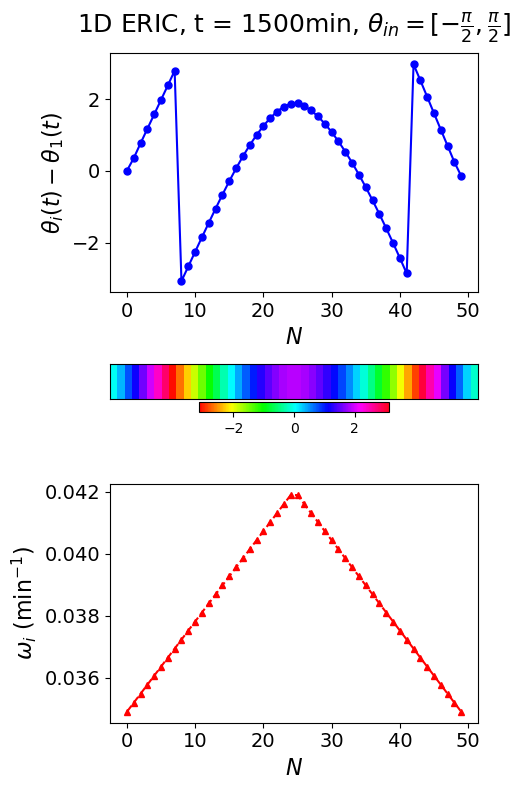

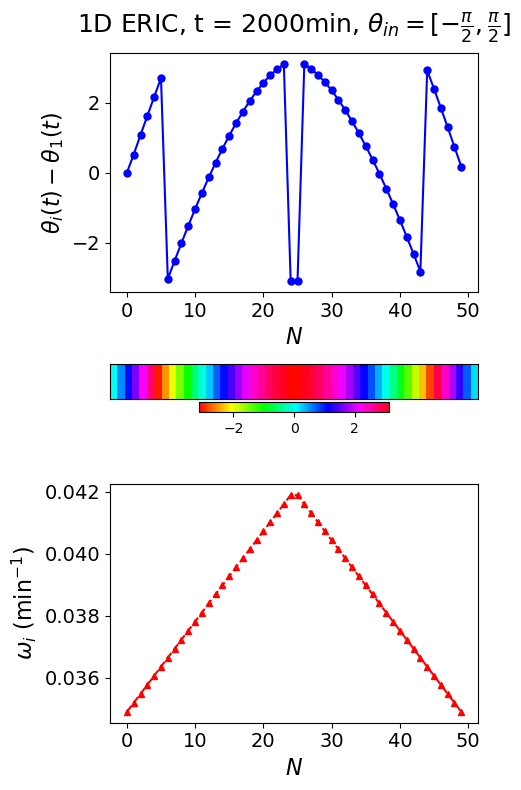

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import truncnorm
import matplotlib.gridspec as gridspec

# Legacy seed for reproducibility

np.random.seed(12345)

# a triangular frequency distribution 

def omega_linear(w_min, w_max, N):
    first_half = np.linspace(w_min, w_max, num = int(N/2))
    second_half = np.linspace(w_max, w_min, num = int(N/2))
    omega = np.concatenate((first_half, second_half))
    return omega

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=N)
    return omega

# Truncated normal distribution

def omega_trunc_normal(w_min, w_max, mean, scale, N):    

    # Define the parameters of the truncated normal distribution
    a = (w_min - mean) / scale  # Lower bound
    b = (w_max - mean) / scale  # Upper bound


    # Generate random samples from the truncated original distribution
    omega = truncnorm.rvs(a, b , loc = mean , scale = scale , size = N)
    
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones(N)*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, N)  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, N) # randomp
    return phase

# 1D ERIC model 

def ERIC_1d(phi, N, K, omega, L):        
    phi_left = np.roll(phi, -1)
    phi_left[-1] = phi[-1]
    phi_right = np.roll(phi, 1)
    phi_right[0] = phi[0] 

    dphi_dt = np.zeros(N) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_lag_ERIC_1d(N, T, dt, K, L, omega_initial, phi_initial):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N))  # Storing the phases
    
    X_diff = np.zeros((num_steps, N))
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_1d(phi,N, K, omega, L)
        k2 = ERIC_1d(phi + 0.5 * dt * k1, N, K, omega, L)
        k3 = ERIC_1d(phi + 0.5 * dt * k2, N, K, omega, L)
        k4 = ERIC_1d(phi + dt * k3, N, K, omega, L)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)

        X[t, :] = phi
        
        X_diff[t,:] = X[t,:] - X[t,0]    # phase lag
        
        X_diff[t,:] = np.angle(np.exp(1j * X_diff[t,:]))
        
    X_diff_last = X_diff[-1, :]
    X_diff_2D = X_diff_last.reshape(1, N)
    
    cmap = plt.get_cmap('hsv') 
    norm = plt.Normalize(vmin=-np.pi, vmax=np.pi)  # Normalizing from -pi to pi

    
    # Define the grid
    fig = plt.figure(figsize=(5, 8))
    gs = gridspec.GridSpec(3, 1, height_ratios=[1, 0.2, 1])  # Adjust the middle plot height ratio as needed

    # Plot X_diff[-1, :] vs N
    ax1 = fig.add_subplot(gs[0])
    ax1.plot(range(N), X_diff[-1, :], marker='o', linestyle='-', markersize=5, color='b')
    ax1.set_xlabel(r'$N$', fontsize=16)
    ax1.set_ylabel(r'$\theta_{i}(t)-\theta_{1}(t)$', fontsize=16)
    ax1.set_title('1D ERIC, t = ' + str(T) + r'min, $ \theta_{in}=[-\frac{\pi}{2},\frac{\pi}{2}]$', fontsize=18, pad = 15)
    ax1.tick_params(axis='both', labelsize=14)

    # Plot the phase map
    ax2 = fig.add_subplot(gs[1])
    img = ax2.imshow(X_diff_2D, aspect='auto', cmap=cmap, norm=norm)
    ax2.set_yticks([])
    ax2.set_xticks([])

    # Add a colorbar
    cbar = fig.colorbar(img, ax=ax2, orientation='horizontal', fraction=0.2, pad=0.08)
#    cbar.set_label('Phase Difference (rad)', fontsize=16)

    # Plot omega vs N
    ax3 = fig.add_subplot(gs[2])
    ax3.plot(range(N), omega, marker='^', linestyle='--', markersize=5, color='r')
    ax3.set_xlabel(r'$N$', fontsize=16)
    ax3.set_ylabel(r'$\omega_{i}$ (min$^{-1}$)', fontsize=16)
    ax3.tick_params(axis='both', labelsize=14)

    # Adjust layout
    plt.tight_layout()
#    plt.savefig("Phase_lag_at_t = " + str(T) + "_1DERIC_narrowp_trianglef_noexc.jpg", dpi=300, bbox_inches = 'tight')
    plt.show()

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7 

# for use with truncated normal distributions
#mean = 2*np.pi/165
#scale = 2*np.pi*(1/160 - 1/165)

#omega_initial = omega_trunc_normal(w_min, w_max, mean, scale, N)

#omega_initial = omega_dist(w_min, w_max, N)

omega_initial = omega_linear(w_min,w_max, N)
phi_initial = phase_narrow(N)


# Plot the phase lag

T_list = [1500, 2000]
for i in range(len(T_list)):
    phase_lag_ERIC_1d(N, T_list[i], dt, K, L, omega_initial, phi_initial)  

#       ------------ 2D ERIC MODEL WITH EXCITABILITY -----------

## The locally coupled 2D ERIC model with excitability:

The phase equation is given by:
$$ \frac{\mathrm{d}\theta_{i,j}}{\mathrm{d}t}  = \omega_{i,j} - b\, \sin \theta_{i,j} + K \Big( \sin(\theta_{i-1,j} -\theta_{i,j} ) + \sin(\theta_{i+1,j} -\theta_{i,j} ) + \sin(\theta_{i,j-1} -\theta_{i,j} ) + \sin(\theta_{i,j+1} -\theta_{i,j} )  + \Lambda \big ( \sin^2(\theta_{i-1,j} -\theta_{i,j} ) + \sin^2(\theta_{i+1,j} -\theta_{i,j} ) + \sin^2(\theta_{i,j-1} -\theta_{i,j} ) + \sin^2(\theta_{i,j+1} -\theta_{i,j} ) \big) \Big)  $$



## Random seed 1

## Starting with experimental conditions of high cell densities where all cells are oscillatory to begin with

# $b=0.01$ min$^{-1}$

## We will repeat the analysis for phasemaps done for the 2D ERIC model by varying initial phase distribution widths. We use the same frequency distribution as before.

## Narrowp1: $\theta_{in}=[0,\pi/2]$

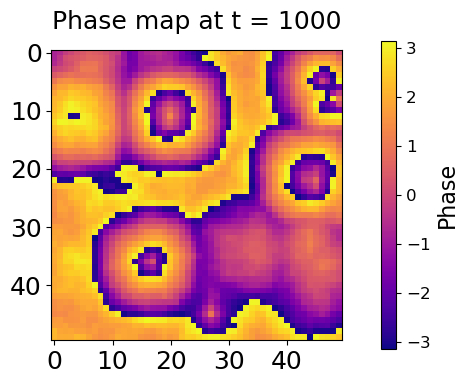

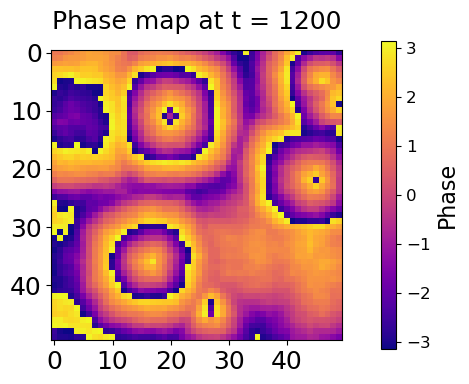

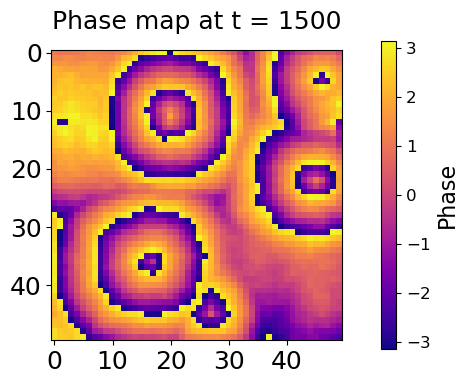

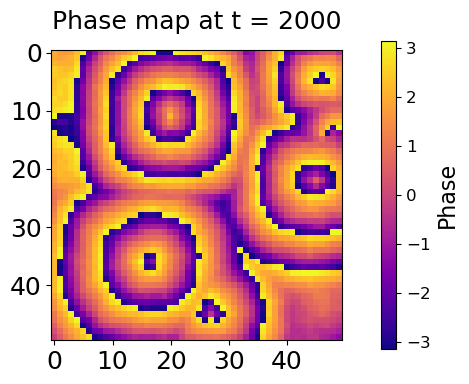

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(0, np.pi/2, (N,N))  # narrowp1
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_map_at_t = " + str(T) + "narrowp1_expf_incond1_excitableERIC.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 0.01


K = 0.8 * (w_max - w_min)
L = 1.8

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the X value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Narrowp2: $\theta_{in}=[0,\pi]$

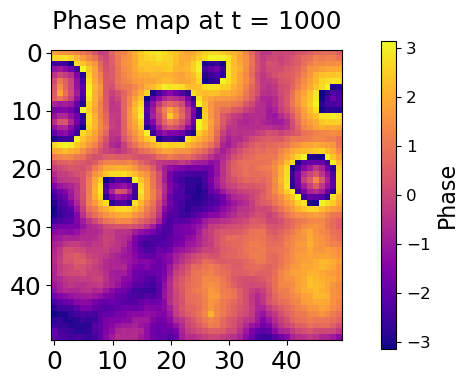

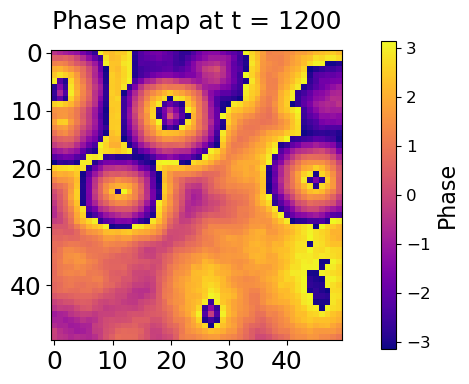

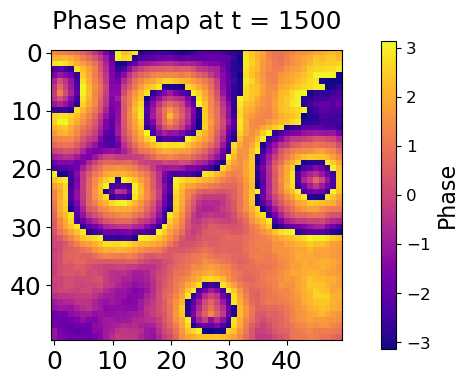

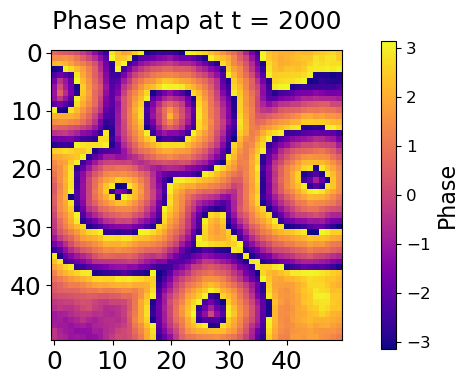

In [37]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(0, np.pi, (N,N))  # narrowp2
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_map_at_t = " + str(T) + "narrowp2_expf_incond1_excitableERIC.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the X value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Narrowp3: $\theta_{in}=[-\pi/2, \pi/2]$

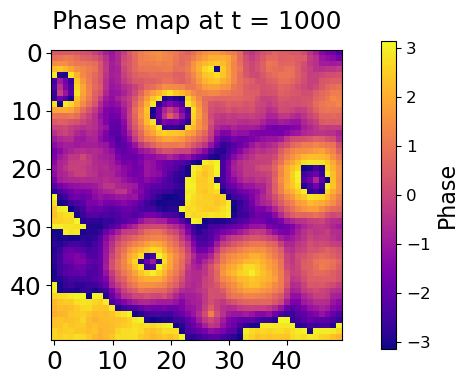

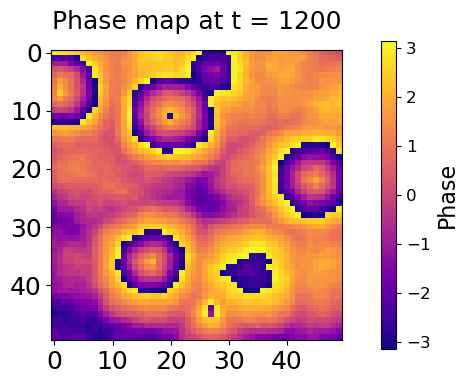

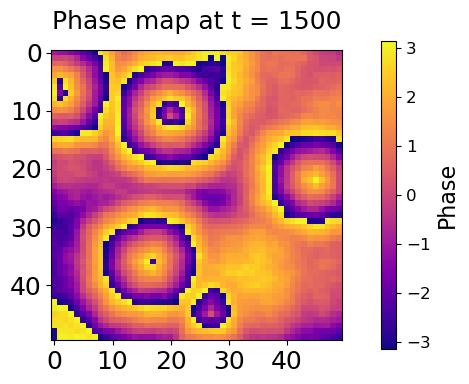

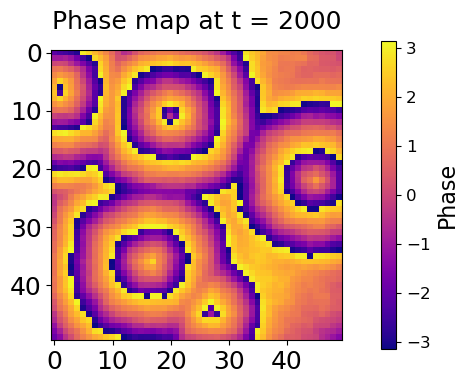

In [49]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_map_at_t = " + str(T) + "narrowp3_expf_incond1_excitableERIC.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the X value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Narrowp4: $\theta_{in} = [-\pi/4, \pi/4]$

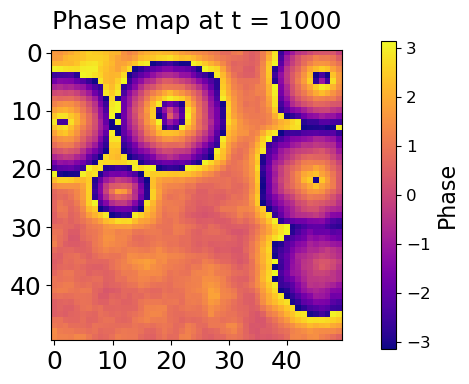

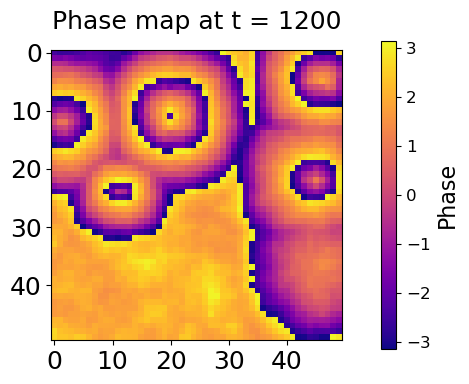

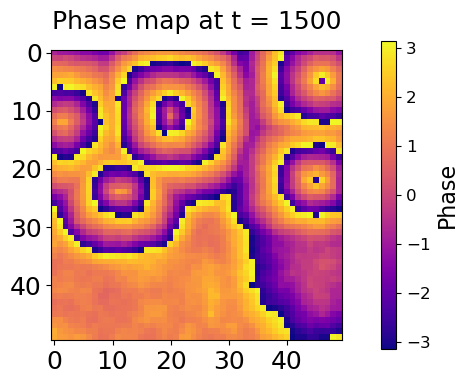

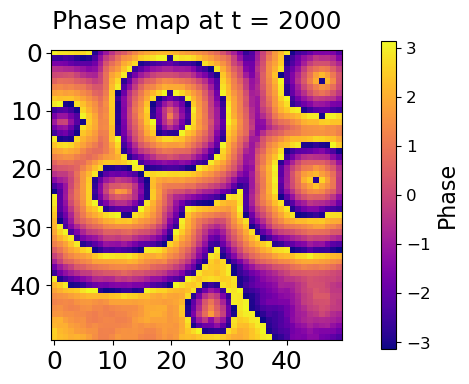

In [39]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/4, np.pi/4, (N,N))  # narrowp4
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_map_at_t = " + str(T) + "narrowp4_expf_incond1_excitableERIC.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 0.01


K = 0.8 * (w_max - w_min)
L = 1.8

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the X value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Widerp1: $\theta_{in}= [-\pi/8,\pi]$

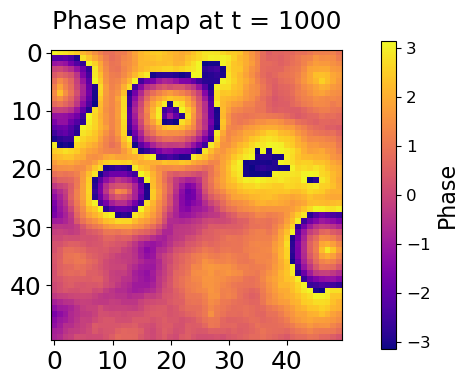

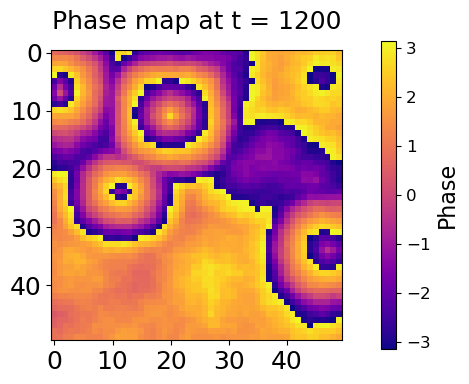

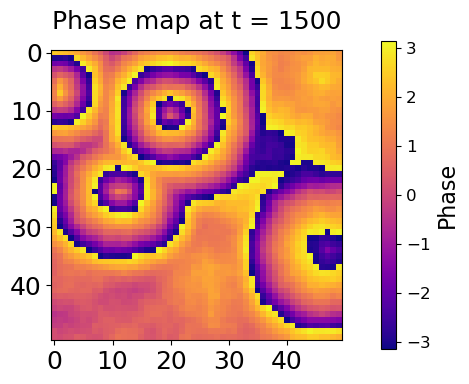

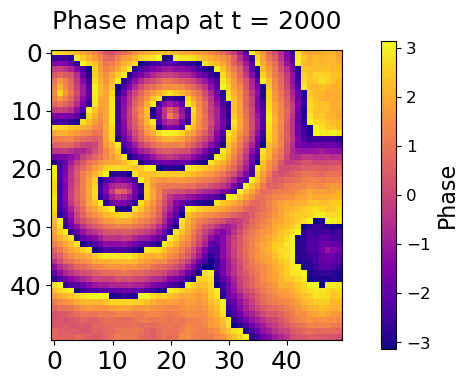

In [40]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/8, np.pi, (N,N))  # widerp1
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_map_at_t = " + str(T) + "widerp1_expf_incond1_excitableERIC.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the X value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Widerp2: $\theta_{in}=[-\pi/4, \pi]$

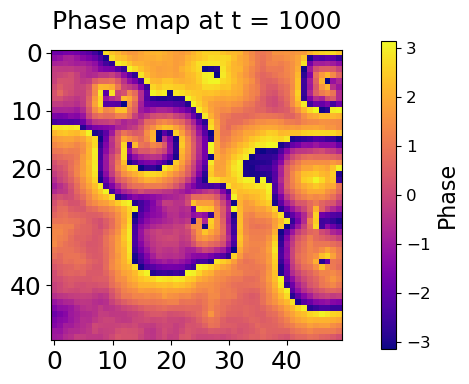

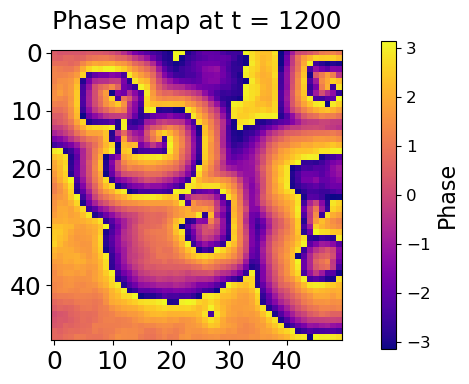

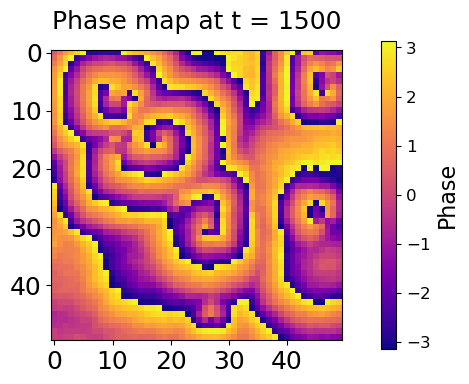

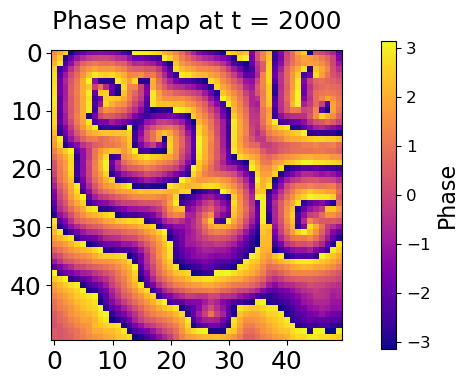

In [41]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/4, np.pi, (N,N))  # widerp2
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_map_at_t = " + str(T) + "widerp2_expf_incond1_excitableERIC.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the X value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Widerp4: $\theta_{in}=[-\pi/2,\pi]$

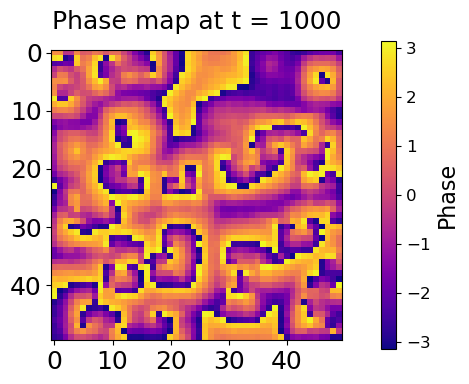

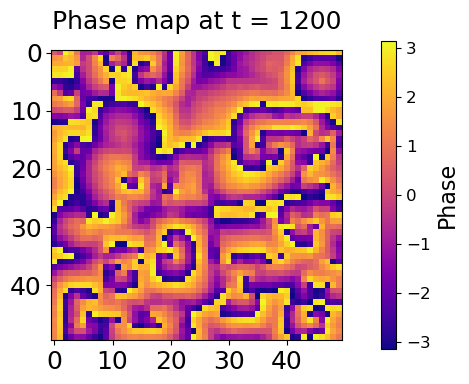

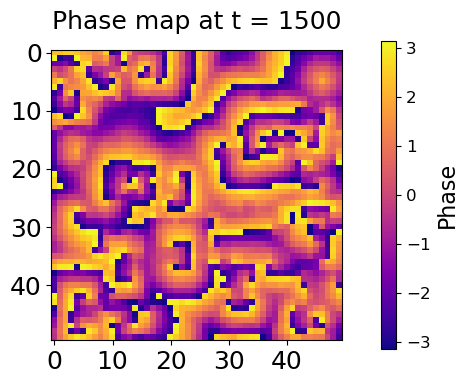

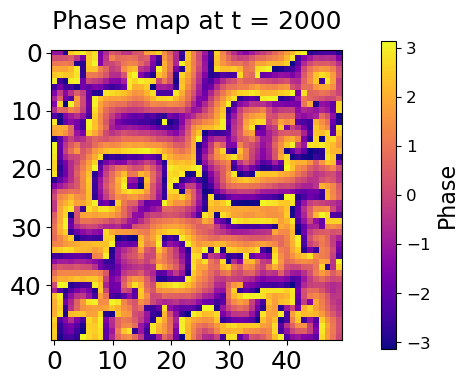

In [42]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi, (N,N))  # widerp2
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_map_at_t = " + str(T) + "widerp4_expf_incond1_excitableERIC.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the X value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Randomp: $\theta_{in}=[-\pi,\pi]$

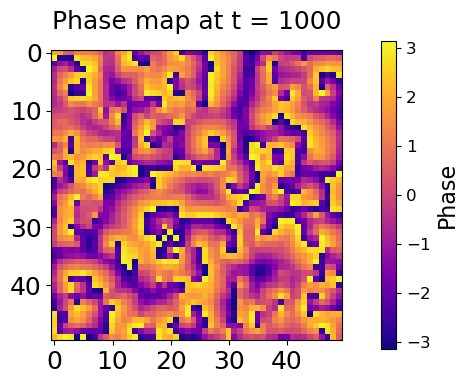

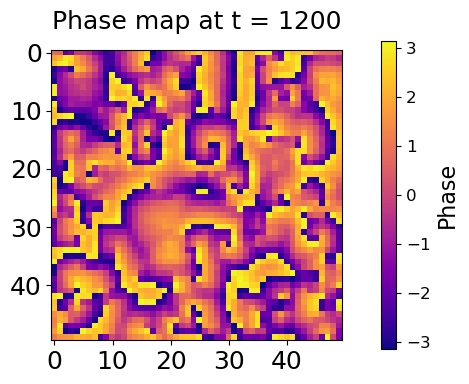

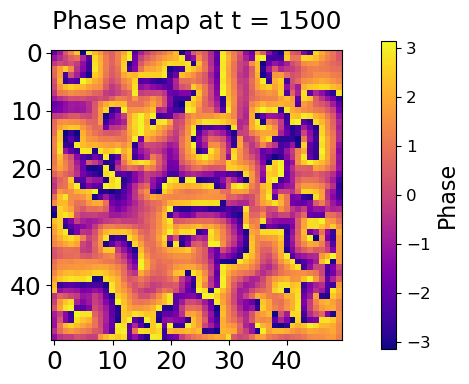

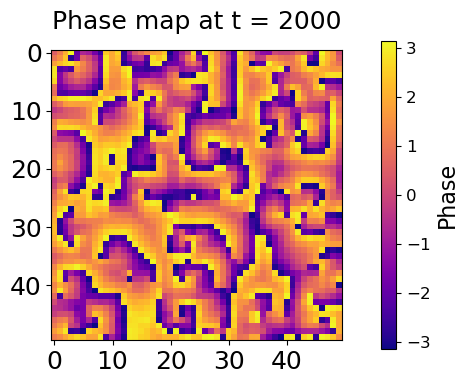

In [43]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_map_at_t = " + str(T) + "randomp_expf_incond1_excitableERIC.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 0.01


K = 0.9 * (w_max - w_min)
L = 1.8

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)


# Plot the X value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

# $b=2\pi/165$, mixed population of oscillatory and excitable elements to begin with

## Narrowp3: $\theta_{in} = [-\pi/2,\pi/2]$

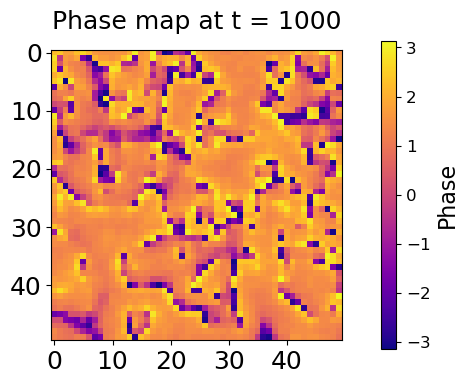

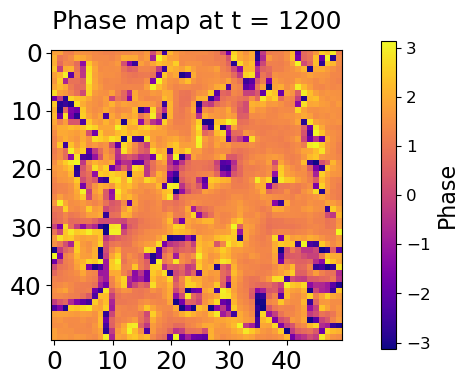

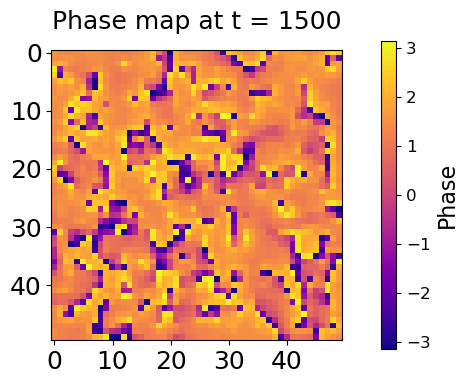

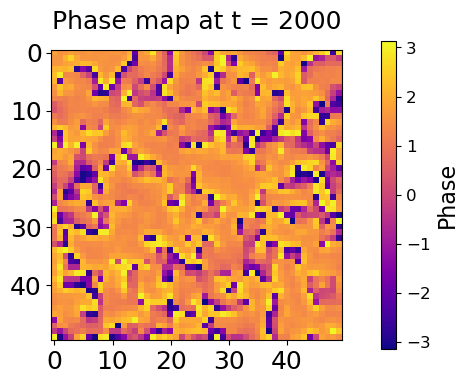

In [46]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_map_at_t = " + str(T) + "narrowp3_expf_incond1_mixedpop_exERIC.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 2*np.pi/165


K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the X value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Randomp: $\theta_{in}=[-\pi,\pi]$

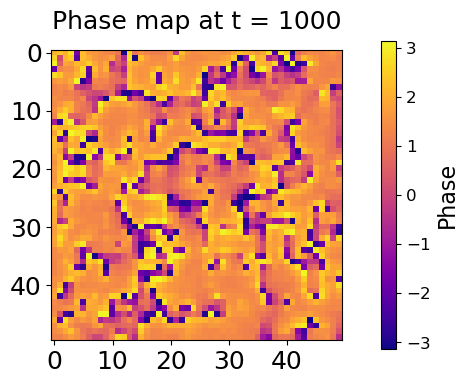

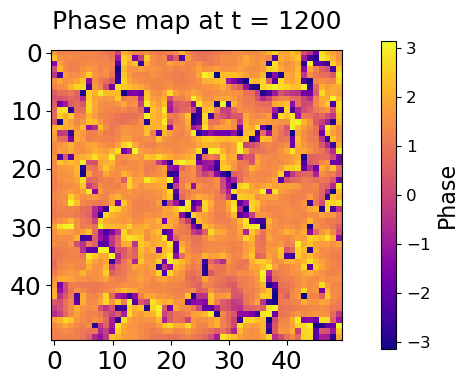

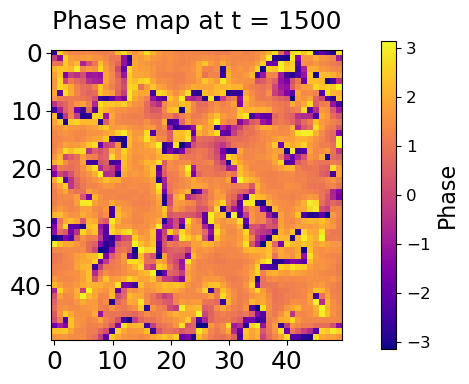

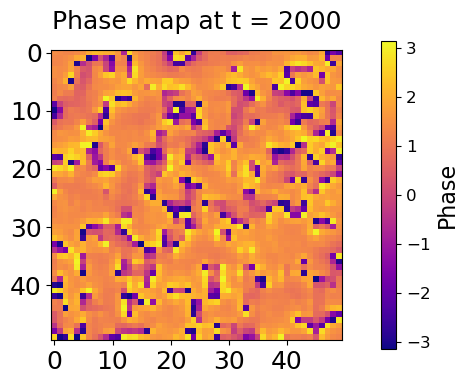

In [47]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_map_at_t = " + str(T) + "randomp_expf_incond1_mixedpop_exERIC.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 2*np.pi/165


K = 0.9 * (w_max - w_min)
L = 1.8

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)


# Plot the X value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## $b=2\pi/145$ min$^{-1}$, all excitable elements to begin with

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

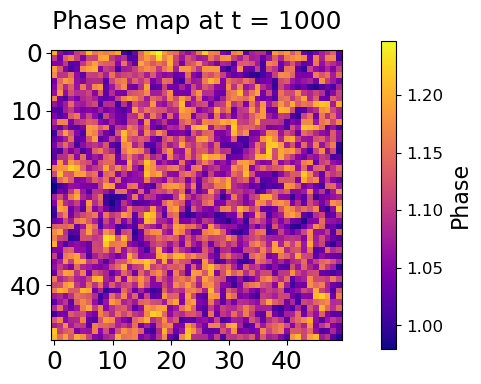

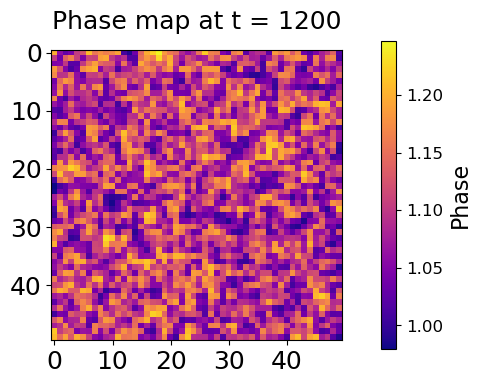

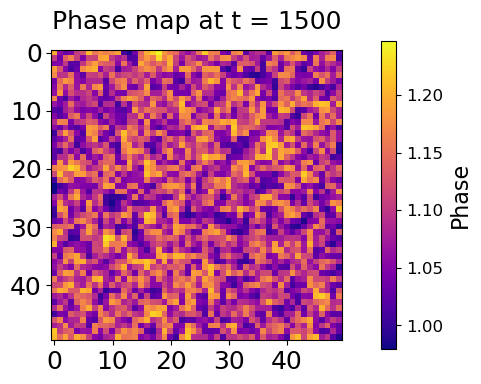

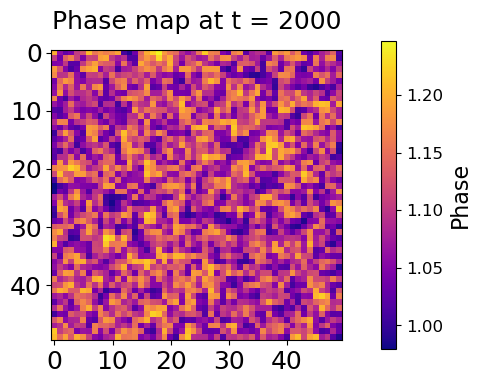

In [50]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_map_at_t = " + str(T) + "narrowp3_expf_incond1_mixedpop_exERIC.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 2*np.pi/145


K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the X value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Note the narrow range of final phases indicating homogenity in the final phasemaps

## Randomp: $\theta_{in}=[-\pi,\pi]$

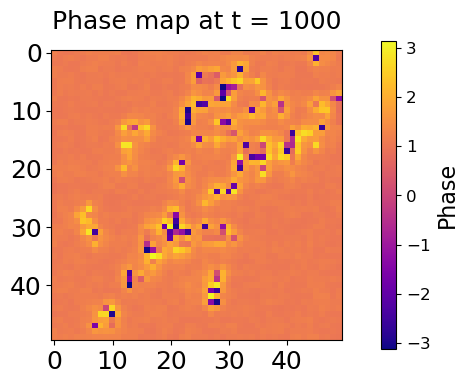

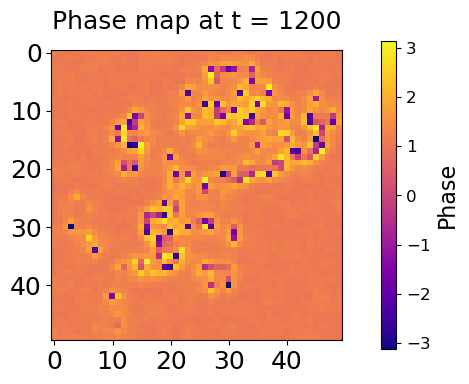

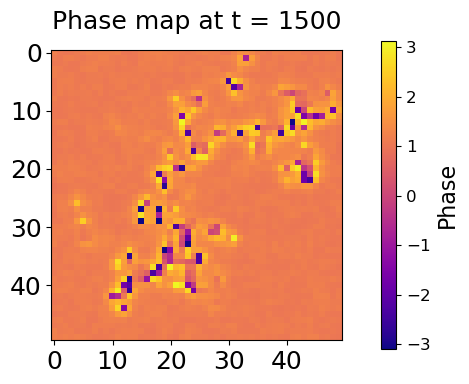

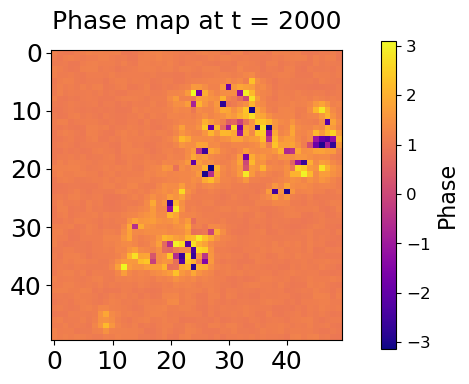

In [51]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0] 

    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N, N))  # Storing the phases

    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))  # Ensuring that phi is between -pi and pi
        X[t, :, :] = phi
    # Plot the X value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(X[-1, :, :], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8, pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel('Phase', fontsize=16)
    plt.title('Phase map at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_map_at_t = " + str(T) + "randomp_expf_incond1_mixedpop_exERIC.jpg", dpi = 300)
    plt.show()
    

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 2*np.pi/145


K = 0.9 * (w_max - w_min)
L = 1.8

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)


# Plot the X value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Local coherence maps:

These are the maps of the values of the instantaneous local order parameter defined by $$ \rho_{l:(i,j)}(t) = \frac{1}{4} \Big \vert  e^{i\theta_{i+1,j}(t)} + e^{i\theta_{i-1,j}(t)} + e^{i\theta_{i,j+1}(t)} + e^{i\theta_{i,j-1}(t)} \Big \vert $$

# $b=0.01$ min$^{-1}$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

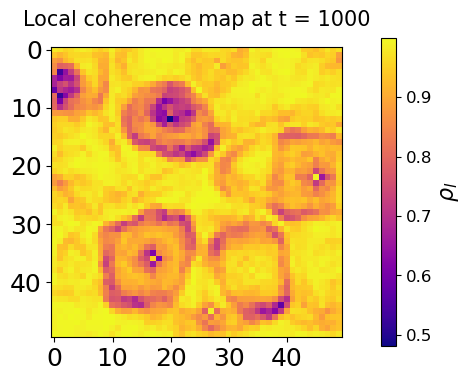

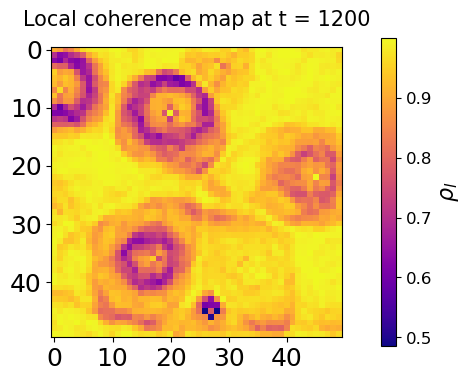

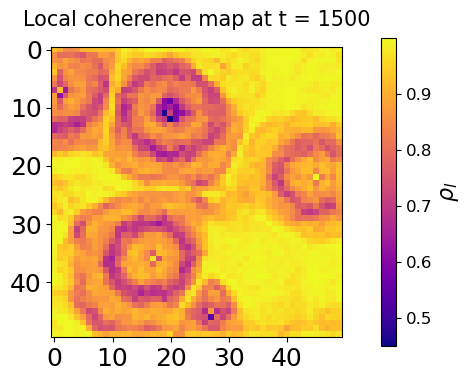

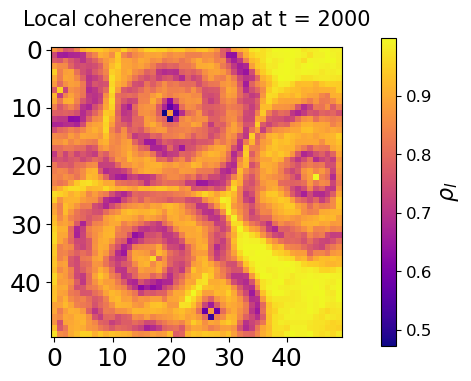

In [52]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reprodicibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distributions with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain neighboring phases after applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt     
            
# function to genenerate local coherence maps

def local_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    
    rho_local = np.zeros(( N, N))
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
    
         
    phi_sum = np.zeros((N, N))
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
         
        
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    
    phi_sum =(1/4) *(np.exp(1j*phi_up) + np.exp(1j*phi_down) + np.exp(1j*phi_left) + np.exp(1j*phi_right) )
    
    rho_local = np.abs(phi_sum)

    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(rho_local, cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$\rho_{l}$', fontsize=16)
    plt.title('Local coherence map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Local_coherence_map_at_t = " + str(T) + "excitable_narrowp3_incond1.jpg", dpi = 300)
    plt.show()
    
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

b = 0.01


omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the local coherence at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    local_coherence_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b) 

## Randomp: $\theta_{in}=[-\pi,\pi]$

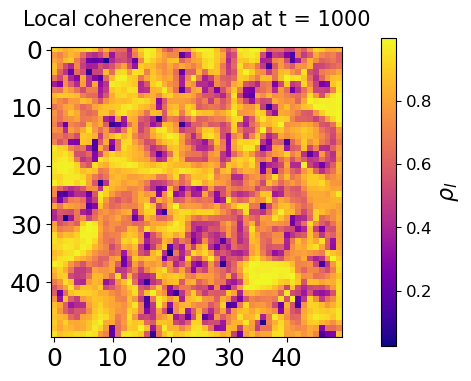

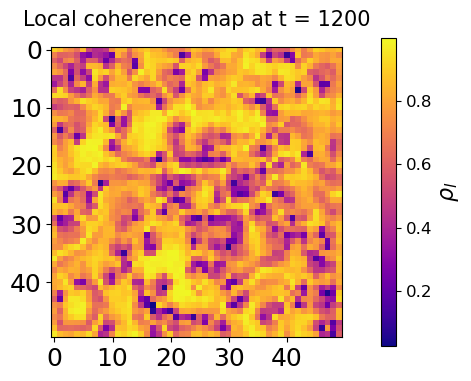

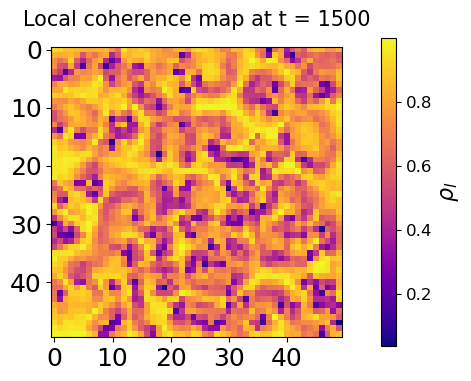

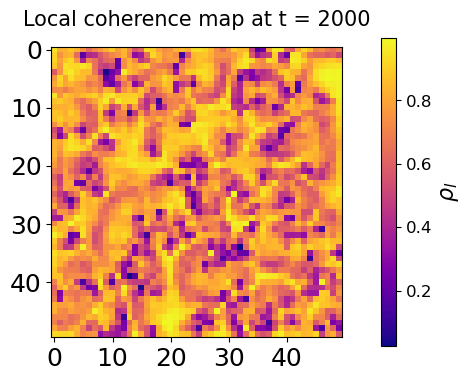

In [53]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reprodicibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distributions with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain neighboring phases after applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt     
            
# function to genenerate local coherence maps

def local_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    
    rho_local = np.zeros(( N, N))
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
    
         
    phi_sum = np.zeros((N, N))
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
         
        
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    
    phi_sum =(1/4) *(np.exp(1j*phi_up) + np.exp(1j*phi_down) + np.exp(1j*phi_left) + np.exp(1j*phi_right) )
    
    rho_local = np.abs(phi_sum)

    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(rho_local, cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$\rho_{l}$', fontsize=16)
    plt.title('Local coherence map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Local_coherence_map_at_t = " + str(T) + "excitable_randomp_incond1.jpg", dpi = 300)
    plt.show()
    
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

b = 0.01


omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the local coherence at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    local_coherence_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b) 

# $b=2\pi/165$ min$^{-1}$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

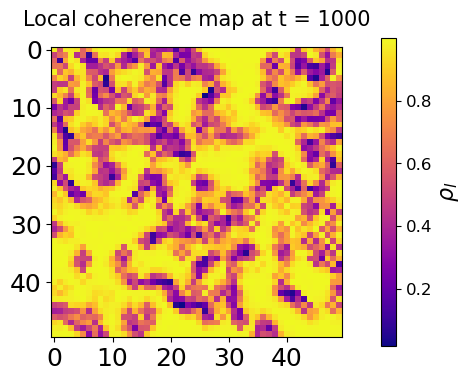

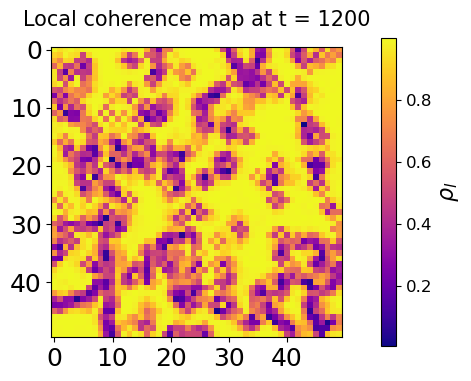

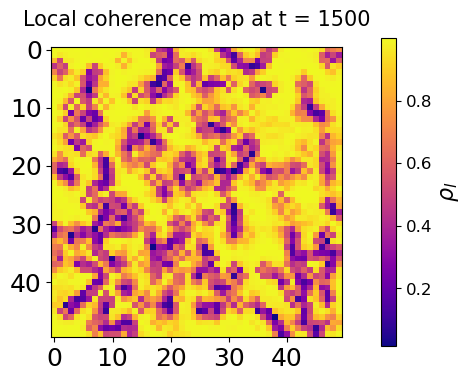

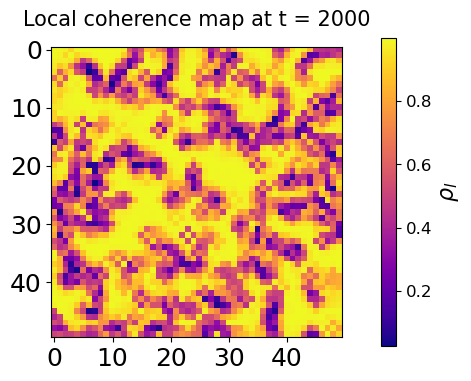

In [54]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reprodicibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distributions with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain neighboring phases after applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt     
            
# function to genenerate local coherence maps

def local_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    
    rho_local = np.zeros(( N, N))
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
    
         
    phi_sum = np.zeros((N, N))
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
         
        
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    
    phi_sum =(1/4) *(np.exp(1j*phi_up) + np.exp(1j*phi_down) + np.exp(1j*phi_left) + np.exp(1j*phi_right) )
    
    rho_local = np.abs(phi_sum)

    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(rho_local, cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$\rho_{l}$', fontsize=16)
    plt.title('Local coherence map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Local_coherence_map_at_t = " + str(T) + "mixedpop_narrowp3_incond1.jpg", dpi = 300)
    plt.show()
    
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

b = 2*np.pi/165


omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the local coherence at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    local_coherence_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b) 

## Randomp: $\theta_{in}=[-\pi,\pi]$

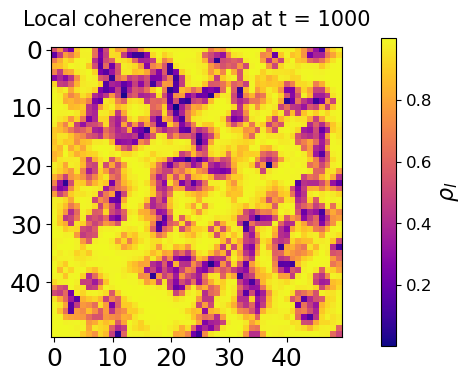

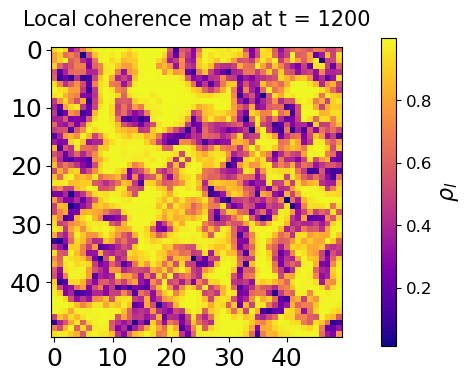

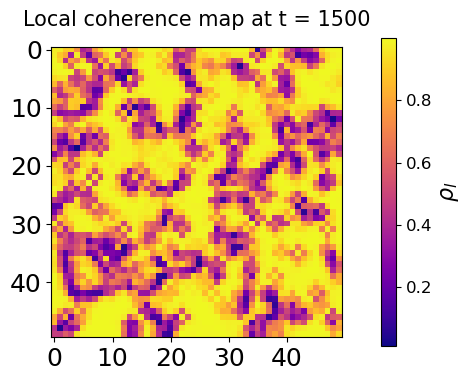

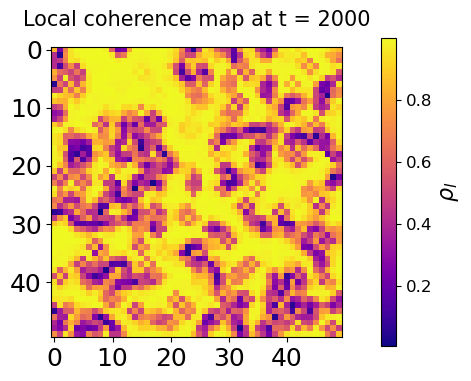

In [57]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reprodicibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distributions with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain neighboring phases after applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt     
            
# function to genenerate local coherence maps

def local_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    
    rho_local = np.zeros(( N, N))
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
    
         
    phi_sum = np.zeros((N, N))
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
         
        
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    
    phi_sum =(1/4) *(np.exp(1j*phi_up) + np.exp(1j*phi_down) + np.exp(1j*phi_left) + np.exp(1j*phi_right) )
    
    rho_local = np.abs(phi_sum)

    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(rho_local, cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$\rho_{l}$', fontsize=16)
    plt.title('Local coherence map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Local_coherence_map_at_t = " + str(T) + "mixedpop_randomp_incond1.jpg", dpi = 300)
    plt.show()
    
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

b = 2*np.pi/165


omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the local coherence at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    local_coherence_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b) 

# $b=2\pi/145$ min$^{-1}$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

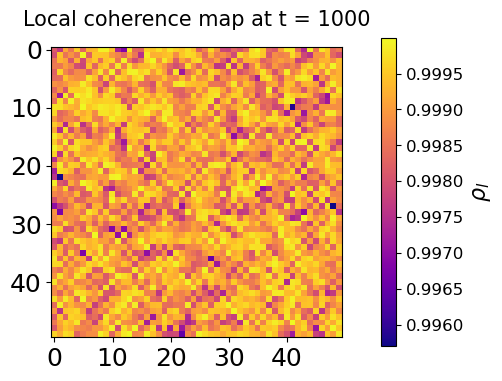

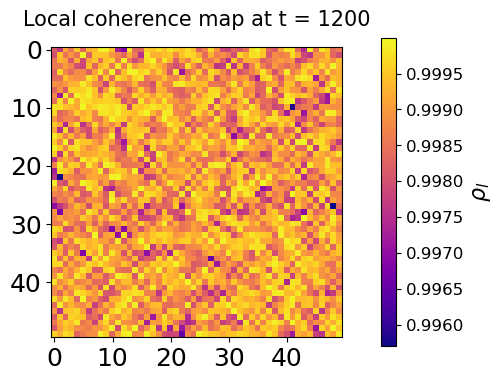

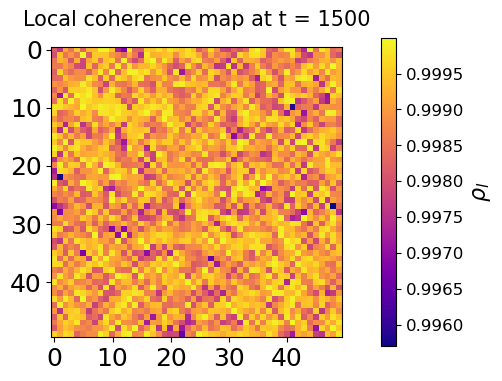

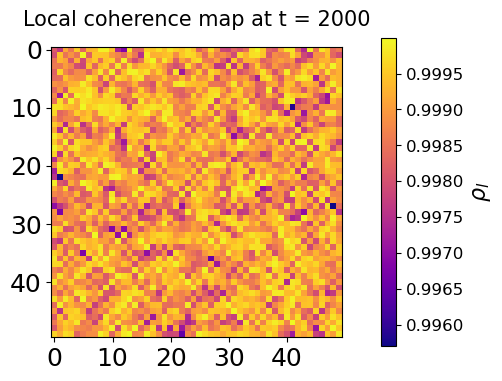

In [56]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reprodicibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distributions with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain neighboring phases after applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt     
            
# function to genenerate local coherence maps

def local_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    
    rho_local = np.zeros(( N, N))
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
    
         
    phi_sum = np.zeros((N, N))
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
         
        
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    
    phi_sum =(1/4) *(np.exp(1j*phi_up) + np.exp(1j*phi_down) + np.exp(1j*phi_left) + np.exp(1j*phi_right) )
    
    rho_local = np.abs(phi_sum)

    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(rho_local, cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$\rho_{l}$', fontsize=16)
    plt.title('Local coherence map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Local_coherence_map_at_t = " + str(T) + "mixedpop_narrowp3_incond1.jpg", dpi = 300)
    plt.show()
    
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

b = 2*np.pi/145


omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the local coherence at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    local_coherence_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b) 

## Randomp: $\theta_{in}=[-\pi,\pi]$

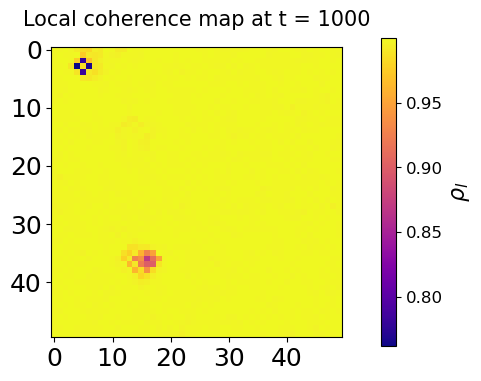

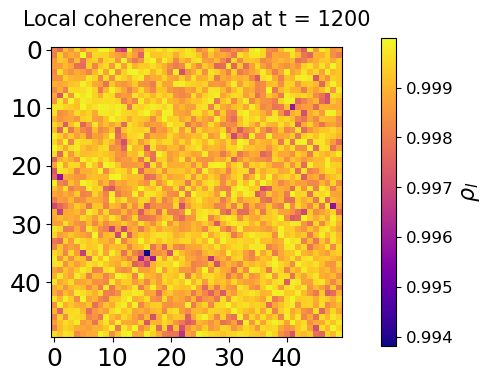

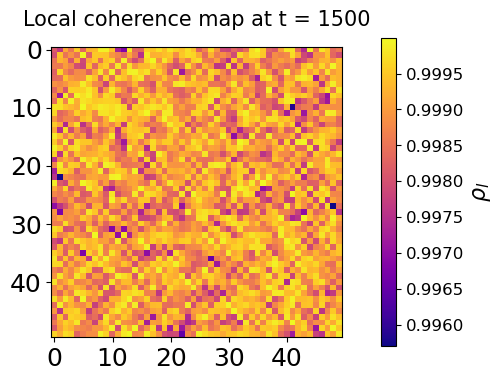

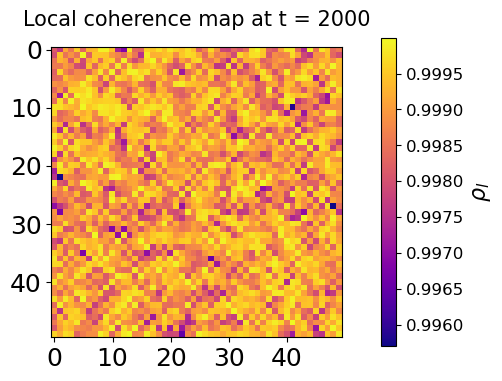

In [55]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reprodicibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distributions with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain neighboring phases after applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt     
            
# function to genenerate local coherence maps

def local_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    
    rho_local = np.zeros(( N, N))
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
    
         
    phi_sum = np.zeros((N, N))
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
         
        
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    
    phi_sum =(1/4) *(np.exp(1j*phi_up) + np.exp(1j*phi_down) + np.exp(1j*phi_left) + np.exp(1j*phi_right) )
    
    rho_local = np.abs(phi_sum)

    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(rho_local, cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$\rho_{l}$', fontsize=16)
    plt.title('Local coherence map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Local_coherence_map_at_t = " + str(T) + "mixedpop_randomp_incond1.jpg", dpi = 300)
    plt.show()
    
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

b = 2*np.pi/145


omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the local coherence at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    local_coherence_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b) 

# Global coherence

This is defined by the instantaneous global order parameter: $$ \rho_{g}(t) = \frac{1}{N^{2}} \Big \vert \sum_{i=1}^{N} \sum_{j=1}^{N} e^{i \theta_{i,j}(t)} \Big \vert $$

# $b=0.01$ min$^{-1}$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

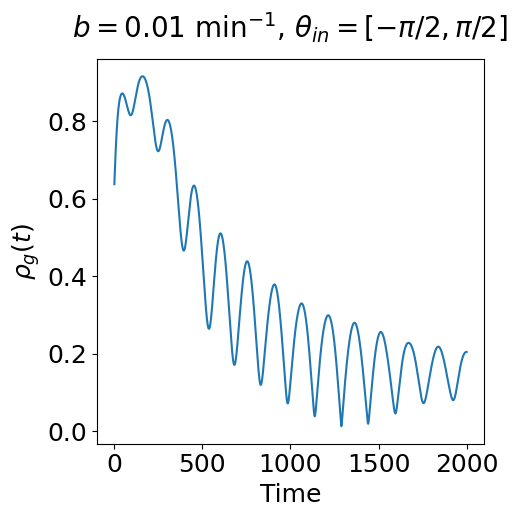

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain the neighboring phases by applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt 

# function to plot the global coherence vs time

def global_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    rho =  np.zeros(num_steps)
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
    
        r =  np.abs(np.mean( np.exp(1j* phi)  ))
        rho [t] = r
    # plot the order parameter modulus as a function of time
    t = np.linspace(0, T, num_steps)
    plt.figure(figsize=(5, 5))
    plt.plot(t, rho)
    plt.title(r'$b=0.01$ min$^{-1}$, $\theta_{in}=[-\pi/2,\pi/2]$', fontsize = 20, pad = 15)
    plt.xlabel('Time', fontsize = 18)
    plt.ylabel(r'$\rho_{g}(t)$', fontsize = 18)
    plt.xticks(fontsize = 18)
    plt.yticks(fontsize = 18)
    ax = plt.gca()
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=5)) 
#    plt.savefig("Global_order_parameter_vs_time_alloscillatory_narrowp3.jpg", dpi = 300, bbox_inches='tight' )
    plt.show()
    

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
T = 2000
dt = 0.01

b = 0.01
K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the global coherence vs time

global_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b)

## Randomp: $\theta_{in}=[-\pi,\pi]$

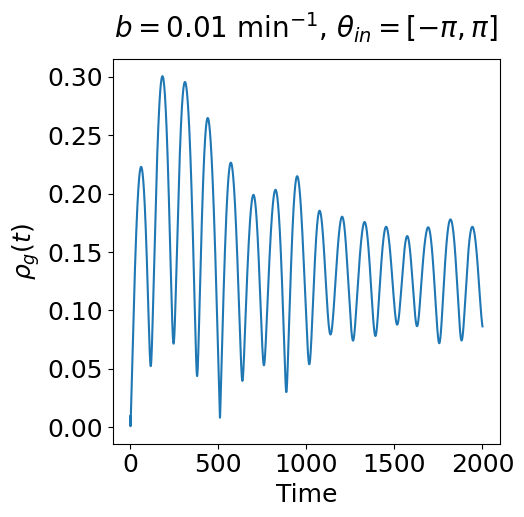

In [59]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain the neighboring phases by applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt 

# function to plot the global coherence vs time

def global_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    rho =  np.zeros(num_steps)
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
    
        r =  np.abs(np.mean( np.exp(1j* phi)  ))
        rho [t] = r
    # plot the order parameter modulus as a function of time
    t = np.linspace(0, T, num_steps)
    plt.figure(figsize=(5, 5))
    plt.plot(t, rho)
    plt.title(r'$b=0.01$ min$^{-1}$, $\theta_{in}=[-\pi,\pi]$', fontsize = 20, pad = 15)
    plt.xlabel('Time', fontsize = 18)
    plt.ylabel(r'$\rho_{g}(t)$', fontsize = 18)
    plt.xticks(fontsize = 18)
    plt.yticks(fontsize = 18)
    ax = plt.gca()
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=5)) 
#    plt.savefig("Global_order_parameter_vs_time_alloscillatory_narrowp3.jpg", dpi = 300, bbox_inches='tight' )
    plt.show()
    

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
T = 2000
dt = 0.1

b = 0.01
K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the global coherence vs time

global_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b)

# $b=2\pi/165$ min$^{-1}$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

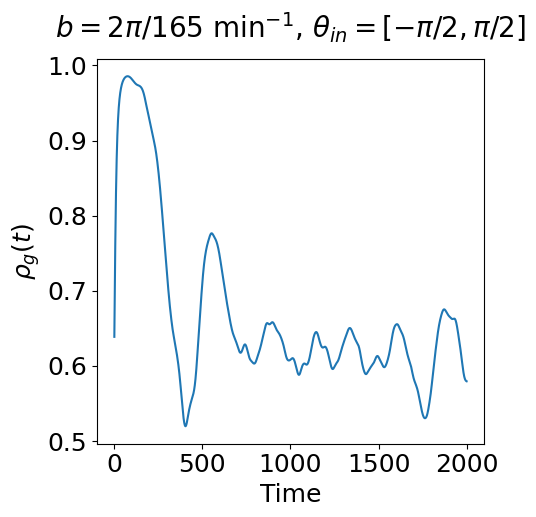

In [60]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain the neighboring phases by applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt 

# function to plot the global coherence vs time

def global_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    rho =  np.zeros(num_steps)
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
    
        r =  np.abs(np.mean( np.exp(1j* phi)  ))
        rho [t] = r
    # plot the order parameter modulus as a function of time
    t = np.linspace(0, T, num_steps)
    plt.figure(figsize=(5, 5))
    plt.plot(t, rho)
    plt.title(r'$b=2\pi/165$ min$^{-1}$, $\theta_{in}=[-\pi/2,\pi/2]$', fontsize = 20, pad = 15)
    plt.xlabel('Time', fontsize = 18)
    plt.ylabel(r'$\rho_{g}(t)$', fontsize = 18)
    plt.xticks(fontsize = 18)
    plt.yticks(fontsize = 18)
    ax = plt.gca()
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=5)) 
#    plt.savefig("Global_order_parameter_vs_time_mixedpop_narrowp3.jpg", dpi = 300, bbox_inches='tight' )
    plt.show()
    

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
T = 2000
dt = 0.01

b = 2*np.pi/165

K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the global coherence vs time

global_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b)

## Randomp: $\theta_{in}=[-\pi,\pi]$

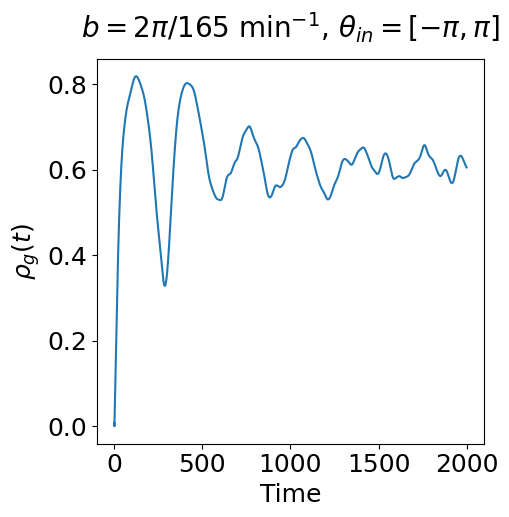

In [61]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain the neighboring phases by applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt 

# function to plot the global coherence vs time

def global_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    rho =  np.zeros(num_steps)
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
    
        r =  np.abs(np.mean( np.exp(1j* phi)  ))
        rho [t] = r
    # plot the order parameter modulus as a function of time
    t = np.linspace(0, T, num_steps)
    plt.figure(figsize=(5, 5))
    plt.plot(t, rho)
    plt.title(r'$b=2\pi/165$ min$^{-1}$, $\theta_{in}=[-\pi,\pi]$', fontsize = 20, pad = 15)
    plt.xlabel('Time', fontsize = 18)
    plt.ylabel(r'$\rho_{g}(t)$', fontsize = 18)
    plt.xticks(fontsize = 18)
    plt.yticks(fontsize = 18)
    ax = plt.gca()
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=5)) 
#    plt.savefig("Global_order_parameter_vs_time_mixedpop_randomp.jpg", dpi = 300, bbox_inches='tight' )
    plt.show()
    

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
T = 2000
dt = 0.01

b = 2*np.pi/165

K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the global coherence vs time

global_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b)

# $b=2\pi/145$ min$^{-1}$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

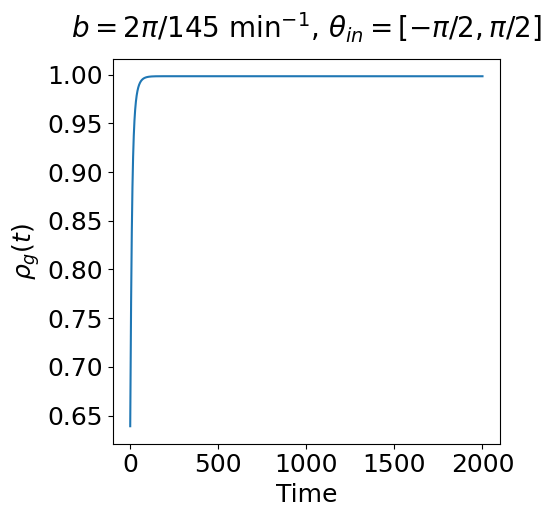

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain the neighboring phases by applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt 

# function to plot the global coherence vs time

def global_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    rho =  np.zeros(num_steps)
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
    
        r =  np.abs(np.mean( np.exp(1j* phi)  ))
        rho [t] = r
    # plot the order parameter modulus as a function of time
    t = np.linspace(0, T, num_steps)
    plt.figure(figsize=(5, 5))
    plt.plot(t, rho)
    plt.title(r'$b=2\pi/145$ min$^{-1}$, $\theta_{in}=[-\pi/2,\pi/2]$', fontsize = 20, pad = 15)
    plt.xlabel('Time', fontsize = 18)
    plt.ylabel(r'$\rho_{g}(t)$', fontsize = 18)
    plt.xticks(fontsize = 18)
    plt.yticks(fontsize = 18)
    ax = plt.gca()
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=5)) 
#    plt.savefig("Global_order_parameter_vs_time_allexcitable_narrowp3.jpg", dpi = 300, bbox_inches='tight' )
    plt.show()
    

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
T = 2000
dt = 0.01

b = 2*np.pi/145

K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the global coherence vs time

global_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b)

## Randomp: $\theta_{in}=[-\pi,\pi]$

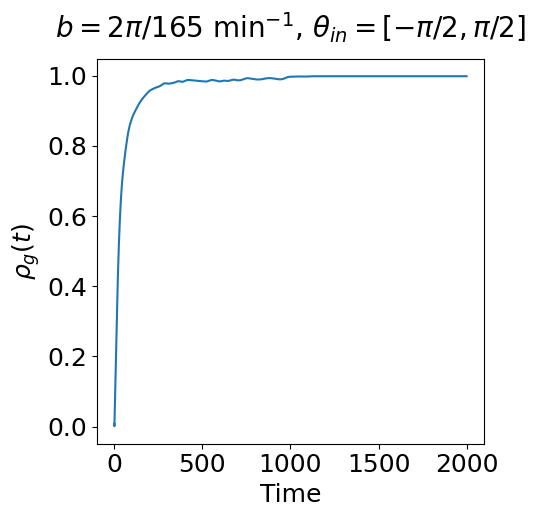

In [63]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain the neighboring phases by applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt 

# function to plot the global coherence vs time

def global_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    rho =  np.zeros(num_steps)
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
    
        r =  np.abs(np.mean( np.exp(1j* phi)  ))
        rho [t] = r
    # plot the order parameter modulus as a function of time
    t = np.linspace(0, T, num_steps)
    plt.figure(figsize=(5, 5))
    plt.plot(t, rho)
    plt.title(r'$b=2\pi/165$ min$^{-1}$, $\theta_{in}=[-\pi/2,\pi/2]$', fontsize = 20, pad = 15)
    plt.xlabel('Time', fontsize = 18)
    plt.ylabel(r'$\rho_{g}(t)$', fontsize = 18)
    plt.xticks(fontsize = 18)
    plt.yticks(fontsize = 18)
    ax = plt.gca()
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=5)) 
#    plt.savefig("Global_order_parameter_vs_time_allexcitable_randomp.jpg", dpi = 300, bbox_inches='tight' )
    plt.show()
    

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
T = 2000
dt = 0.01

b = 2*np.pi/145

K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the global coherence vs time

global_coherence_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b)

# Phase field

# $b=0.01$ min$^{-1}$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

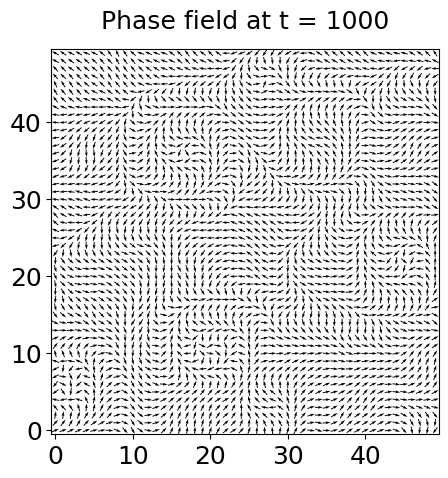

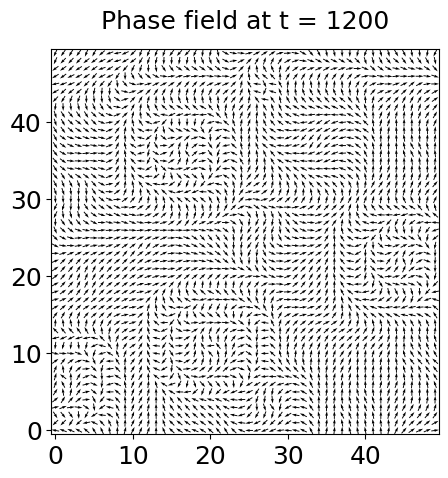

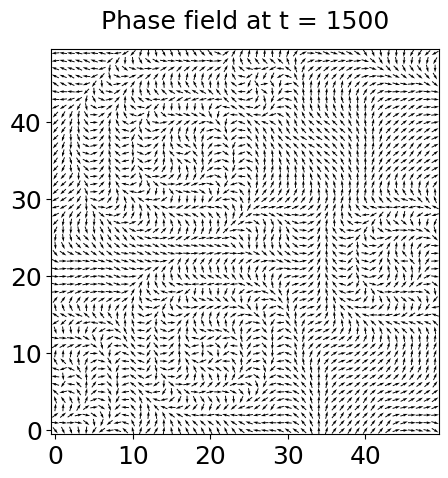

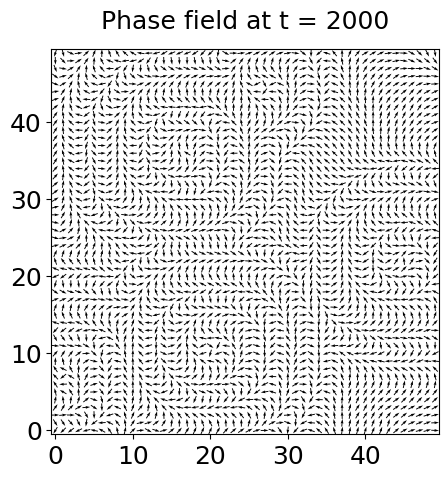

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.figure import figaspect

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distributions of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain the neighboring phases and apply open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt

# function to generate the phase field

def phase_field_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    # Initialize the natural frequencies
    omega = omega_initial.copy() 
    # Initialize the phases of the oscillators
    phi = phi_initial.copy()
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))
    
    
    # Generate a grid of x and y coordinates
    x, y = np.meshgrid(np.arange(N), np.arange(N))    
    u = np.cos(phi)
    v = np.sin(phi)
    w, h = figaspect(1)
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.quiver(x, y, u, v, angles='xy', scale_units='xy', scale=1, pivot='mid')
    ax.set_xlim(-0.5, N-0.5)
    ax.set_ylim(-0.5, N-0.5)
    plt.title('Phase field at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_field_at_t = " + str(T) + "narrowp3_excitableERIC.jpg", dpi = 300)
    plt.show()

    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

b = 0.01

K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the phase field value at the final step 

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_field_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Randomp: $\theta_{in}=[-\pi,\pi]$

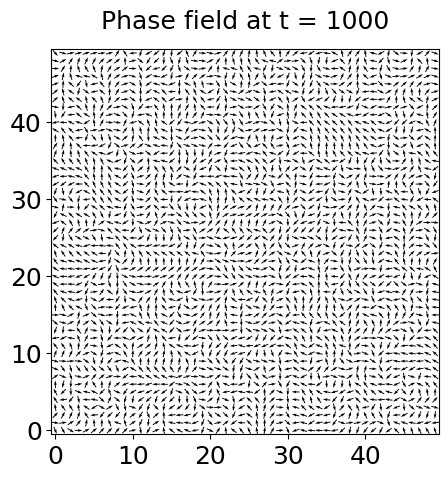

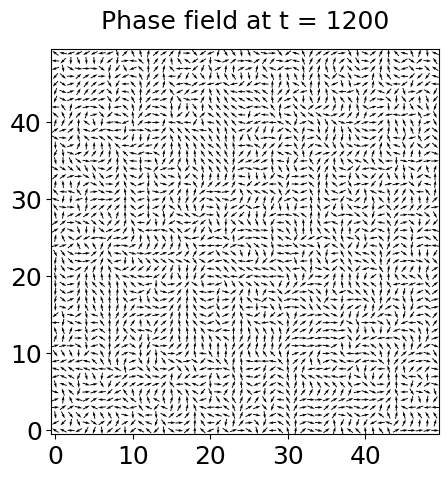

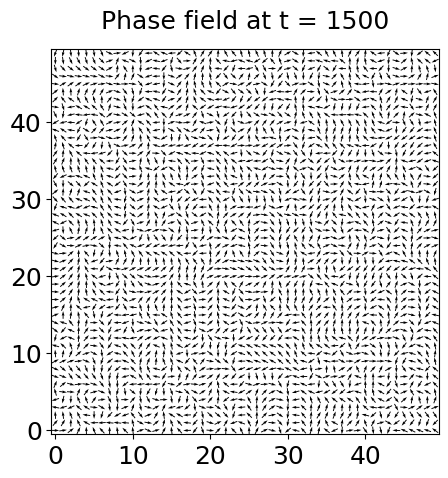

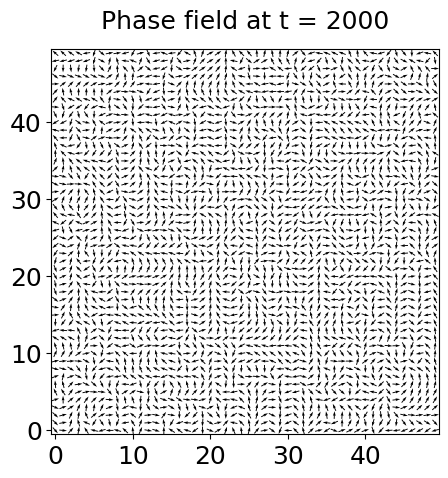

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.figure import figaspect

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distributions of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain the neighboring phases and apply open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt

# function to generate the phase field

def phase_field_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    # Initialize the natural frequencies
    omega = omega_initial.copy() 
    # Initialize the phases of the oscillators
    phi = phi_initial.copy()
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))
    
    
    # Generate a grid of x and y coordinates
    x, y = np.meshgrid(np.arange(N), np.arange(N))    
    u = np.cos(phi)
    v = np.sin(phi)
    w, h = figaspect(1)
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.quiver(x, y, u, v, angles='xy', scale_units='xy', scale=1, pivot='mid')
    ax.set_xlim(-0.5, N-0.5)
    ax.set_ylim(-0.5, N-0.5)
    plt.title('Phase field at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_field_at_t = " + str(T) + "randomp_excitableERIC.jpg", dpi = 300)
    plt.show()

    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

b = 0.01

K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the phase field value at the final step 

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_field_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

# $b=2\pi/165$ min$^{-1}$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

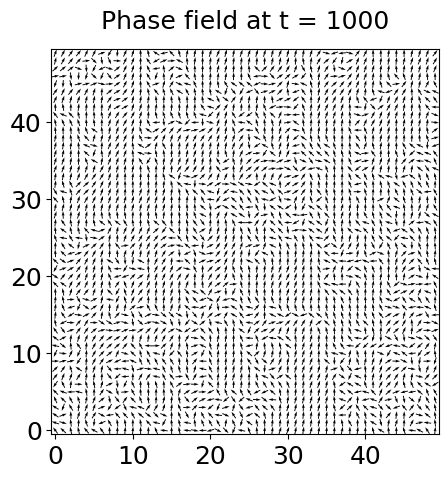

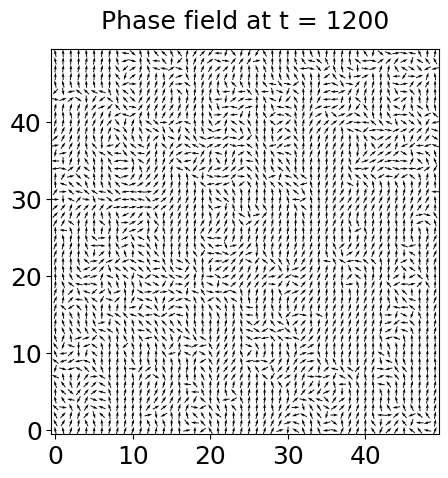

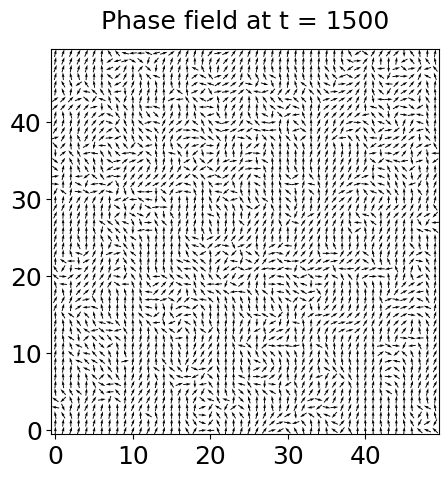

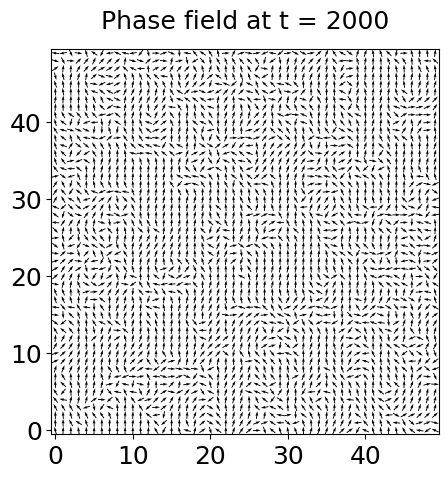

In [68]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.figure import figaspect

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min, w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distributions of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain the neighboring phases and apply open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt

# function to generate the phase field

def phase_field_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    # Initialize the natural frequencies
    omega = omega_initial.copy() 
    # Initialize the phases of the oscillators
    phi = phi_initial.copy()
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))
    
    
    # Generate a grid of x and y coordinates
    x, y = np.meshgrid(np.arange(N), np.arange(N))    
    u = np.cos(phi)
    v = np.sin(phi)
    w, h = figaspect(1)
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.quiver(x, y, u, v, angles='xy', scale_units='xy', scale=1, pivot='mid')
    ax.set_xlim(-0.5, N-0.5)
    ax.set_ylim(-0.5, N-0.5)
    plt.title('Phase field at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_field_at_t = " + str(T) + "narrowp3_mixedpop_exERIC.jpg", dpi = 300)
    plt.show()

    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

b = 2*np.pi/165

K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the phase field value at the final step 

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_field_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Randomp: $\theta_{in}=[\pi,\pi]$

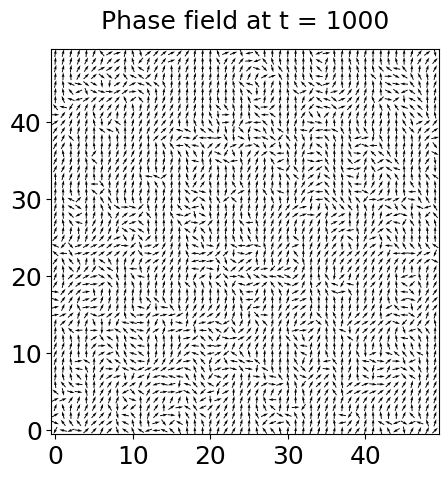

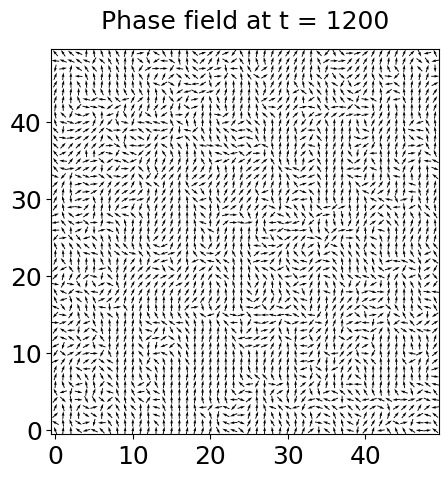

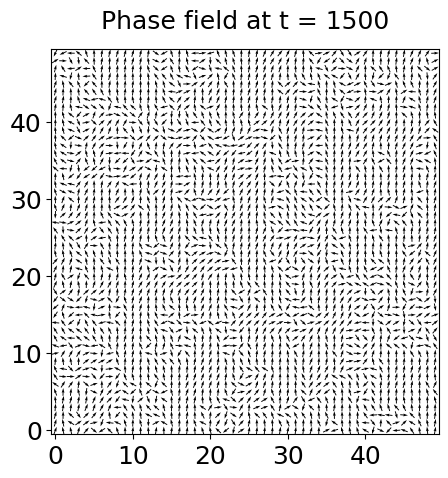

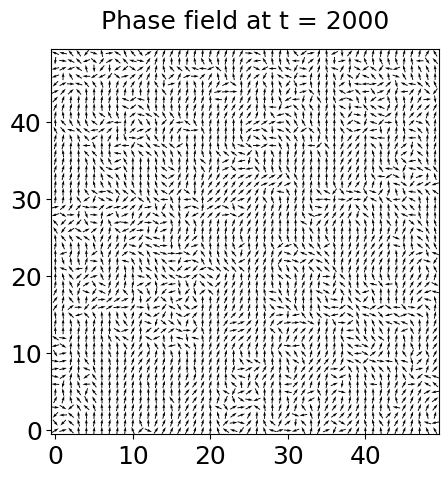

In [69]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.figure import figaspect

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min, w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distributions of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain the neighboring phases and apply open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt

# function to generate the phase field

def phase_field_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    # Initialize the natural frequencies
    omega = omega_initial.copy() 
    # Initialize the phases of the oscillators
    phi = phi_initial.copy()
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))
    
    
    # Generate a grid of x and y coordinates
    x, y = np.meshgrid(np.arange(N), np.arange(N))    
    u = np.cos(phi)
    v = np.sin(phi)
    w, h = figaspect(1)
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.quiver(x, y, u, v, angles='xy', scale_units='xy', scale=1, pivot='mid')
    ax.set_xlim(-0.5, N-0.5)
    ax.set_ylim(-0.5, N-0.5)
    plt.title('Phase field at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_field_at_t = " + str(T) + "randomp_mixedpop_exERIC.jpg", dpi = 300)
    plt.show()

    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

b = 2*np.pi/165

K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the phase field value at the final step 

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_field_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

# $b=2\pi/145$ min$^{-1}$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

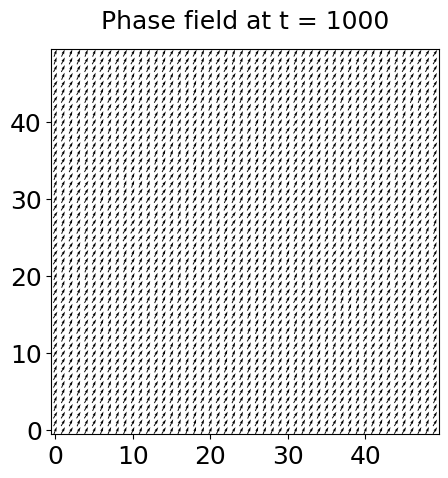

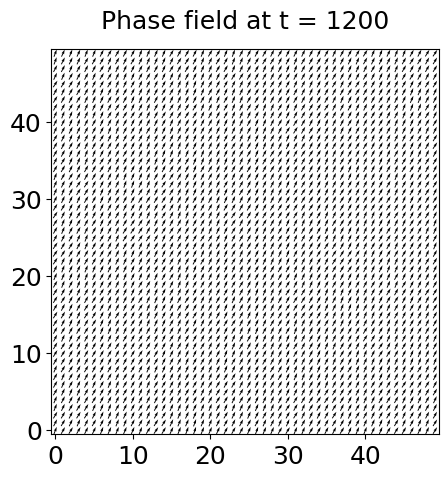

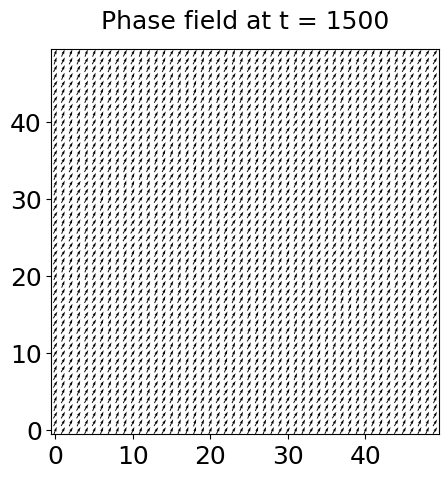

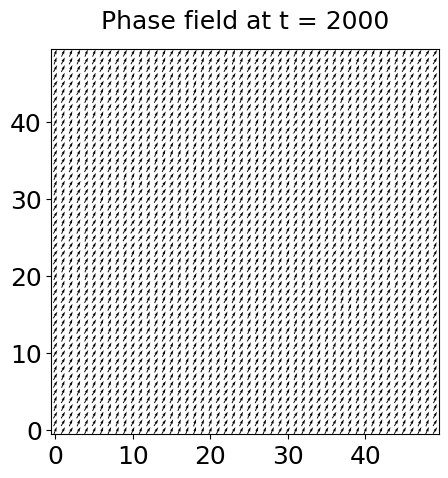

In [70]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.figure import figaspect

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min, w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distributions of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain the neighboring phases and apply open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt

# function to generate the phase field

def phase_field_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    # Initialize the natural frequencies
    omega = omega_initial.copy() 
    # Initialize the phases of the oscillators
    phi = phi_initial.copy()
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))
    
    
    # Generate a grid of x and y coordinates
    x, y = np.meshgrid(np.arange(N), np.arange(N))    
    u = np.cos(phi)
    v = np.sin(phi)
    w, h = figaspect(1)
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.quiver(x, y, u, v, angles='xy', scale_units='xy', scale=1, pivot='mid')
    ax.set_xlim(-0.5, N-0.5)
    ax.set_ylim(-0.5, N-0.5)
    plt.title('Phase field at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_field_at_t = " + str(T) + "narrowp3_allexcitable_exERIC.jpg", dpi = 300)
    plt.show()

    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

b = 2*np.pi/145

K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)

# Plot the phase field value at the final step 

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_field_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Randomp: $\theta_{in}=[\pi,\pi]$

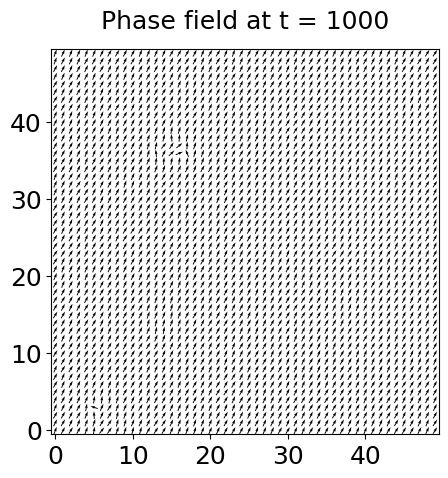

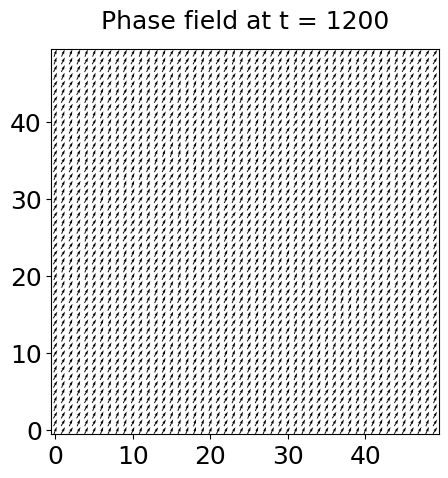

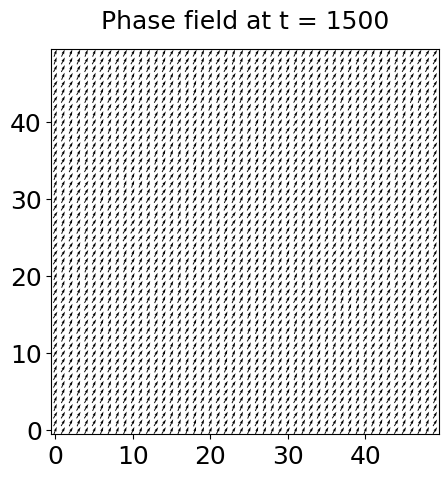

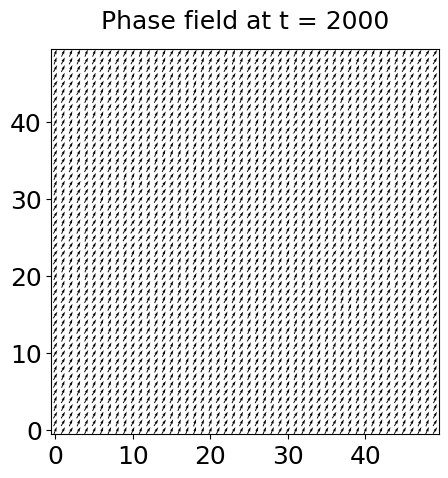

In [71]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.figure import figaspect

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min, w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distributions of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# Obtain the neighboring phases and apply open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):            
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt

# function to generate the phase field

def phase_field_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1
    # Initialize the natural frequencies
    omega = omega_initial.copy() 
    # Initialize the phases of the oscillators
    phi = phi_initial.copy()
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        phi = np.angle(np.exp(1j * phi))
    
    
    # Generate a grid of x and y coordinates
    x, y = np.meshgrid(np.arange(N), np.arange(N))    
    u = np.cos(phi)
    v = np.sin(phi)
    w, h = figaspect(1)
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.quiver(x, y, u, v, angles='xy', scale_units='xy', scale=1, pivot='mid')
    ax.set_xlim(-0.5, N-0.5)
    ax.set_ylim(-0.5, N-0.5)
    plt.title('Phase field at t = ' + str(T), fontsize = 18, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Phase_field_at_t = " + str(T) + "narrowp3_mixedpop_exERIC.jpg", dpi = 300)
    plt.show()

    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

b = 2*np.pi/145

K = 0.8 * (w_max - w_min)
L = 1.7

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)

# Plot the phase field value at the final step 

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    phase_field_ERIC_2d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)

## Instantaneous frequency maps: Maps of $d\theta_{i,j}(t)/dt$

# $b=0.01$ min$^{-1}$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

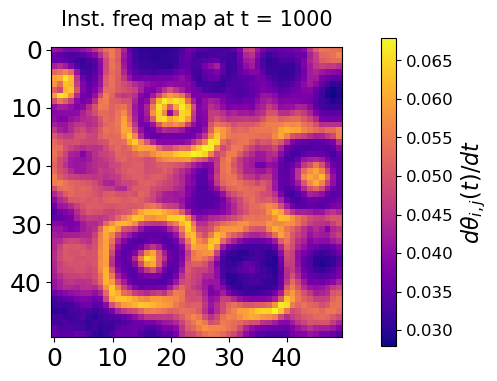

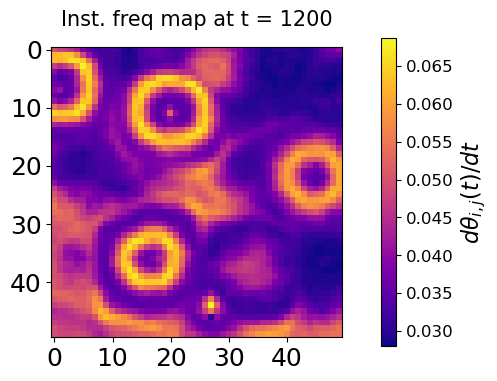

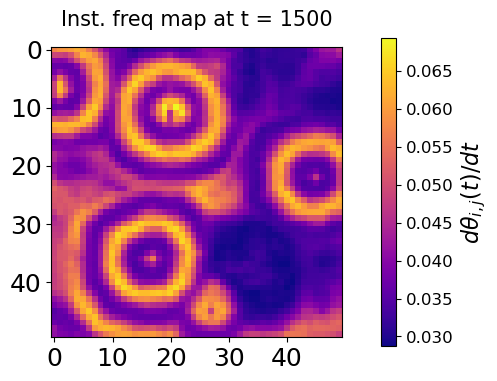

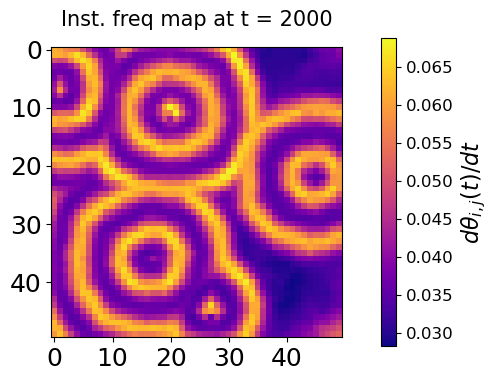

In [78]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility 

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to obtain the neighboring phases after applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*((np.sin(phi_up-phi))**2) + L*((np.sin(phi_down-phi))**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*((np.sin(phi_left-phi))**2) + L*((np.sin(phi_right-phi))**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt
   
# function to compute and plot the instantaneous frequencies as a heatmap

def inst_frequency_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1

    Y = np.zeros((num_steps, N, N)) # ratio of dphi_dt and average of dphi_dt at some t
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
    
         
    dphi_dt  = np.zeros((N, N))
    
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        
        dphi_dt = ERIC_2d_excitable(phi, N, K, omega, L, b)
        
        Y[t,:,:] = dphi_dt
        
        
    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(Y[-1,:,:], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$d\theta_{i,j}(t)/ dt $', fontsize=16)
    plt.title('Inst. freq map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Instantaneous_frequency_map_at_t = " + str(T) + "narrowp3_alloscillatory.jpg", dpi = 300)
    plt.show()
    
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

b = 0.01

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the Y value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    inst_frequency_map_ERIC_2d_excitable(N, T_list[i], dt,K, L, omega_initial, phi_initial, b) 

## Randomp: $\theta_{in} = [-\pi,\pi]$

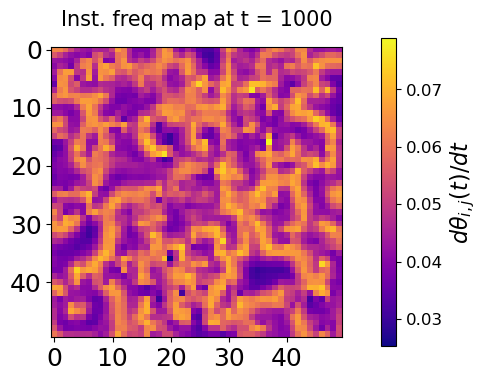

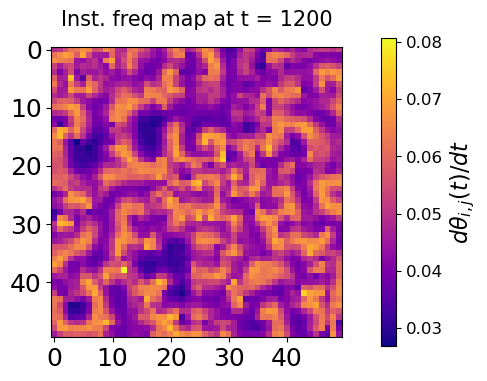

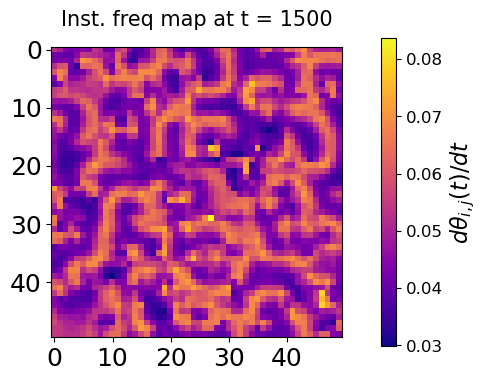

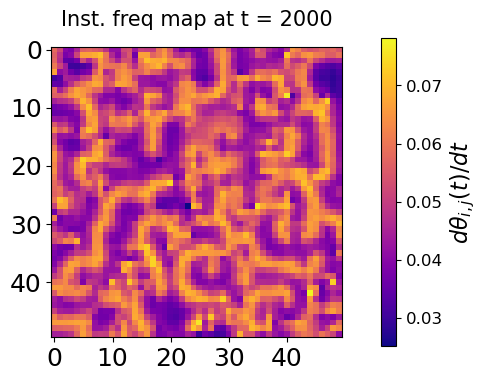

In [75]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility 

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to obtain the neighboring phases after applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt
   
# function to compute and plot the instantaneous frequencies as a heatmap

def inst_frequency_map_ERIC_2d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int(T/dt) + 1

    Y = np.zeros((num_steps, N, N)) # ratio of dphi_dt and average of dphi_dt at some t
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
    
         
    dphi_dt  = np.zeros((N, N))
    
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        
        dphi_dt = ERIC_2d_excitable(phi, N, K, omega, L, b)
        
        Y[t,:,:] = dphi_dt
        
        
    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(Y[-1,:,:], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$d\theta_{i,j}(t)/ dt $', fontsize=16)
    plt.title('Inst. freq map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Instantaneous_frequency_map_at_t = " + str(T) + "randomp_alloscillatory.jpg", dpi = 300)
    plt.show()
    
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

b = 0.01

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)


# Plot the Y value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    inst_frequency_map_ERIC_2d_excitable(N, T_list[i], dt,K, L, omega_initial, phi_initial, b) 

## Ratio of instantaneous frequency at a site versus average of instantaneous frequencies of neighbors

# $r^{\omega,l}_{i,j}(t) = \frac{d \theta_{i,j}(t)}{dt} / \frac{\overline{d \theta_{i,j}(t)} }{dt} \vert_{nn}$

# $b=0.01$ min$^{-1}$

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$

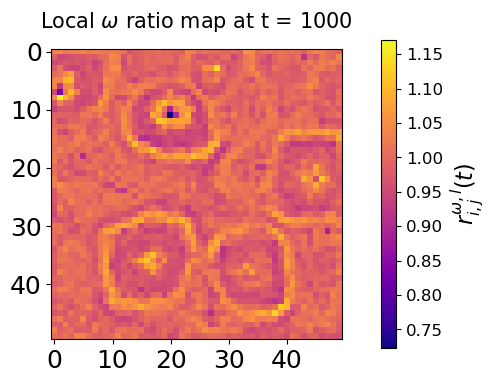

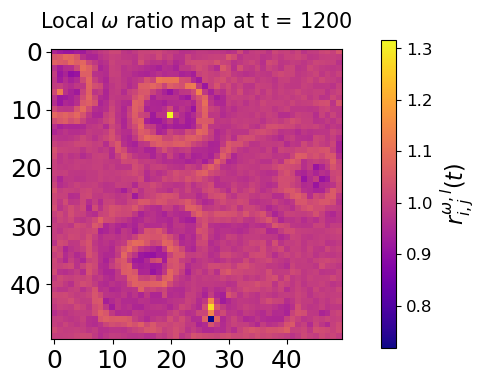

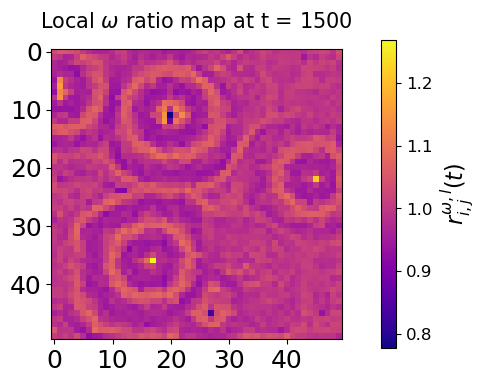

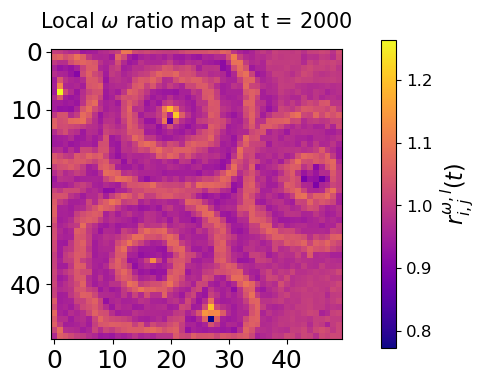

In [77]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to obtain the neighboring phases while applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*((np.sin(phi_up-phi)) ** 2) + L*((np.sin(phi_down-phi)) ** 2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*((np.sin(phi_left-phi)) ** 2) + L*((np.sin(phi_right-phi)) ** 2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt
   
# function to compute the local frequency ratio maps

def local_frequency_ratio_map_ERIC_2d_excitable(N, T, dt, K, L, phi_initial, omega_initial, b):
    
    num_steps = int(T/dt) + 1
    
    Y = np.zeros((num_steps, N, N)) # ratio of dphi_dt and average of dphi_dt at some t
    
    omega = omega_initial.copy()     
    phi = phi_initial.copy()
    
         
    dphi_dt  = np.zeros((N, N))
    dphi_dt_local  = np.zeros((N, N))
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        
        dphi_dt = ERIC_2d_excitable(phi, N, K, omega, L, b)
        
        dphi_dt_up = np.roll(dphi_dt, -1, axis=0)
        dphi_dt_up [-1, :]= dphi_dt[-1, :]
        dphi_dt_down = np.roll(dphi_dt, 1, axis=0)
        dphi_dt_down[0, :] = dphi_dt[0, :]
        dphi_dt_left = np.roll(dphi_dt, -1, axis=1)
        dphi_dt_left[:, -1] = dphi_dt[:, -1]
        dphi_dt_right = np.roll(dphi_dt, 1, axis=1)
        dphi_dt_right[:, 0] = dphi_dt[:, 0]
        
        
        dphi_dt_local = 1/4 * (dphi_dt_up + dphi_dt_down + dphi_dt_left + dphi_dt_right)
        
        Y[t,:,:] = dphi_dt / dphi_dt_local
        
        
    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(Y[-1,:,:], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$r^{\omega,l}_{i,j}(t)$', fontsize=16)
    plt.title(r'Local $\omega$ ratio map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Local_frequency_ratio_map_at_t = " + str(T) + "alloscillatory_narrowp3_incond1.jpg", dpi = 300)
    plt.show()
    
# Define limits of the uniform frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

b = 0.01

K = 0.8 * (w_max - w_min)
L = 1.7


omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the Y value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    local_frequency_ratio_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, phi_initial, omega_initial, b) 

## Randomp: $\theta_{in}=[-\pi,\pi]$

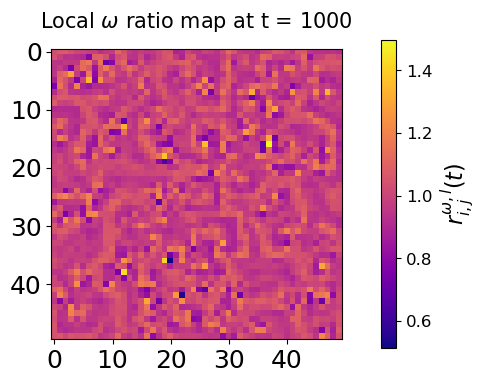

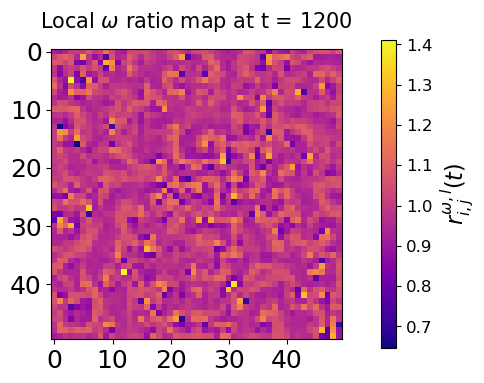

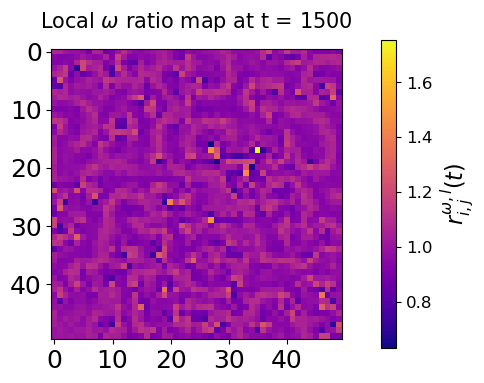

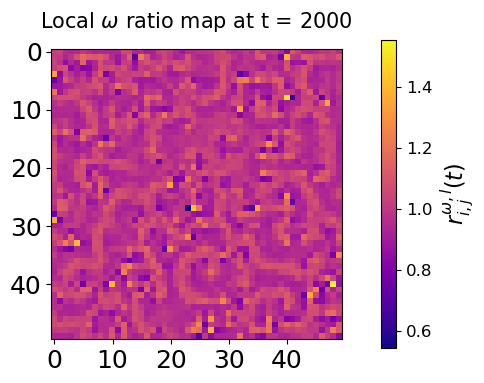

In [79]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to obtain the neighboring phases while applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*((np.sin(phi_up-phi)) ** 2) + L*((np.sin(phi_down-phi)) ** 2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*((np.sin(phi_left-phi)) ** 2) + L*((np.sin(phi_right-phi)) ** 2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt
   
# function to compute the local frequency ratio maps

def local_frequency_ratio_map_ERIC_2d_excitable(N, T, dt, K, L, phi_initial, omega_initial, b):
    
    num_steps = int(T/dt) + 1
    
    Y = np.zeros((num_steps, N, N)) # ratio of dphi_dt and average of dphi_dt at some t
    
    omega = omega_initial.copy()     
    phi = phi_initial.copy()
    
         
    dphi_dt  = np.zeros((N, N))
    dphi_dt_local  = np.zeros((N, N))
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        
        dphi_dt = ERIC_2d_excitable(phi, N, K, omega, L, b)
        
        dphi_dt_up = np.roll(dphi_dt, -1, axis=0)
        dphi_dt_up [-1, :]= dphi_dt[-1, :]
        dphi_dt_down = np.roll(dphi_dt, 1, axis=0)
        dphi_dt_down[0, :] = dphi_dt[0, :]
        dphi_dt_left = np.roll(dphi_dt, -1, axis=1)
        dphi_dt_left[:, -1] = dphi_dt[:, -1]
        dphi_dt_right = np.roll(dphi_dt, 1, axis=1)
        dphi_dt_right[:, 0] = dphi_dt[:, 0]
        
        
        dphi_dt_local = 1/4 * (dphi_dt_up + dphi_dt_down + dphi_dt_left + dphi_dt_right)
        
        Y[t,:,:] = dphi_dt / dphi_dt_local
        
        
    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow(Y[-1,:,:], cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$r^{\omega,l}_{i,j}(t)$', fontsize=16)
    plt.title(r'Local $\omega$ ratio map at t = ' + str(T), fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Local_frequency_ratio_map_at_t = " + str(T) + "alloscillatory_randomp_incond1.jpg", dpi = 300)
    plt.show()
    
# Define limits of the uniform frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

b = 0.01

K = 0.8 * (w_max - w_min)
L = 1.7


omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)


# Plot the Y value at the final step using a colormap

T_list = [1000, 1200, 1500, 2000]
for i in range(len(T_list)):
    local_frequency_ratio_map_ERIC_2d_excitable(N, T_list[i], dt, K, L, phi_initial, omega_initial, b) 

## Average period map

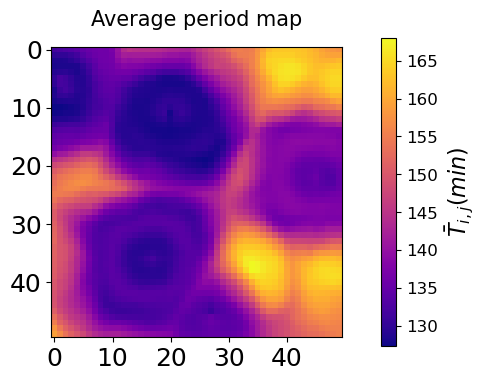

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# Legacy seed for reproducibility 

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=(N,N))
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones((N,N))*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution with width less than 2*pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, (N,N))  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, (N, N))
    return phase

# function to obtain the neighboring phases after applying open boundary conditions

def get_neighbors(phi):
    phi_up = np.roll(phi, -1, axis=0)
    phi_up [-1, :]= phi[-1, :]
    phi_down = np.roll(phi, 1, axis=0)
    phi_down[0, :] = phi[0, :]
    phi_left = np.roll(phi, -1, axis=1)
    phi_left[:, -1] = phi[:, -1]
    phi_right = np.roll(phi, 1, axis=1)
    phi_right[:, 0] = phi[:, 0]
    return phi_up, phi_down, phi_left, phi_right

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):      
    phi_up, phi_down, phi_left, phi_right = get_neighbors(phi) 
    dphi_dt = np.zeros((N, N))
    dphi_dt += np.sin(phi_up-phi) + np.sin(phi_down-phi) + L*(np.sin(phi_up-phi)**2) + L*(np.sin(phi_down-phi)**2) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt    
    return dphi_dt
   
# function to compute and plot the instantaneous frequencies as a heatmap

def average_period_map_ERIC_2d_excitable(N, T, t0, dt, K, L, omega_initial, phi_initial, b):
    
    num_steps = int((T+t0)/dt) + 1

    Y = np.zeros((num_steps, N, N)) # ratio of dphi_dt and average of dphi_dt at some t
    
    omega = omega_initial.copy()    
    phi = phi_initial.copy()
    
         
    dphi_dt  = np.zeros((N, N))
    
    
    for t in range(num_steps): 
        k1 = ERIC_2d_excitable(phi, N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)
        
        
        Y[t,:,:] = phi
        
        
    # Plot the rho value at the final step
    plt.figure(figsize=(5, 5))
    phasemap = plt.imshow( 2*np.pi / ( (Y[int((t0+T)/dt),:,:] - Y[int(t0/dt),:,:]) / T ), cmap='plasma') 
    cbar = plt.colorbar(phasemap, shrink = 0.8 , pad = 0.1)
    cbar.ax.tick_params(labelsize = 12)
    cbar.ax.set_ylabel(r'$\bar{T}_{i,j}(min) $', fontsize=16)
    plt.title('Average period map', fontsize = 15, pad = 15)
    plt.xticks(fontsize=18)  
    plt.yticks(fontsize=18)
#    plt.savefig("Average_period_map_narrowp_2DERIC+excitability.jpg", dpi = 300, bbox_inches = 'tight')
    plt.show()
    
    
w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#in_phase = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01


t0 = 1000
T = 1000

K = 0.8 * (w_max - w_min)
L = 1.7

b = 0.01

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the average period map


average_period_map_ERIC_2d_excitable(N, T, t0, dt,K, L, omega_initial, phi_initial, b) 

## 1D ERIC model with excitability

## Narrowp3: $\theta_{in}=[-\pi/2,\pi/2]$, $b=0.01$ min$^{-1}$

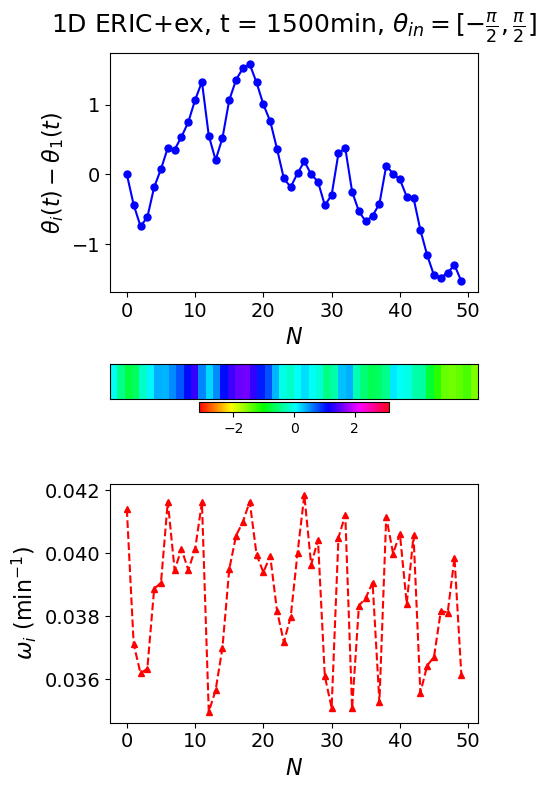

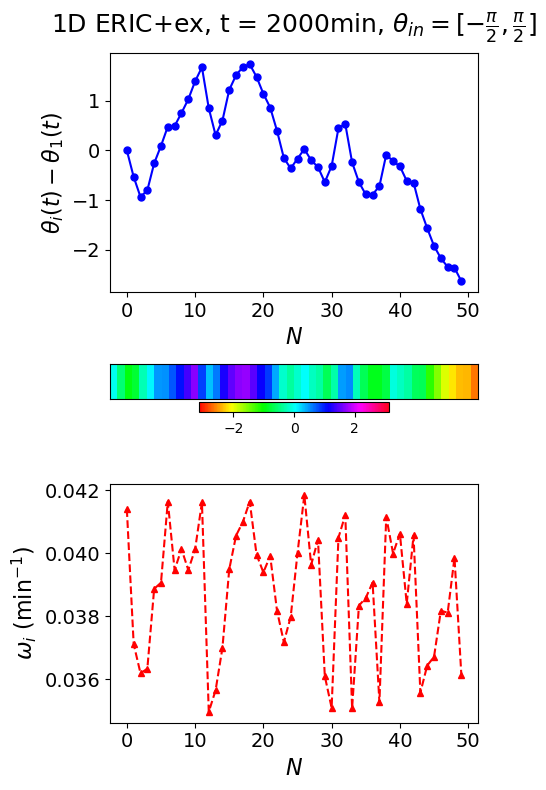

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import truncnorm
import matplotlib.gridspec as gridspec

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=N)
    return omega

# Truncated normal distribution

def omega_trunc_normal(w_min, w_max, mean, scale, N):    

    # Define the parameters of the truncated normal distribution
    a = (w_min - mean) / scale  # Lower bound
    b = (w_max - mean) / scale  # Upper bound


    # Generate random samples from the truncated original distribution
    omega = truncnorm.rvs(a, b , loc = mean , scale = scale , size = N)
    
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones(N)*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, N)  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, N) # randomp
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_left = np.roll(phi, -1)
    phi_left[-1] = phi[-1]
    phi_right = np.roll(phi, 1)
    phi_right[0] = phi[0] 

    dphi_dt = np.zeros(N) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_1d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N))  # Storing the phases
    
    X_diff = np.zeros((num_steps, N))
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)

        X[t, :] = phi
        
        X_diff[t,:] = X[t,:] - X[t,0]
        
        X_diff[t,:] = np.angle(np.exp(1j * X_diff[t,:]))
    X_diff_last = X_diff[-1, :]
    X_diff_2D = X_diff_last.reshape(1, N)
    
    cmap = plt.get_cmap('hsv') 
    norm = plt.Normalize(vmin=-np.pi, vmax=np.pi)  # Normalizing from -pi to pi
#    norm = mcolors.Normalize(vmin=-np.pi, vmax=np.pi)
    
    
    # Define the grid
    fig = plt.figure(figsize=(5, 8))
    gs = gridspec.GridSpec(3, 1, height_ratios=[1, 0.2, 1])  # Adjust the middle plot height ratio as needed

    # Plot X_diff[-1, :] vs N
    ax1 = fig.add_subplot(gs[0])
    ax1.plot(range(N), X_diff[-1, :], marker='o', linestyle='-', markersize=5, color='b')
    ax1.set_xlabel(r'$N$', fontsize=16)
    ax1.set_ylabel(r'$\theta_{i}(t)-\theta_{1}(t)$', fontsize=16)
    ax1.set_title('1D ERIC+ex, t = ' + str(T) + r'min, $ \theta_{in}=[-\frac{\pi}{2},\frac{\pi}{2}]$', fontsize=18, pad = 15)
    ax1.tick_params(axis='both', labelsize=14)

    # Plot the phase map
    ax2 = fig.add_subplot(gs[1])
    img = ax2.imshow(X_diff_2D, aspect='auto', cmap=cmap, norm=norm)
    ax2.set_yticks([])
    ax2.set_xticks([])

    # Add a colorbar
    cbar = fig.colorbar(img, ax=ax2, orientation='horizontal', fraction=0.2, pad=0.08)
#    cbar.set_label('Phase Difference (rad)', fontsize=16)

    # Plot omega vs N
    ax3 = fig.add_subplot(gs[2])
    ax3.plot(range(N), omega, marker='^', linestyle='--', markersize=5, color='r')
    ax3.set_xlabel(r'$N$', fontsize=16)
    ax3.set_ylabel(r'$\omega_{i}$ (min$^{-1})$', fontsize=16)
    ax3.tick_params(axis='both', labelsize=14)

    # Adjust layout
    plt.tight_layout()
#    plt.savefig("Phase_lag_at_t = " + str(T) + "_1DERIC_excitable_narrowp_uniformf.jpg", dpi=300, bbox_inches = 'tight')
    plt.show()

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

# for use with truncated normal distributions
mean = 2*np.pi/165
scale = 2*np.pi*(1/160 - 1/165)

#omega_initial = omega_trunc_normal(w_min, w_max, mean, scale, N)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_narrow(N)


# Plot the X value at the final step using a colormap

T_list = [1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_1d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)  

## Randomp: $\theta_{in}=[-\pi,\pi]$, $b=0.01$ min$^{-1}$

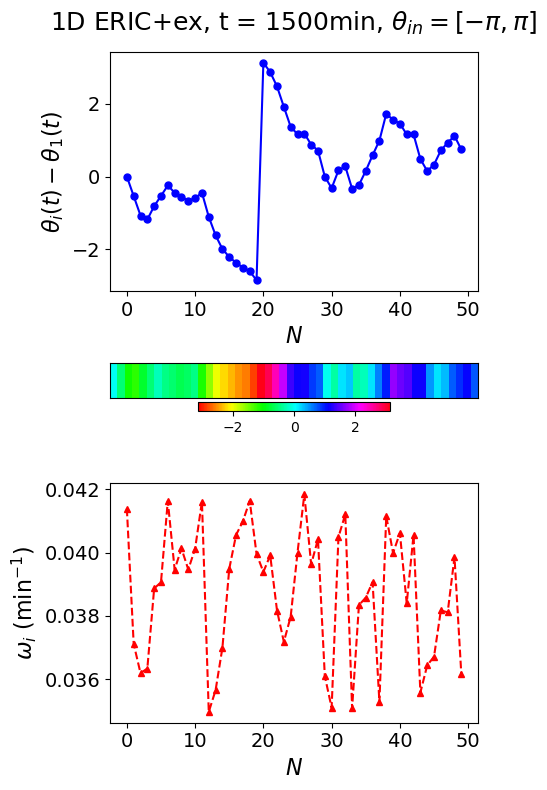

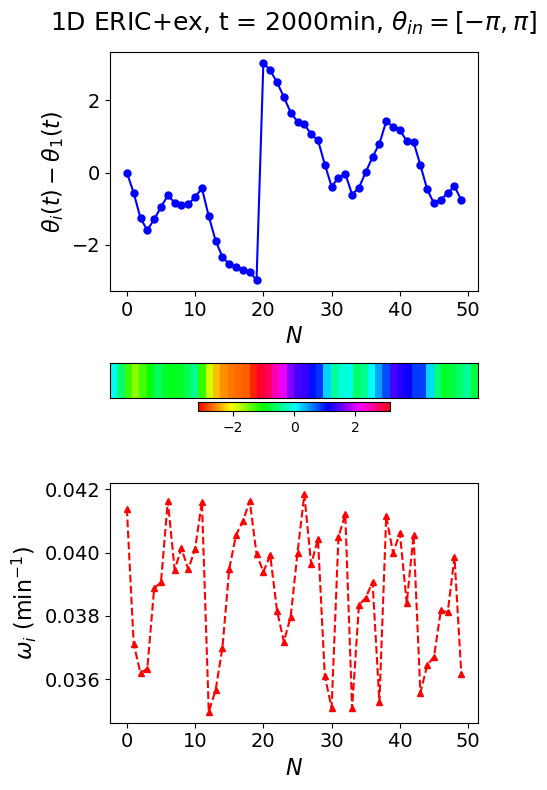

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import truncnorm
import matplotlib.gridspec as gridspec

# Legacy seed for reproducibility

np.random.seed(12345)

# Uniform frequency distribution

def omega_dist(w_min, w_max, N):
    omega = np.random.uniform(w_min,w_max, size=N)
    return omega

# Truncated normal distribution

def omega_trunc_normal(w_min, w_max, mean, scale, N):    

    # Define the parameters of the truncated normal distribution
    a = (w_min - mean) / scale  # Lower bound
    b = (w_max - mean) / scale  # Upper bound


    # Generate random samples from the truncated original distribution
    omega = truncnorm.rvs(a, b , loc = mean , scale = scale , size = N)
    
    return omega

# homogenous phases

def phase_homo(N,angle):     # N is the number of oscillators along each axis
    phase = np.ones(N)*angle   # the angle variable can be set to any value between -pi and pi
    return phase

# Initial phase distribution of width less than 2 * pi

def phase_narrow(N):
    phase = np.random.uniform(-np.pi/2, np.pi/2, N)  # narrowp3
    return phase

# completely random initial phases

def phase_random(N):
    phase = np.random.uniform(-np.pi, np.pi, N) # randomp
    return phase

# 2D ERIC model with excitability

def ERIC_2d_excitable(phi, N, K, omega, L, b):        
    phi_left = np.roll(phi, -1)
    phi_left[-1] = phi[-1]
    phi_right = np.roll(phi, 1)
    phi_right[0] = phi[0] 

    dphi_dt = np.zeros(N) 
    dphi_dt += np.sin(phi_left-phi) + np.sin(phi_right-phi) + L*(np.sin(phi_left-phi)**2) + L*(np.sin(phi_right-phi)**2) 
    dphi_dt = omega - b * np.sin(phi) + K * dphi_dt
    
    return dphi_dt
        
# function to compute and plot the phase maps

def phase_map_ERIC_1d_excitable(N, T, dt, K, L, omega_initial, phi_initial, b):
    num_steps = int(T / dt) + 1
    X = np.zeros((num_steps, N))  # Storing the phases
    
    X_diff = np.zeros((num_steps, N))
    
    omega = omega_initial.copy()
    phi = phi_initial.copy()

    for t in range(num_steps):
        k1 = ERIC_2d_excitable(phi,N, K, omega, L, b)
        k2 = ERIC_2d_excitable(phi + 0.5 * dt * k1, N, K, omega, L, b)
        k3 = ERIC_2d_excitable(phi + 0.5 * dt * k2, N, K, omega, L, b)
        k4 = ERIC_2d_excitable(phi + dt * k3, N, K, omega, L, b)

        phi += (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)

        X[t, :] = phi
        
        X_diff[t,:] = X[t,:] - X[t,0]
        
        X_diff[t,:] = np.angle(np.exp(1j * X_diff[t,:]))
    X_diff_last = X_diff[-1, :]
    X_diff_2D = X_diff_last.reshape(1, N)
    
    cmap = plt.get_cmap('hsv') 
    norm = plt.Normalize(vmin=-np.pi, vmax=np.pi)  # Normalizing from -pi to pi
#    norm = mcolors.Normalize(vmin=-np.pi, vmax=np.pi)
    
    
    # Define the grid
    fig = plt.figure(figsize=(5, 8))
    gs = gridspec.GridSpec(3, 1, height_ratios=[1, 0.2, 1])  # Adjust the middle plot height ratio as needed

    # Plot X_diff[-1, :] vs N
    ax1 = fig.add_subplot(gs[0])
    ax1.plot(range(N), X_diff[-1, :], marker='o', linestyle='-', markersize=5, color='b')
    ax1.set_xlabel(r'$N$', fontsize=16)
    ax1.set_ylabel(r'$\theta_{i}(t)-\theta_{1}(t)$', fontsize=16)
    ax1.set_title('1D ERIC+ex, t = ' + str(T) + r'min, $ \theta_{in}=[-\pi,\pi]$', fontsize=18, pad = 15)
    ax1.tick_params(axis='both', labelsize=14)

    # Plot the phase map
    ax2 = fig.add_subplot(gs[1])
    img = ax2.imshow(X_diff_2D, aspect='auto', cmap=cmap, norm=norm)
    ax2.set_yticks([])
    ax2.set_xticks([])

    # Add a colorbar
    cbar = fig.colorbar(img, ax=ax2, orientation='horizontal', fraction=0.2, pad=0.08)
#    cbar.set_label('Phase Difference (rad)', fontsize=16)

    # Plot omega vs N
    ax3 = fig.add_subplot(gs[2])
    ax3.plot(range(N), omega, marker='^', linestyle='--', markersize=5, color='r')
    ax3.set_xlabel(r'$N$', fontsize=16)
    ax3.set_ylabel(r'$\omega_{i}$ (min$^{-1})$', fontsize=16)
    ax3.tick_params(axis='both', labelsize=14)

    # Adjust layout
    plt.tight_layout()
#    plt.savefig("Phase_lag_at_t = " + str(T) + "_1DERIC_excitable_randomp_uniformf.jpg", dpi=300, bbox_inches = 'tight')
    plt.show()

# Define the limits of the frequency distribution

w_min = 2 * np.pi / 180
w_max = 2 * np.pi / 150


#angle = np.pi/4
    
# Define the model parameters
N = 50
dt = 0.01

# Fixed value of b

b = 0.01


K = 0.8 * (w_max - w_min)
L = 1.7

# for use with truncated normal distributions
mean = 2*np.pi/165
scale = 2*np.pi*(1/160 - 1/165)

#omega_initial = omega_trunc_normal(w_min, w_max, mean, scale, N)

omega_initial = omega_dist(w_min, w_max, N)
phi_initial = phase_random(N)


# Plot the X value at the final step using a colormap

T_list = [1500, 2000]
for i in range(len(T_list)):
    phase_map_ERIC_1d_excitable(N, T_list[i], dt, K, L, omega_initial, phi_initial, b)  